<a href="https://colab.research.google.com/github/yashraj31102003/Capstone-Project/blob/main/Spotify_Genre_Segmentation_%26_Automated_Recommendation_System.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🎵 Spotify Genre Segmentation & Automated Recommendation System

<div align="center">

## Major Project

### Group No. 44

</div>

---

## 👥 Project Team

**Team Member 1:** Yash Raj,
**Phone Number:** 7979045949

**Team Member 2:** Rahul A,
**Phone Number:** 9843437320

**Team Member 3:** Hariharan J,
**Phone Number:** 9345817945

**Team Member 4:** Maryam Maroof,
**Phone Number:** +971503507034

---

## 📌 Project Information

| **Project Information**     | **Details**                    |
| --------------------------- | ------------------------------ |
| **Project Type**            | Major Project                  |
| **Group No.**               | 44                             |
| **Company Name**            | Corizo Edutech Private Limited |
| **Domain**                  | Artificial Intelligence        |
| **Development Environment** | Google Colab                   |
| **Programming Language**    | Python                         |

---

## 🎵 Project Introduction

The **Spotify Genre Segmentation & Automated Recommendation System** is an end-to-end Data Science and Machine Learning project developed to analyze music characteristics, discover natural groupings among songs, and generate automated song recommendations.

The project utilizes Spotify track metadata and numerical audio features to analyze the characteristics of songs across different genres and subgenres.

The proposed system integrates **data preprocessing, exploratory data analysis, feature engineering, feature standardization, unsupervised machine learning, dimensionality reduction, cluster analysis, and content-based recommendation** within a unified analytical pipeline.

The system uses measurable audio characteristics such as **danceability, energy, loudness, speechiness, acousticness, instrumentalness, liveness, valence, tempo, key, mode, track duration, and popularity** to represent individual tracks.

The machine learning component applies **K-Means Clustering** to discover natural segments within the music dataset. **Principal Component Analysis (PCA)** is used to reduce the dimensionality of the feature space and visualize the discovered structure.

For automated recommendations, the system applies **Cosine Similarity** to identify tracks with similar audio-feature profiles. A cluster-aware recommendation approach is additionally developed to refine the candidate selection process.

The final solution combines analytical insights and machine learning into an **interactive music recommendation framework**.

---

## 🎯 Primary Goal

> To develop a reproducible and interpretable machine learning system that transforms Spotify music data into meaningful audio-based segments and automated similarity-driven song recommendations.


# ⚙️ Environment Initialization

Before beginning the data analysis and machine learning workflow, the
computational environment is configured with the libraries required for data
processing, visualization, clustering, dimensionality reduction, similarity
analysis, interactive visualization, and model persistence.

The environment is designed to support the complete project lifecycle, from
raw dataset acquisition and inspection to the final recommendation system.

A fixed random state is also established to improve the reproducibility of
machine learning operations.

In [1]:
!pip -q install joblib scikit-learn seaborn plotly ipywidgets

import warnings
warnings.filterwarnings("ignore")

import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity

import joblib

RANDOM_STATE = 42

pd.set_option("display.max_columns", 100)
pd.set_option("display.max_colwidth", 80)

sns.set_theme(style="whitegrid")

print("Environment initialized successfully.")
print("Random state:", RANDOM_STATE)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 53.4 MB/s eta 0:00:00
Environment initialized successfully.
Random state: 42


## Observation

The computational environment has been initialized successfully.

All required Python libraries for data processing, visualization, machine learning,
dimensionality reduction, similarity analysis, and model persistence are available.

The random state has been fixed at 42 to ensure reproducibility across the
machine learning workflow.

The environment is ready for the Spotify dataset acquisition and loading stage.

# 📂 Dataset Acquisition

The Spotify dataset is the primary data source for this project. It contains
track-level metadata, playlist genre information, and numerical audio features
required for genre segmentation and automated recommendation.

The dataset used in this project contains Spotify track information across
multiple playlist genres and sub-genres. The dataset will be retrieved directly
from the GitHub repository so that the notebook remains reproducible and the
same source can be accessed whenever the project is executed.

Using a fixed online dataset source also eliminates dependency on manually
renamed or incorrectly uploaded files.

In [2]:
dataset_url = "https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv"

df = pd.read_csv(dataset_url)

print("Dataset acquired successfully.")
print("Rows:", df.shape[0])
print("Columns:", df.shape[1])
print("Dataset shape:", df.shape)

Dataset acquired successfully.
Rows: 32833
Columns: 23
Dataset shape: (32833, 23)


## Observation

The Spotify dataset has been acquired successfully from the GitHub source.

The dataset contains 32,833 records and 23 columns, which matches the expected
dataset structure specified for this project.

The dataset is now available in the Pandas DataFrame and is ready for detailed
structural inspection before preprocessing.

No records, columns, or values have been modified during the acquisition stage.

# 📊 Dataset Overview

The dataset overview provides an initial understanding of the size and structure
of the Spotify dataset.

This stage examines the dataset dimensions, column names, data types, and a
small sample of records. These checks help verify that the downloaded dataset
contains the expected Spotify track metadata, genre information, and audio
features before detailed data-quality analysis begins.

The raw dataset is inspected without applying any preprocessing operations.

In [3]:
print("Dataset Shape:")
print(df.shape)

print("\nColumn Names:")
print(df.columns.tolist())

print("\nData Types:")
display(df.dtypes.to_frame("Data Type"))

print("\nFirst 5 Records:")
display(df.head())

Dataset Shape:
(32833, 23)

Column Names:
['track_id', 'track_name', 'track_artist', 'track_popularity', 'track_album_id', 'track_album_name', 'track_album_release_date', 'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']

Data Types:


,Data Type
track_id,object
track_name,object
track_artist,object
track_popularity,int64
track_album_id,object
track_album_name,object
track_album_release_date,object
playlist_name,object
playlist_id,object
playlist_genre,object



First 5 Records:


,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxury Remix,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury Remix],2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.748,0.916,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.726,0.815,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.675,0.931,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.718,0.930,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.650,0.833,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


## Observation

The dataset contains 32,833 records and 23 columns, confirming the expected
Spotify dataset structure.

The columns include track metadata, playlist information, genre and sub-genre
labels, popularity, and audio characteristics such as danceability, energy,
loudness, speechiness, acousticness, instrumentalness, liveness, valence,
tempo, key, and mode.

The categorical metadata fields are stored primarily as object data types,
while the audio features and popularity values are stored as numerical data
types.

The initial records confirm that the dataset contains valid Spotify track
information and is suitable for the planned genre segmentation and
recommendation workflow.

No preprocessing has been performed yet.

# 📖 Data Dictionary & Feature Description

Understanding the meaning and role of each dataset feature is essential before
performing preprocessing and machine learning.

The Spotify dataset contains three broad categories of information: track and
album metadata, playlist and genre information, and numerical audio features.

The metadata identifies individual tracks and their associated artists,
albums, playlists, and release dates.

The genre-related fields provide the known playlist genre and sub-genre labels.
These labels will primarily be used for exploratory analysis and for comparing
the discovered unsupervised clusters against known genre categories.

The numerical audio features describe measurable characteristics of each track
and will form the foundation of the clustering and recommendation models.

The following stage programmatically separates the numerical and categorical
features so that the dataset structure can be analyzed systematically.

In [4]:
numerical_columns = df.select_dtypes(include=np.number).columns.tolist()
categorical_columns = df.select_dtypes(include="object").columns.tolist()

print("Numerical Features:")
print(numerical_columns)

print("\nNumber of Numerical Features:", len(numerical_columns))

print("\nCategorical Features:")
print(categorical_columns)

print("\nNumber of Categorical Features:", len(categorical_columns))

Numerical Features:
['track_popularity', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']

Number of Numerical Features: 13

Categorical Features:
['track_id', 'track_name', 'track_artist', 'track_album_id', 'track_album_name', 'track_album_release_date', 'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre']

Number of Categorical Features: 10


## Observation

The dataset contains 13 numerical features and 10 categorical features.

The numerical features include track popularity, audio characteristics, tempo,
key, mode, and track duration. These features will provide the primary inputs
for the clustering and recommendation stages.

The categorical features contain track, album, playlist, genre, sub-genre, and
release-date information. These fields will mainly support metadata analysis,
exploratory analysis, and interpretation of the discovered clusters.

The feature structure is consistent with the requirements of the proposed
Spotify genre segmentation and recommendation system.

The dataset is now structurally verified and ready for detailed initial data
inspection.

# 🔎 Initial Data Inspection

Before performing data cleaning and preprocessing, the raw dataset is examined
for its overall statistical and structural characteristics.

This stage provides a baseline understanding of the numerical features and
helps identify potential issues such as unusual ranges, missing observations,
and other data-quality concerns.

The inspection is performed on the original dataset so that any required
cleaning decisions can be made based on the actual data.

In [5]:
print("Dataset Information:")
df.info()

print("\nNumerical Summary:")
display(df.describe().T)

print("\nUnique Values:")
display(df.nunique().to_frame("Unique Values"))

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null

,count,mean,std,min,25%,50%,75%,max
track_popularity,32833.0,42.477081,24.984074,0.000000,24.0000,45.000000,62.00000,100.000
danceability,32833.0,0.654850,0.145085,0.000000,0.5630,0.672000,0.76100,0.983
energy,32833.0,0.698619,0.180910,0.000175,0.5810,0.721000,0.84000,1.000
key,32833.0,5.374471,3.611657,0.000000,2.0000,6.000000,9.00000,11.000
loudness,32833.0,-6.719499,2.988436,-46.448000,-8.1710,-6.166000,-4.64500,1.275
mode,32833.0,0.565711,0.495671,0.000000,0.0000,1.000000,1.00000,1.000
speechiness,32833.0,0.107068,0.101314,0.000000,0.0410,0.062500,0.13200,0.918
acousticness,32833.0,0.175334,0.219633,0.000000,0.0151,0.080400,0.25500,0.994
instrumentalness,32833.0,0.084747,0.224230,0.000000,0.0000,0.000016,0.00483,0.994
liveness,32833.0,0.190176,0.154317,0.000000,0.0927,0.127000,0.24800,0.996



Unique Values:


,Unique Values
track_id,28356
track_name,23449
track_artist,10692
track_popularity,101
track_album_id,22545
track_album_name,19743
track_album_release_date,4530
playlist_name,449
playlist_id,471
playlist_genre,6


## Observation

The initial inspection confirms that the dataset contains 32,833 records across
23 columns.

The dataset contains 32,828 non-null values in each of the track name, track
artist, and track album name fields, indicating the presence of missing values
in these three columns.

All remaining columns contain 32,833 non-null values at this stage.

The numerical summary shows that the audio features have different scales and
ranges. For example, danceability, energy, acousticness, and valence are
bounded between 0 and 1, while loudness and tempo have substantially different
numeric ranges. This difference will be important during feature
standardization before clustering.

The unique-value analysis confirms 6 playlist genres and 24 playlist
sub-genres. The track ID contains 28,356 unique values compared with 32,833
records, indicating repeated track IDs that require further investigation.

The raw dataset therefore requires systematic data-quality assessment before
feature engineering and machine learning.

# 🧪 Data Quality Assessment

A detailed data-quality assessment is performed before modifying the raw
dataset.

The assessment focuses on missing values, duplicate records, data types,
numerical ranges, and categorical consistency.

This stage establishes the quality of the original dataset and identifies the
specific preprocessing operations required to prepare a reliable analytical
dataset.

All quality checks are performed on the raw DataFrame without removing or
transforming any records.

In [7]:
missing_count = df.isnull().sum()
missing_percentage = (missing_count / len(df)) * 100

duplicate_rows = df.duplicated().sum()
duplicate_track_ids = df["track_id"].duplicated().sum()

print("Missing Values:")
display(
    pd.DataFrame({
        "Missing Count": missing_count,
        "Missing Percentage": missing_percentage
    }).query("`Missing Count` > 0")
)

print("Complete Duplicate Rows:", duplicate_rows)
print("Duplicate Track IDs:", duplicate_track_ids)

print("\nGenre Count:")
display(df["playlist_genre"].value_counts())

print("\nSub-Genre Count:")
display(df["playlist_subgenre"].value_counts())

Missing Values:


,Missing Count,Missing Percentage
track_name,5,0.015229
track_artist,5,0.015229
track_album_name,5,0.015229


Complete Duplicate Rows: 0
Duplicate Track IDs: 4477

Genre Count:


,count
playlist_genre,
edm,6043
rap,5746
pop,5507
r&b,5431
latin,5155
rock,4951



Sub-Genre Count:


,count
playlist_subgenre,
progressive electro house,1809
southern hip hop,1675
indie poptimism,1672
latin hip hop,1656
neo soul,1637
pop edm,1517
electro house,1511
hard rock,1485
gangster rap,1458


## Observation

The data-quality assessment shows that only three columns contain missing values:
`track_name`, `track_artist`, and `track_album_name`. Each column contains 5
missing records, representing approximately 0.015% of the dataset.

There are no completely duplicated rows in the dataset. However, 4,477 records
contain duplicate `track_id` values, indicating that the same tracks occur
multiple times in the raw dataset.

The dataset contains six playlist genres, with EDM having the highest number of
records at 6,043 and Rock having the lowest at 4,951. The genre distribution is
therefore not perfectly uniform.

All 24 expected playlist sub-genres are present. The largest sub-genre is
Progressive Electro House with 1,809 records, while Reggaeton has the lowest
count with 949 records.

These findings confirm that missing-value treatment and duplicate track
analysis are the primary data-cleaning requirements before proceeding to feature
engineering and machine learning.

# 📊 Data Quality Dashboard

A visual data-quality dashboard is created to provide a compact overview of
the major quality characteristics identified during the initial assessment.

The dashboard summarizes missing values, duplicate track IDs, and the
distribution of playlist genres.

Visualizing these characteristics makes it easier to identify data-quality
issues and understand the composition of the dataset before applying cleaning
operations.

,Metric,Value
0,Total Records,32833
1,Total Columns,23
2,Missing Values,15
3,Complete Duplicate Rows,0
4,Duplicate Track IDs,4477
5,Playlist Genres,6
6,Playlist Sub-Genres,24


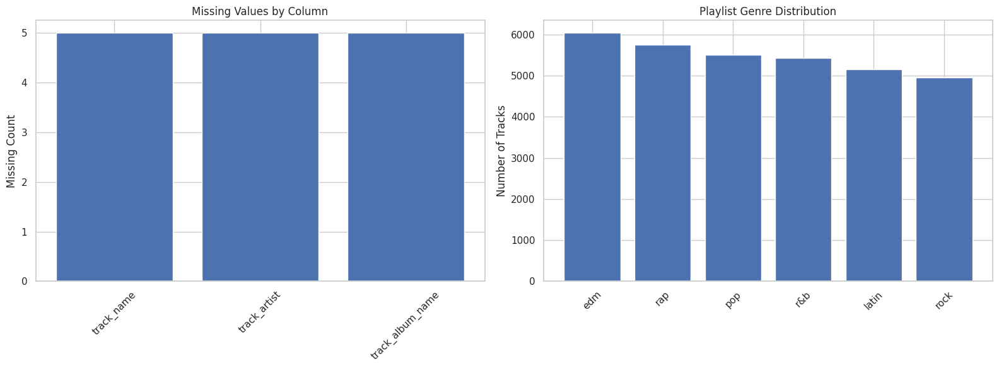

In [8]:
quality_summary = pd.DataFrame({
    "Metric": [
        "Total Records",
        "Total Columns",
        "Missing Values",
        "Complete Duplicate Rows",
        "Duplicate Track IDs",
        "Playlist Genres",
        "Playlist Sub-Genres"
    ],
    "Value": [
        len(df),
        df.shape[1],
        df.isnull().sum().sum(),
        df.duplicated().sum(),
        df["track_id"].duplicated().sum(),
        df["playlist_genre"].nunique(),
        df["playlist_subgenre"].nunique()
    ]
})

display(quality_summary)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

missing_data = df.isnull().sum()
missing_data = missing_data[missing_data > 0]

axes[0].bar(missing_data.index, missing_data.values)
axes[0].set_title("Missing Values by Column")
axes[0].set_ylabel("Missing Count")
axes[0].tick_params(axis="x", rotation=45)

genre_data = df["playlist_genre"].value_counts()

axes[1].bar(genre_data.index, genre_data.values)
axes[1].set_title("Playlist Genre Distribution")
axes[1].set_ylabel("Number of Tracks")
axes[1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

## Observation

The data-quality dashboard confirms that the dataset contains 32,833 records and
23 columns.

A total of 15 missing values are present across three metadata columns:
`track_name`, `track_artist`, and `track_album_name`. Each of these columns
contains 5 missing values.

No complete duplicate rows are present in the dataset. However, 4,477 duplicate
track ID occurrences are identified, confirming that repeated tracks exist in
the raw dataset.

The dataset contains 6 playlist genres and 24 playlist sub-genres. The genre
distribution shows that EDM has the highest number of tracks, while Rock has
the lowest number among the six genres.

The dashboard provides a clear baseline of the dataset quality and confirms
that missing-value treatment and duplicate-track handling are required before
further analysis.

# 🧹 Preprocessing Strategy

The preprocessing stage prepares the raw Spotify dataset for exploratory
analysis, clustering, and recommendation modeling.

The cleaning process is designed to preserve useful track information while
removing records that may introduce redundancy or inconsistency into the
machine learning pipeline.

The preprocessing workflow includes missing-value treatment, duplicate-track
handling, data-type validation, numerical range validation, and post-cleaning
verification.

Missing values are present only in track and album metadata fields. Since these
fields are not required as numerical inputs for clustering, the affected
records will be removed to maintain complete metadata for the retained tracks.

Duplicate track IDs will be handled by retaining a single representative
record for each unique track. This prevents repeated occurrences of the same
track from disproportionately influencing the clustering and recommendation
models.

The cleaned dataset will then be validated before feature engineering and
machine learning operations are performed.

In [9]:
print("Preprocessing Strategy")
print("1. Identify and remove records with missing track metadata")
print("2. Remove duplicate track IDs")
print("3. Validate the cleaned dataset")
print("4. Perform feature engineering")
print("5. Prepare numerical features for machine learning")

Preprocessing Strategy
1. Identify and remove records with missing track metadata
2. Remove duplicate track IDs
3. Validate the cleaned dataset
4. Perform feature engineering
5. Prepare numerical features for machine learning


## Observation

The preprocessing strategy establishes a systematic workflow for preparing the
Spotify dataset for subsequent analysis and machine learning.

The identified preprocessing steps address the major data-quality issues found
during the assessment, including missing metadata and duplicate track IDs.

The workflow also includes post-cleaning validation to ensure that the resulting
dataset maintains structural consistency before feature engineering.

Feature engineering will subsequently create useful derived variables, while
numerical feature preparation will ensure that the selected audio features are
suitable for clustering and similarity-based recommendation.

# 🧹 Missing Value Treatment

The data-quality assessment identified missing values in the track metadata
fields `track_name`, `track_artist`, and `track_album_name`.

Since these missing records affect only a very small portion of the dataset and
the affected metadata fields are important for identifying and displaying
tracks in the recommendation system, the corresponding records will be removed.

Removing these incomplete records avoids introducing artificial metadata values
and ensures that the retained dataset contains complete track identification
information.

The number of records before and after treatment will be compared to verify the
effect of this preprocessing operation.

In [10]:
rows_before_missing = len(df)

df = df.dropna(
    subset=["track_name", "track_artist", "track_album_name"]
).copy()

rows_after_missing = len(df)
rows_removed_missing = rows_before_missing - rows_after_missing

print("Rows Before Missing Value Treatment:", rows_before_missing)
print("Rows After Missing Value Treatment:", rows_after_missing)
print("Rows Removed:", rows_removed_missing)
print("Remaining Missing Values:", df[["track_name", "track_artist", "track_album_name"]].isnull().sum().sum())

Rows Before Missing Value Treatment: 32833
Rows After Missing Value Treatment: 32828
Rows Removed: 5
Remaining Missing Values: 0


## Observation

The missing-value treatment reduced the dataset from 32,833 records to 32,828
records.

A total of 5 records were removed because they contained missing values in the
track metadata fields.

After the treatment, the selected metadata fields contain zero remaining
missing values, confirming that the missing-value issue has been successfully
resolved.

The cleaned dataset is now ready for duplicate track analysis.

# 🔁 Duplicate Track Analysis

The raw dataset contains multiple occurrences of the same `track_id`. These
repeated track entries can occur because a track may appear in multiple
playlists or categories.

For the machine learning workflow, retaining multiple occurrences of the same
track could give repeated tracks greater influence during clustering and
similarity analysis.

Therefore, duplicate `track_id` records are analyzed after missing-value
treatment to determine the number of unique tracks and repeated track
occurrences.

The analysis compares the total number of records with the number of unique
track IDs and identifies the number of records that will need to be removed.

In [11]:
total_records = len(df)
unique_track_ids = df["track_id"].nunique()
duplicate_track_records = df["track_id"].duplicated().sum()

print("Total Records:", total_records)
print("Unique Track IDs:", unique_track_ids)
print("Duplicate Track Records:", duplicate_track_records)
print("Duplicate Percentage:", round((duplicate_track_records / total_records) * 100, 2))

Total Records: 32828
Unique Track IDs: 28352
Duplicate Track Records: 4476
Duplicate Percentage: 13.63


## Observation

After missing-value treatment, the dataset contains 32,828 records and 28,352
unique track IDs.

A total of 4,476 duplicate track records are present, representing 13.63% of
the cleaned dataset. These records correspond to repeated occurrences of
existing track IDs.

The presence of duplicate track IDs confirms that multiple entries of the same
track exist in the dataset. Removing these repeated track occurrences will
prevent frequently repeated tracks from receiving disproportionate influence
during clustering and recommendation analysis.

The dataset is therefore ready for duplicate track removal.

# 🗑️ Duplicate Track Removal

Duplicate track records are removed using the `track_id` field as the unique
identifier for each track.

For each track ID, only the first occurrence is retained. This produces a
track-level dataset in which every retained track has a unique identifier.

The number of records before and after duplicate removal is compared to verify
that the expected duplicate records have been removed.

The cleaned dataset will then be used for subsequent validation and feature
engineering.

In [12]:
rows_before_duplicates = len(df)

df = df.drop_duplicates(
    subset="track_id",
    keep="first"
).copy()

rows_after_duplicates = len(df)
rows_removed_duplicates = rows_before_duplicates - rows_after_duplicates

print("Rows Before Duplicate Removal:", rows_before_duplicates)
print("Rows After Duplicate Removal:", rows_after_duplicates)
print("Duplicate Rows Removed:", rows_removed_duplicates)
print("Unique Track IDs After Cleaning:", df["track_id"].nunique())

Rows Before Duplicate Removal: 32828
Rows After Duplicate Removal: 28352
Duplicate Rows Removed: 4476
Unique Track IDs After Cleaning: 28352


## Observation

The duplicate removal process reduced the dataset from 32,828 records to 28,352
records.

A total of 4,476 duplicate track records were removed, leaving exactly 28,352
unique track IDs in the cleaned dataset.

The final record count is consistent with the number of unique track IDs
identified during duplicate analysis, confirming that each retained track now
has a unique `track_id`.

The dataset has successfully completed the duplicate-removal stage and is ready
for post-cleaning validation.

# Post-Cleaning Validation

After missing-value treatment and duplicate-track removal, the cleaned dataset
is validated to confirm that the preprocessing operations were successful.

The validation checks the final dataset dimensions, remaining missing values,
duplicate rows, duplicate track IDs, and the number of unique genres and
sub-genres.

This step ensures that the cleaned dataset is structurally consistent before
feature engineering and exploratory data analysis are performed.

In [13]:
print("Final Dataset Shape:", df.shape)

print("\nTotal Missing Values:", df.isnull().sum().sum())

print("Complete Duplicate Rows:", df.duplicated().sum())

print("Duplicate Track IDs:", df["track_id"].duplicated().sum())

print("Unique Track IDs:", df["track_id"].nunique())

print("Unique Playlist Genres:", df["playlist_genre"].nunique())

print("Unique Playlist Sub-Genres:", df["playlist_subgenre"].nunique())

print("\nRemaining Missing Values:")
display(df.isnull().sum().loc[lambda x: x > 0])

Final Dataset Shape: (28352, 23)

Total Missing Values: 0
Complete Duplicate Rows: 0
Duplicate Track IDs: 0
Unique Track IDs: 28352
Unique Playlist Genres: 6
Unique Playlist Sub-Genres: 24

Remaining Missing Values:


,0


## Observation

The post-cleaning validation confirms that the final dataset contains 28,352
records and 23 columns.

There are no remaining missing values in the cleaned dataset, and no complete
duplicate rows are present.

The duplicate track ID count is zero, while the number of unique track IDs is
28,352. This confirms that every retained track has a unique identifier.

The dataset continues to contain 6 playlist genres and 24 playlist sub-genres,
indicating that the genre structure has been preserved during preprocessing.

The dataset has successfully passed the post-cleaning validation and is ready
for feature engineering.

# 🛠️ Feature Engineering

Feature engineering transforms the existing Spotify dataset into additional
variables that provide more useful representations for analysis and machine
learning.

The raw dataset contains track duration in milliseconds and release dates in
their original date format. These fields are converted into more interpretable
features.

Three derived features will be created:

- `duration_sec` converts track duration from milliseconds to seconds.
- `duration_min` converts track duration from milliseconds to minutes.
- `release_year` extracts the release year from the track album release date.
- `mode_label` provides a categorical interpretation of the numerical mode
  value.

These engineered features will improve interpretability and provide suitable
representations for subsequent exploratory analysis and machine learning.

In [14]:
df["duration_sec"] = df["duration_ms"] / 1000
df["duration_min"] = df["duration_ms"] / 60000
df["release_year"] = pd.to_datetime(
    df["track_album_release_date"],
    errors="coerce"
).dt.year
df["mode_label"] = df["mode"].map({
    0: "Minor",
    1: "Major"
})

print("Feature engineering completed.")
print("New Features:")
print(["duration_sec", "duration_min", "release_year", "mode_label"])

display(
    df[
        [
            "track_name",
            "duration_ms",
            "duration_sec",
            "duration_min",
            "track_album_release_date",
            "release_year",
            "mode",
            "mode_label"
        ]
    ].head()
)

Feature engineering completed.
New Features:
['duration_sec', 'duration_min', 'release_year', 'mode_label']


,track_name,duration_ms,duration_sec,duration_min,track_album_release_date,release_year,mode,mode_label
0,I Don't Care (with Justin Bieber) - Loud Luxury Remix,194754,194.754,3.245900,2019-06-14,2019.0,1,Major
1,Memories - Dillon Francis Remix,162600,162.600,2.710000,2019-12-13,2019.0,1,Major
2,All the Time - Don Diablo Remix,176616,176.616,2.943600,2019-07-05,2019.0,0,Minor
3,Call You Mine - Keanu Silva Remix,169093,169.093,2.818217,2019-07-19,2019.0,1,Major
4,Someone You Loved - Future Humans Remix,189052,189.052,3.150867,2019-03-05,2019.0,1,Major


## Observation

Feature engineering was completed successfully, and four new features were
created from the existing Spotify dataset.

The `duration_sec` and `duration_min` features successfully convert the original
track duration from milliseconds into seconds and minutes, respectively.

The `release_year` feature extracts the year from the album release date, while
the `mode_label` feature converts the numerical mode representation into the
categorical labels Major and Minor.

The displayed records confirm that the engineered values are correctly
associated with the original track information.

The dataset is now ready for engineered-feature validation.

# 🔍 Engineered Feature Validation

The newly created features are validated to ensure that their values are
consistent, complete, and suitable for further analysis.

The validation examines the data types, missing values, numerical ranges, and
unique values of the engineered features.

This step helps confirm that the feature engineering process has not introduced
unexpected values or inconsistencies into the cleaned dataset.

In [15]:
engineered_features = [
    "duration_sec",
    "duration_min",
    "release_year",
    "mode_label"
]

print("Engineered Feature Data Types:")
display(df[engineered_features].dtypes.to_frame("Data Type"))

print("\nMissing Values:")
display(df[engineered_features].isnull().sum().to_frame("Missing Values"))

print("\nNumerical Feature Summary:")
display(df[["duration_sec", "duration_min", "release_year"]].describe().T)

print("\nMode Label Distribution:")
display(df["mode_label"].value_counts())

Engineered Feature Data Types:


,Data Type
duration_sec,float64
duration_min,float64
release_year,float64
mode_label,object



Missing Values:


,Missing Values
duration_sec,0
duration_min,0
release_year,1681
mode_label,0



Numerical Feature Summary:


,count,mean,std,min,25%,50%,75%,max
duration_sec,28352.0,226.574631,61.081364,4.000000,187.741250,216.93300,254.975250,517.810000
duration_min,28352.0,3.776244,1.018023,0.066667,3.129021,3.61555,4.249588,8.630167
release_year,26671.0,2012.103146,10.246982,1957.000000,2010.000000,2016.00000,2019.000000,2020.000000



Mode Label Distribution:


,count
mode_label,
Major,16034
Minor,12318


## Observation

The engineered feature validation confirms that `duration_sec`,
`duration_min`, and `mode_label` contain no missing values and have the expected
data types.

The `release_year` feature contains 1,681 missing values. This occurs because
some original release-date values could not be converted into a valid year
during feature extraction.

The duration features contain 28,352 valid records, with an average track
duration of approximately 226.57 seconds or 3.78 minutes.

The `release_year` values that were successfully extracted range from 1957 to
2020, with an average release year of approximately 2012.

The `mode_label` feature contains two categories: Major with 16,034 tracks and
Minor with 12,318 tracks.

The engineered features are generally valid, but the missing `release_year`
values require appropriate treatment before the feature is used in subsequent
analysis or modeling.

# 🗓️ Release Year Missing Value Analysis

The engineered `release_year` feature contains missing values because some
records have incomplete or non-standard album release-date information.

Since release year is useful for temporal analysis but is not one of the
primary audio features required for the clustering model, the missing values
will be handled separately from the core audio-feature pipeline.

The distribution of available release years is examined to understand the
extent and pattern of the missing values before deciding how the feature will
be used.

In [16]:
release_year_missing = df["release_year"].isnull().sum()
release_year_valid = df["release_year"].notnull().sum()
release_year_missing_percentage = (release_year_missing / len(df)) * 100

print("Valid Release Years:", release_year_valid)
print("Missing Release Years:", release_year_missing)
print("Missing Percentage:", round(release_year_missing_percentage, 2))

print("\nRelease Year Range:")
print("Minimum:", int(df["release_year"].min()))
print("Maximum:", int(df["release_year"].max()))

Valid Release Years: 26671
Missing Release Years: 1681
Missing Percentage: 5.93

Release Year Range:
Minimum: 1957
Maximum: 2020


## Observation

The release year extraction produced 26,671 valid release years and 1,681
missing values.

The missing release years represent 5.93% of the cleaned dataset. The available
release years range from 1957 to 2020.

Since `release_year` is intended primarily for temporal analysis and is not a
core audio feature for the clustering model, the missing values will not be
used as a basis for removing additional tracks.

The missing release-year values will therefore be retained as missing, while
the feature will be handled separately from the core machine learning feature
set.

The dataset is ready for exploratory analysis of its numerical audio features
and track characteristics.

# 📈 Numerical Feature Distribution Analysis

The numerical Spotify features are examined to understand their individual
distributions before applying machine learning.

The analysis focuses on the audio characteristics and popularity-related
variables that describe each track.

Distribution analysis helps identify the typical values, spread, skewness, and
potential extreme observations within the dataset.

Understanding these distributions is important because the clustering model will
use standardized numerical features rather than the raw feature scales.

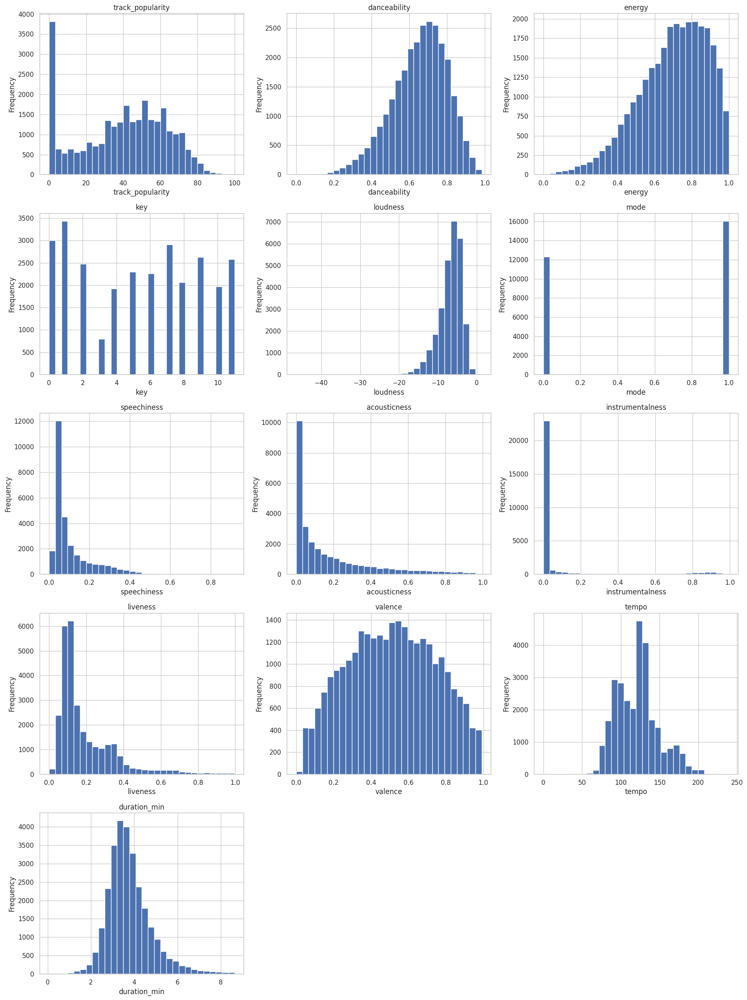

In [17]:
audio_features = [
    "track_popularity",
    "danceability",
    "energy",
    "key",
    "loudness",
    "mode",
    "speechiness",
    "acousticness",
    "instrumentalness",
    "liveness",
    "valence",
    "tempo",
    "duration_min"
]

fig, axes = plt.subplots(5, 3, figsize=(18, 24))

for ax, feature in zip(axes.flat, audio_features):
    ax.hist(df[feature], bins=30)
    ax.set_title(feature)
    ax.set_xlabel(feature)
    ax.set_ylabel("Frequency")

for ax in axes.flat[len(audio_features):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

## Observation

The numerical feature distributions show substantial variation in the statistical
behavior of the Spotify audio features.

`track_popularity` shows a large concentration of tracks at very low popularity
values, followed by a broader distribution across moderate popularity levels.

`danceability` is concentrated mainly around moderate to high values, while
`energy` is predominantly distributed toward higher values.

`key` contains discrete values from 0 to 11, and `mode` contains two distinct
categories represented by 0 and 1.

`loudness` is concentrated mainly in the range of approximately -15 to 0 dB,
with most tracks occurring around the central portion of this range.

`speechiness`, `acousticness`, and `instrumentalness` are strongly
right-skewed, with most tracks having relatively low values and fewer tracks
having high values.

`liveness` is also concentrated toward lower values, while `valence` shows a
more broadly distributed pattern across its available range.

`tempo` is concentrated mainly around the common musical tempo range, with
several noticeable concentrations in the distribution.

The different ranges and distribution patterns confirm that the numerical
features should be standardized before applying K-Means clustering so that
features with larger numerical scales do not dominate the distance
calculations.

# 🎚️ Feature Correlation Analysis

Correlation analysis is performed to understand the relationships between the
numerical Spotify audio features.

A correlation matrix is used to identify positive and negative relationships
between features. Strong correlations can reveal related musical
characteristics and help explain the structure of the dataset.

This analysis also provides an initial understanding of which audio features
may contribute similar or contrasting information to the clustering process.

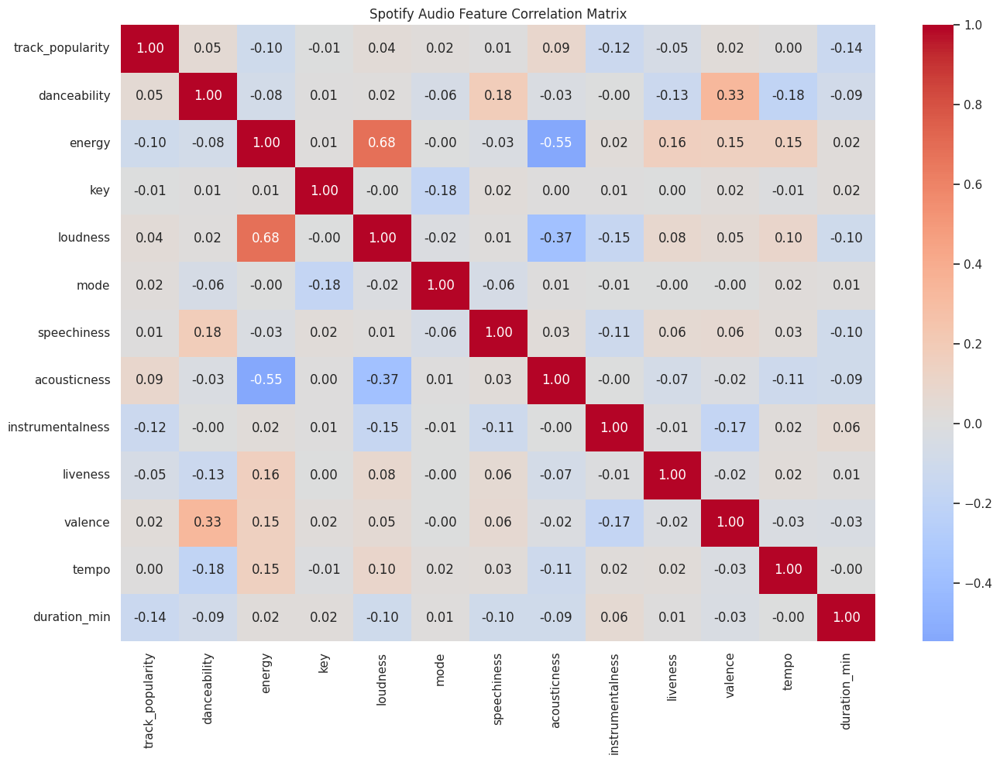

In [18]:
correlation_matrix = df[audio_features].corr()

plt.figure(figsize=(14, 10))
sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0
)

plt.title("Spotify Audio Feature Correlation Matrix")
plt.tight_layout()
plt.show()

## Observation

The correlation analysis shows that most Spotify audio features have relatively
weak linear relationships with one another.

The strongest positive correlation is observed between `energy` and `loudness`,
with a correlation coefficient of approximately 0.68. This indicates that
tracks with higher energy tend to have higher loudness levels.

A moderate negative correlation of approximately -0.55 is observed between
`energy` and `acousticness`, indicating that higher-energy tracks generally tend
to have lower acousticness.

`danceability` and `valence` show a moderate positive correlation of
approximately 0.33, suggesting that more danceable tracks tend to have somewhat
higher valence.

`loudness` and `acousticness` show a negative correlation of approximately
-0.37.

The remaining feature relationships are comparatively weak, indicating that
the audio features provide largely distinct information about the tracks.

These relationships confirm that multiple audio characteristics contribute
different aspects of a track's musical profile, supporting their combined use
for clustering and similarity-based recommendation.

# 🎼 Genre Distribution Analysis

The known playlist genre labels are analyzed to understand the composition of
the cleaned Spotify dataset.

Although the clustering stage is unsupervised and does not use genre labels as
model inputs, the known genres provide an important reference for interpreting
the discovered audio-based clusters.

The distribution of tracks across genres is visualized to identify differences
in representation among the six major playlist genres.

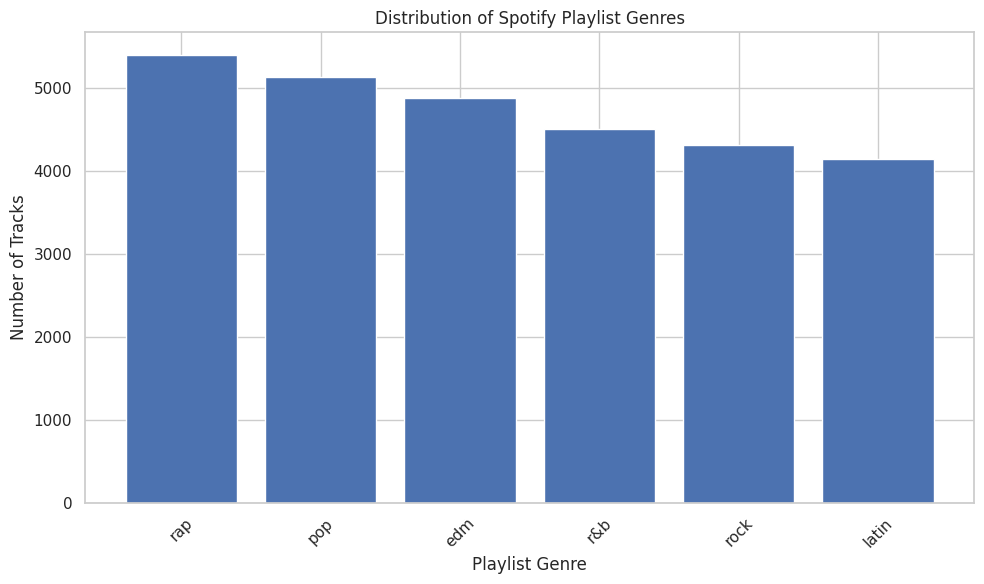

Genre Distribution:


,Track Count
playlist_genre,
rap,5398
pop,5132
edm,4877
r&b,4504
rock,4305
latin,4136


In [19]:
genre_counts = df["playlist_genre"].value_counts()

plt.figure(figsize=(10, 6))
plt.bar(genre_counts.index, genre_counts.values)

plt.title("Distribution of Spotify Playlist Genres")
plt.xlabel("Playlist Genre")
plt.ylabel("Number of Tracks")
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

print("Genre Distribution:")
display(genre_counts.to_frame("Track Count"))

## Observation

The genre distribution analysis confirms that all six playlist genres are
represented in the cleaned dataset.

Rap has the highest representation with 5,398 tracks, followed by Pop with
5,132 tracks and EDM with 4,877 tracks.

R&B contains 4,504 tracks, while Rock contains 4,305 tracks and Latin has the
lowest representation with 4,136 tracks.

Although the genre distribution is not perfectly equal, the differences are
moderate and each genre contains a substantial number of tracks.

The presence of all six genres with meaningful representation provides a
suitable basis for comparing the discovered audio-based clusters with the
known genre categories.

# 🎵 Sub-Genre Distribution Analysis

The playlist sub-genre distribution is analyzed to obtain a more detailed view
of the musical categories represented in the dataset.

The dataset contains 24 sub-genres distributed across the six major playlist
genres.

Sub-genre analysis helps identify highly represented and less represented
musical categories and provides additional context for interpreting the
unsupervised clustering results.

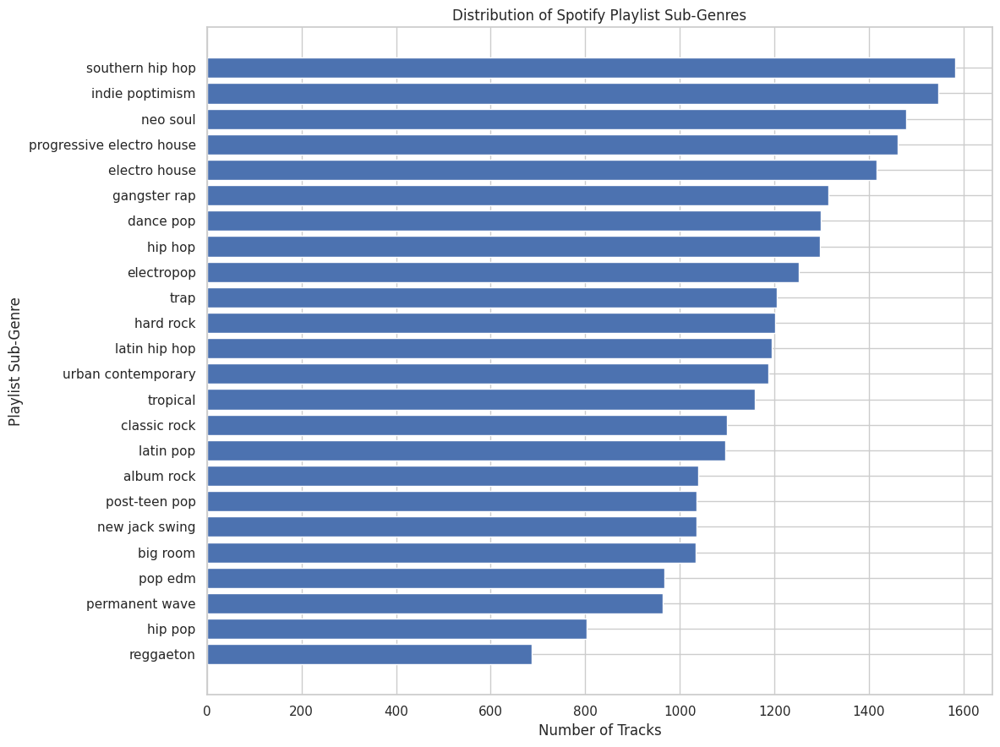

Sub-Genre Distribution:


,Track Count
playlist_subgenre,
southern hip hop,1582
indie poptimism,1547
neo soul,1478
progressive electro house,1460
electro house,1416
gangster rap,1314
dance pop,1298
hip hop,1296
electropop,1251


In [20]:
subgenre_counts = df["playlist_subgenre"].value_counts()

plt.figure(figsize=(12, 9))
plt.barh(
    subgenre_counts.index[::-1],
    subgenre_counts.values[::-1]
)

plt.title("Distribution of Spotify Playlist Sub-Genres")
plt.xlabel("Number of Tracks")
plt.ylabel("Playlist Sub-Genre")

plt.tight_layout()
plt.show()

print("Sub-Genre Distribution:")
display(subgenre_counts.to_frame("Track Count"))

## Observation

The sub-genre analysis confirms that all 24 playlist sub-genres are represented
in the cleaned dataset.

Southern Hip Hop has the highest representation with 1,582 tracks, followed by
Indie Poptimism with 1,547 tracks and Neo Soul with 1,478 tracks.

Progressive Electro House and Electro House also have relatively high
representation with 1,460 and 1,416 tracks, respectively.

Reggaeton has the lowest representation with 687 tracks, followed by Hip Pop
with 803 tracks.

The distribution shows moderate variation across sub-genres, while every
sub-genre maintains sufficient representation for exploratory comparison.

The sub-genre structure provides additional context for understanding the
musical characteristics of the clusters discovered later through unsupervised
learning.

# 🎚️ Genre-wise Audio Feature Analysis

The average audio characteristics of each major playlist genre are analyzed to
identify differences in musical profiles.

The analysis focuses on key features such as danceability, energy,
speechiness, acousticness, instrumentalness, liveness, valence, loudness, and
tempo.

Comparing these characteristics across genres provides an interpretable
baseline before applying unsupervised clustering.

The known genre labels are used only for exploratory analysis and interpretation
at this stage. They are not used as inputs to the K-Means clustering model.

In [21]:
genre_audio_summary = df.groupby("playlist_genre")[audio_features].mean()

display(genre_audio_summary.round(3))

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min
playlist_genre,,,,,,,,,,,,,
edm,30.678,0.658,0.810,5.355,-5.487,0.517,0.088,0.077,0.245,0.214,0.397,126.328,3.767
latin,41.450,0.711,0.710,5.469,-6.483,0.562,0.100,0.213,0.053,0.182,0.607,118.528,3.621
pop,45.905,0.638,0.701,5.316,-6.377,0.592,0.074,0.172,0.063,0.177,0.502,120.963,3.635
r&b,35.929,0.667,0.589,5.381,-8.033,0.522,0.116,0.264,0.029,0.176,0.538,113.917,4.008
rap,41.846,0.716,0.650,5.431,-7.090,0.523,0.197,0.197,0.080,0.191,0.505,120.585,3.557
rock,39.694,0.519,0.733,5.252,-7.560,0.693,0.058,0.147,0.066,0.205,0.533,125.039,4.136


## Observation

The genre-wise audio feature analysis shows clear differences in the musical
profiles of the six major playlist genres.

EDM has the highest average energy at 0.810 and the highest average tempo at
126.328 BPM among the six genres. It also has relatively low acousticness and
high instrumentalness compared with several other genres.

Latin has the highest average danceability at 0.711 and the highest valence at
0.607, indicating a generally more danceable and positively valenced audio
profile.

Rap has a high average danceability of 0.716 and the highest speechiness at
0.197, making speech-related characteristics particularly prominent in this
genre.

R&B has the lowest average energy at 0.589 and the highest acousticness at
0.264. It also has the lowest average loudness among the six genres.

Rock has the lowest average danceability at 0.519, while showing relatively
high energy at 0.733. It also has the highest average mode value at 0.693 and
the longest average duration at approximately 4.14 minutes.

Pop has relatively balanced values across most audio characteristics, with an
average popularity of 45.905, the highest among the six genres.

These differences demonstrate that major genres exhibit distinct audio
characteristics. However, the overlap across several features also suggests
that genre boundaries may not be completely separated, supporting the use of
unsupervised clustering to discover underlying audio-based segments.

# 🎯 Genre-wise Audio Feature Visualization

The average audio characteristics identified in the previous analysis are
visualized to make differences between the major playlist genres easier to
interpret.

The visualization focuses on the primary audio characteristics that are most
useful for understanding the musical profiles of the genres.

This comparison provides a visual reference for the later interpretation of
the machine learning clusters.

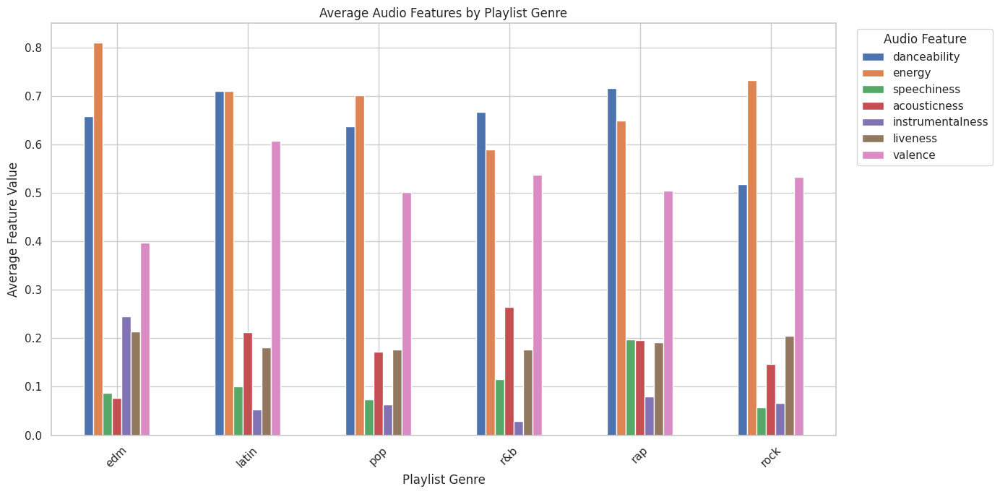

In [22]:
selected_genre_features = [
    "danceability",
    "energy",
    "speechiness",
    "acousticness",
    "instrumentalness",
    "liveness",
    "valence"
]

genre_feature_means = df.groupby("playlist_genre")[selected_genre_features].mean()

genre_feature_means.plot(
    kind="bar",
    figsize=(14, 7)
)

plt.title("Average Audio Features by Playlist Genre")
plt.xlabel("Playlist Genre")
plt.ylabel("Average Feature Value")
plt.xticks(rotation=45)
plt.legend(title="Audio Feature", bbox_to_anchor=(1.02, 1), loc="upper left")

plt.tight_layout()
plt.show()

## Observation

The visualization highlights clear differences in average audio characteristics
across the six playlist genres.

EDM shows the highest average energy, while Rock also demonstrates relatively
high energy compared with Pop and R&B.

Latin and Rap show the highest average danceability among the six genres, while
Rock has noticeably lower danceability.

Rap has the most prominent speechiness, whereas Rock and Pop show comparatively
lower speechiness.

R&B has the highest acousticness, while EDM has relatively high instrumentalness
and lower acousticness.

Latin has the highest average valence, indicating a comparatively more positive
musical profile, while EDM has the lowest average valence among the genres.

The visualization confirms that multiple audio features vary across genres,
providing useful evidence for the subsequent unsupervised clustering stage.

# Popularity Analysis

Track popularity is analyzed to understand how popularity varies across the
major playlist genres.

Although popularity will be included as one of the numerical features used for
the clustering analysis, it is important to examine its distribution and
relationship with the known genre categories separately.

This analysis helps determine whether certain genres contain systematically
more popular tracks than others.

,mean,median,min,max
playlist_genre,,,,
pop,45.91,50.0,0,100
rap,41.85,46.0,0,98
latin,41.45,45.0,0,99
rock,39.69,44.0,0,85
r&b,35.93,38.0,0,92
edm,30.68,33.0,0,84


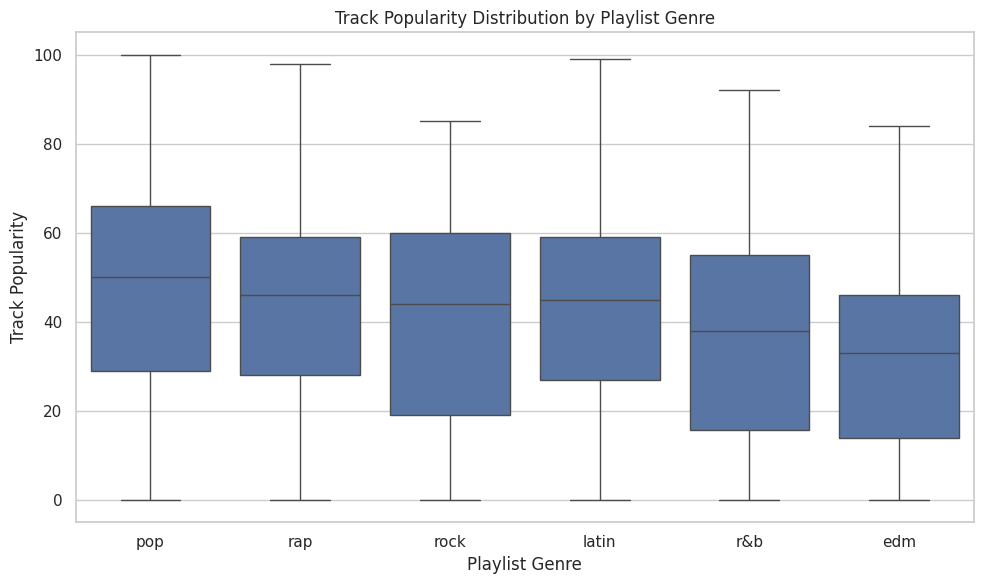

In [23]:
genre_popularity = (
    df.groupby("playlist_genre")["track_popularity"]
    .agg(["mean", "median", "min", "max"])
    .sort_values("mean", ascending=False)
)

display(genre_popularity.round(2))

plt.figure(figsize=(10, 6))

sns.boxplot(
    data=df,
    x="playlist_genre",
    y="track_popularity"
)

plt.title("Track Popularity Distribution by Playlist Genre")
plt.xlabel("Playlist Genre")
plt.ylabel("Track Popularity")

plt.tight_layout()
plt.show()

## Observation

The popularity analysis shows noticeable differences in average track popularity
across the six playlist genres.

Pop has the highest mean popularity at 45.91, with a median of 50.0. Rap
follows with a mean of 41.85 and a median of 46.0, while Latin has a mean of
41.45 and a median of 45.0.

Rock has a mean popularity of 39.69, followed by R&B at 35.93.

EDM has the lowest average popularity at 30.68, with a median of 33.0.

The boxplot shows substantial variation in popularity within every genre, with
tracks ranging from very low popularity values to highly popular tracks. Pop,
Rap, and Latin generally show higher central popularity levels than EDM and
R&B.

These results indicate that popularity varies across genres but also has
considerable within-genre variation. Therefore, popularity can provide useful
information for segmentation while still requiring standardization with the
other numerical features.

# 📈 23.1 Top 10 Most Popular Tracks

This analysis identifies the ten most popular tracks in the cleaned Spotify
dataset based on their Spotify track popularity scores.

The analysis provides an overview of the highest-popularity tracks and their
associated artists and playlist genres.

The results help identify which tracks occupy the highest popularity range
within the dataset.

In [72]:
top_10_tracks = (
    df[
        [
            "track_name",
            "track_artist",
            "track_popularity",
            "playlist_genre"
        ]
    ]
    .sort_values(
        "track_popularity",
        ascending=False
    )
    .head(10)
    .reset_index(drop=True)
)

top_10_tracks.index = top_10_tracks.index + 1

display(top_10_tracks)

print("Top 10 most popular tracks identified successfully.")

,track_name,track_artist,track_popularity,playlist_genre
1,Dance Monkey,Tones and I,100,pop
2,ROXANNE,Arizona Zervas,99,latin
3,Blinding Lights,The Weeknd,98,pop
4,The Box,Roddy Ricch,98,rap
5,Circles,Post Malone,98,pop
6,Memories,Maroon 5,98,pop
7,Tusa,KAROL G,98,pop
8,everything i wanted,Billie Eilish,97,pop
9,Don't Start Now,Dua Lipa,97,pop
10,Falling,Trevor Daniel,97,pop


Top 10 most popular tracks identified successfully.


#Observation

The analysis identifies the ten most popular tracks in the cleaned Spotify dataset. Dance Monkey has the highest popularity score of 100, followed by ROXANNE with 99. Eight of the ten tracks have popularity scores between 97 and 98, indicating that the highest-popularity group is concentrated within a narrow range. Most of the top-ranked tracks belong to the pop genre, with additional representation from Latin and rap.

# 🎤 23.2 Top 10 Most Frequent Artists

This analysis identifies the ten artists with the highest number of tracks in
the cleaned Spotify dataset.

The analysis helps understand artist representation within the dataset and
shows which artists contribute the largest number of tracks.

The results provide additional context for interpreting the dataset's artist
distribution and potential concentration.

In [73]:
top_10_artists = (
    df["track_artist"]
    .value_counts()
    .head(10)
    .reset_index()
)

top_10_artists.columns = [
    "track_artist",
    "track_count"
]

top_10_artists.index = top_10_artists.index + 1

display(top_10_artists)

print("Top 10 most frequent artists identified successfully.")

,track_artist,track_count
1,Queen,130
2,Martin Garrix,87
3,Don Omar,84
4,David Guetta,81
5,Dimitri Vegas & Like Mike,68
6,Drake,68
7,Hardwell,68
8,The Chainsmokers,66
9,Logic,65
10,Guns N' Roses,63


Top 10 most frequent artists identified successfully.


#Observation

The analysis shows that Queen has the highest representation in the cleaned dataset with 130 tracks. Martin Garrix follows with 87 tracks, while Don Omar and David Guetta contribute 84 and 81 tracks respectively. The remaining artists have between 63 and 68 tracks. This indicates that a small group of highly represented artists contributes a substantial number of tracks to the dataset.

# 📊 23.3 Top Artists by Track Count Visualization

This visualization presents the ten most frequent artists based on their
number of tracks in the cleaned Spotify dataset.

The horizontal bar chart makes it easier to compare artist representation
and identify the artists with the highest number of tracks.

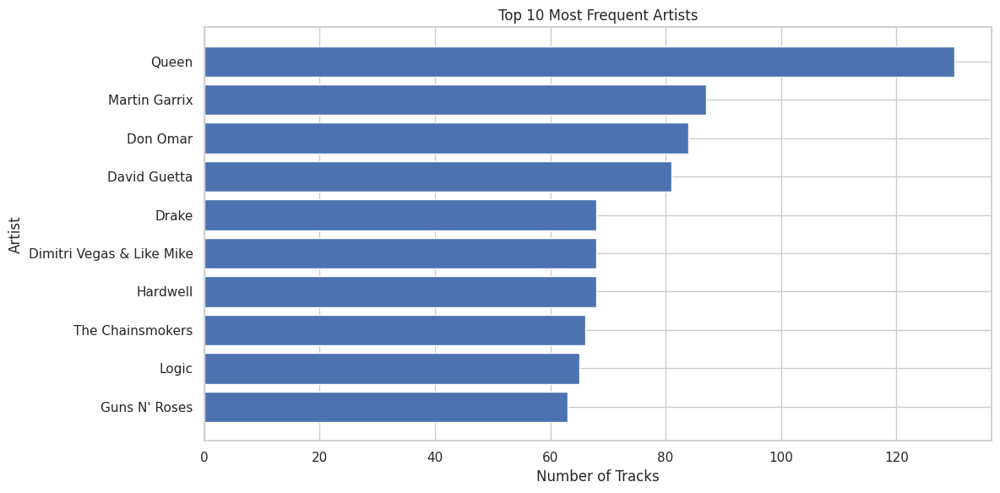

In [74]:
plt.figure(figsize=(12, 6))

artist_counts = (
    df["track_artist"]
    .value_counts()
    .head(10)
    .sort_values()
)

plt.barh(
    artist_counts.index,
    artist_counts.values
)

plt.xlabel("Number of Tracks")
plt.ylabel("Artist")
plt.title("Top 10 Most Frequent Artists")
plt.tight_layout()
plt.show()

# ⏱️ Track Duration Analysis

Track duration is analyzed to understand how song length varies across the
major playlist genres.

The engineered `duration_min` feature provides a more interpretable
representation of track length than the original millisecond value.

Comparing duration across genres helps identify whether certain musical
categories tend to contain shorter or longer tracks and provides additional
context for the audio-based segmentation process.

,mean,median,min,max
playlist_genre,,,,
rock,4.14,3.95,0.07,8.62
r&b,4.01,3.93,0.53,8.44
edm,3.77,3.42,0.52,8.60
pop,3.64,3.52,0.63,8.17
latin,3.62,3.52,0.75,8.63
rap,3.56,3.50,0.49,8.32


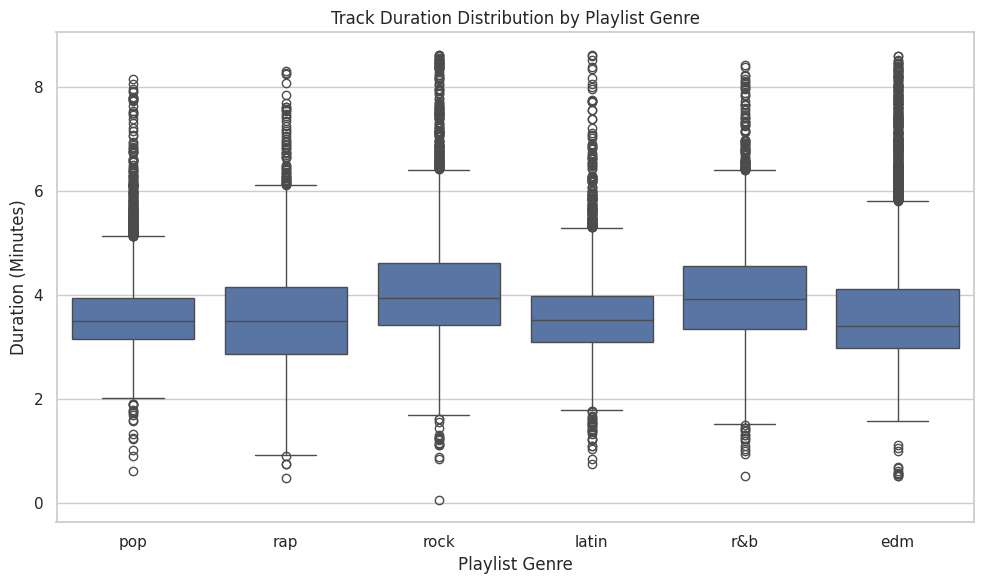

In [24]:
genre_duration = (
    df.groupby("playlist_genre")["duration_min"]
    .agg(["mean", "median", "min", "max"])
    .sort_values("mean", ascending=False)
)

display(genre_duration.round(2))

plt.figure(figsize=(10, 6))

sns.boxplot(
    data=df,
    x="playlist_genre",
    y="duration_min"
)

plt.title("Track Duration Distribution by Playlist Genre")
plt.xlabel("Playlist Genre")
plt.ylabel("Duration (Minutes)")

plt.tight_layout()
plt.show()

## Observation

The track duration analysis shows noticeable differences in average song length
across the six playlist genres.

Rock has the highest average duration at approximately 4.14 minutes, followed
by R&B at 4.01 minutes.

EDM has an average duration of approximately 3.77 minutes, while Pop and Latin
have similar average durations of 3.64 and 3.62 minutes, respectively.

Rap has the shortest average duration at approximately 3.56 minutes.

The median values follow a similar pattern, with Rock and R&B having higher
central durations and Rap having the lowest.

The minimum and maximum values show that track duration varies considerably
within each genre. These differences indicate that duration can provide
additional information about the musical characteristics of tracks and can
therefore contribute to the overall audio-based segmentation.

# 📅 Release Year Distribution Analysis

The release-year distribution is analyzed to understand the temporal coverage
of the cleaned Spotify dataset.

The `release_year` feature contains valid values for most tracks, while a
portion of the records has missing release-year information.

The distribution of available release years is visualized to identify the
periods most strongly represented in the dataset and to understand the temporal
characteristics of the available tracks.

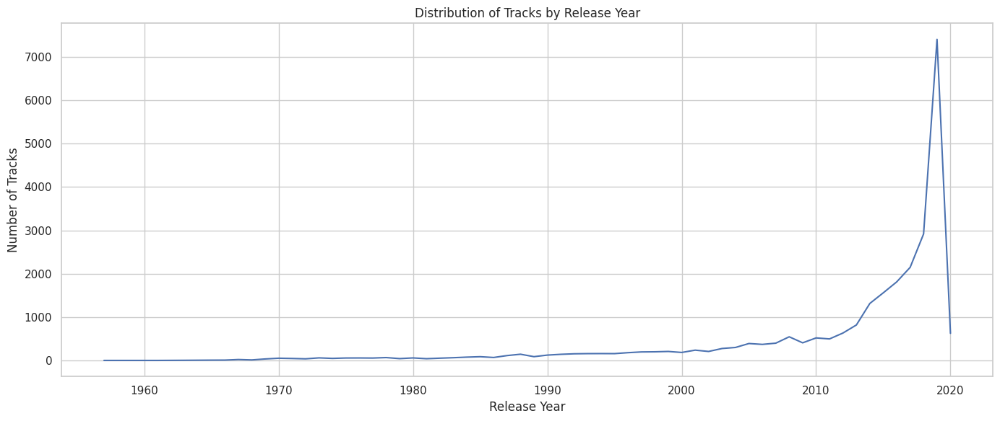

Most Represented Release Years:


,Track Count
release_year,
2019,7404
2018,2917
2017,2147
2016,1812
2015,1560
2014,1315
2013,819
2012,633
2020,626


In [25]:
release_year_counts = (
    df["release_year"]
    .dropna()
    .astype(int)
    .value_counts()
    .sort_index()
)

plt.figure(figsize=(14, 6))

plt.plot(
    release_year_counts.index,
    release_year_counts.values
)

plt.title("Distribution of Tracks by Release Year")
plt.xlabel("Release Year")
plt.ylabel("Number of Tracks")

plt.tight_layout()
plt.show()

print("Most Represented Release Years:")
display(
    release_year_counts
    .sort_values(ascending=False)
    .head(10)
    .to_frame("Track Count")
)

## Observation

The release-year analysis shows that the dataset contains tracks spanning from
1957 to 2020, although the distribution is strongly concentrated toward recent
years.

The most represented release year is 2019 with 7,404 tracks, followed by 2018
with 2,917 tracks and 2017 with 2,147 tracks.

The number of tracks generally increases substantially from the earlier years
toward the recent period, with a particularly large concentration around 2019.

The years 2016, 2015, and 2014 contain 1,812, 1,560, and 1,315 tracks,
respectively. The year 2020 contains 626 tracks, which is lower than 2019.

The strong concentration of tracks in recent years indicates that the dataset
has a considerable recency bias in its available release-year information.

Since release year is not a primary audio feature for the clustering model, it
will be retained mainly for temporal analysis and interpretation rather than
being included in the core audio-feature clustering space.

# Energy vs. Danceability Scatter Plot

This analysis examines the relationship between energy and danceability across
tracks in the cleaned Spotify dataset.

The scatter plot helps identify whether energetic tracks tend to have higher
danceability and reveals the overall distribution and overlap of tracks across
these two audio characteristics.

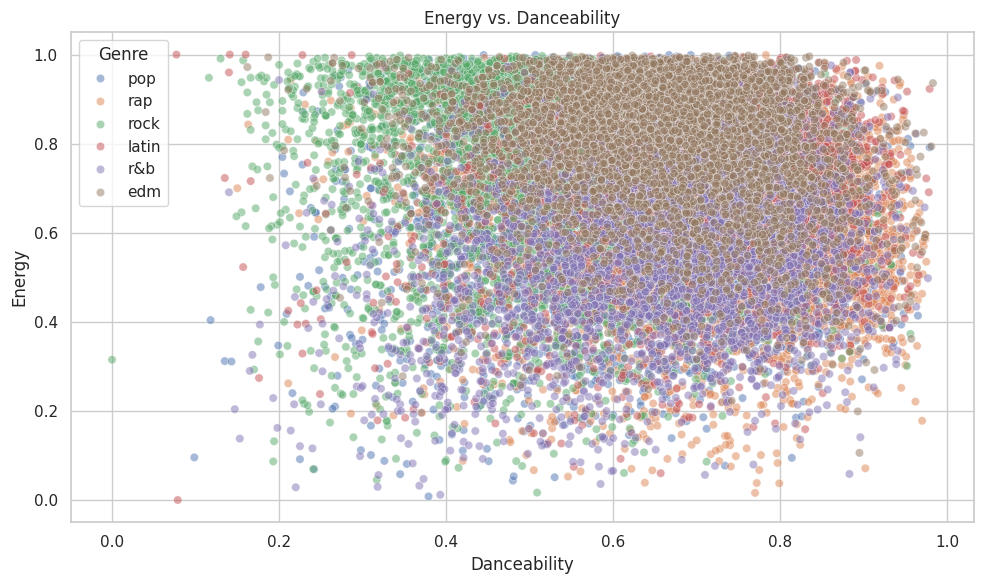

In [75]:
plt.figure(figsize=(10, 6))

sns.scatterplot(
    data=df,
    x="danceability",
    y="energy",
    hue="playlist_genre",
    alpha=0.5
)

plt.xlabel("Danceability")
plt.ylabel("Energy")
plt.title("Energy vs. Danceability")
plt.legend(title="Genre")
plt.tight_layout()
plt.show()

# Observation

The scatter plot shows a broad positive relationship between danceability and energy, with most tracks concentrated in the moderate-to-high range for both features. The points are highly dispersed, indicating that high danceability does not necessarily imply high energy. Genre groups also overlap considerably, supporting the conclusion that Spotify genres have shared and non-separable audio characteristics.

# Valence vs. Track Popularity

This analysis examines the relationship between musical valence and track
popularity in the cleaned Spotify dataset.

Valence represents the musical positiveness of a track, while track popularity
represents its popularity score.

The scatter plot helps determine whether more positive-sounding tracks tend to
have higher popularity.

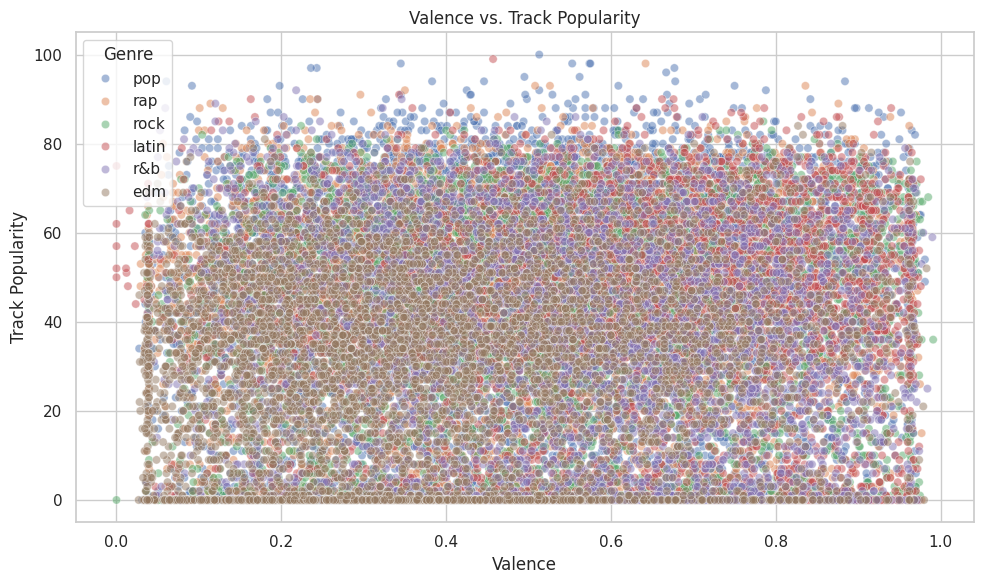

In [76]:
plt.figure(figsize=(10, 6))

sns.scatterplot(
    data=df,
    x="valence",
    y="track_popularity",
    hue="playlist_genre",
    alpha=0.5
)

plt.xlabel("Valence")
plt.ylabel("Track Popularity")
plt.title("Valence vs. Track Popularity")
plt.legend(title="Genre")
plt.tight_layout()
plt.show()

# Observation

The scatter plot shows that tracks are distributed across a wide range of valence and popularity values. There is no strong visible relationship between valence and popularity, as both highly positive and less positive tracks occur across different popularity levels. The substantial overlap among genres indicates that musical positivity alone does not strongly determine a track's popularity.

# Major vs. Minor Mode by Genre

This analysis examines the distribution of major and minor musical modes across
the six playlist genres.

The comparison helps identify whether certain genres show a stronger tendency
toward major or minor tonal characteristics.

mode_label,Major,Minor
playlist_genre,,
edm,2520,2357
latin,2323,1813
pop,3038,2094
r&b,2349,2155
rap,2822,2576
rock,2982,1323


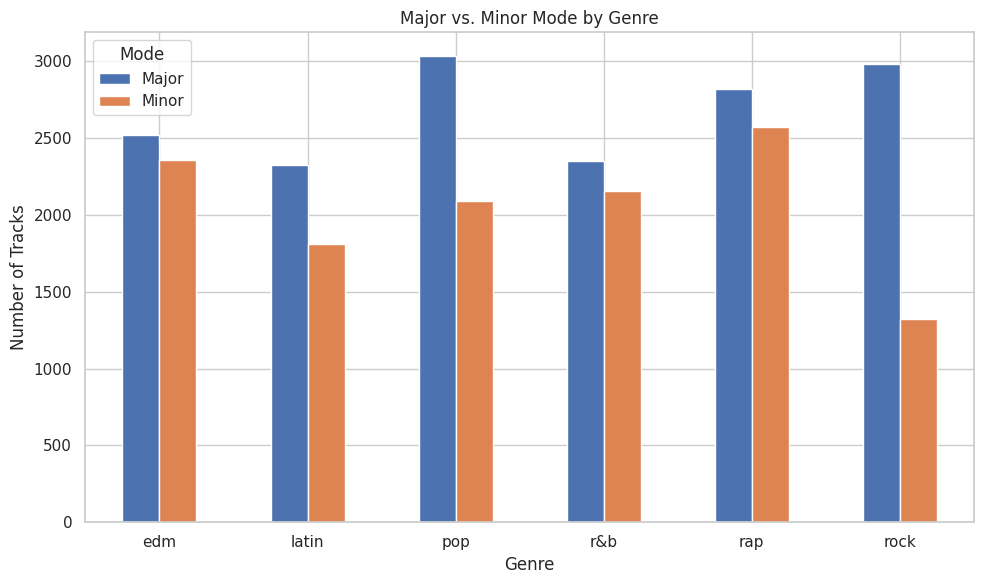

In [77]:
mode_genre_counts = pd.crosstab(
    df["playlist_genre"],
    df["mode_label"]
)

display(mode_genre_counts)

mode_genre_counts.plot(
    kind="bar",
    figsize=(10, 6)
)

plt.xlabel("Genre")
plt.ylabel("Number of Tracks")
plt.title("Major vs. Minor Mode by Genre")
plt.xticks(rotation=0)
plt.legend(title="Mode")
plt.tight_layout()
plt.show()

#Observation

The chart shows that major-mode tracks are more common than minor-mode tracks across all six genres. Pop has the highest number of major-mode tracks, while rap has the highest number of minor-mode tracks. Rock shows the largest difference between major and minor modes, indicating a stronger preference toward major-mode tracks within this dataset.

# 🎼 Pair Plot of Key Audio Features

This analysis examines the relationships among selected key audio features in
the cleaned Spotify dataset.

The pair plot provides a combined view of feature distributions and
feature-to-feature relationships, helping identify correlations, patterns, and
overlapping characteristics among tracks.

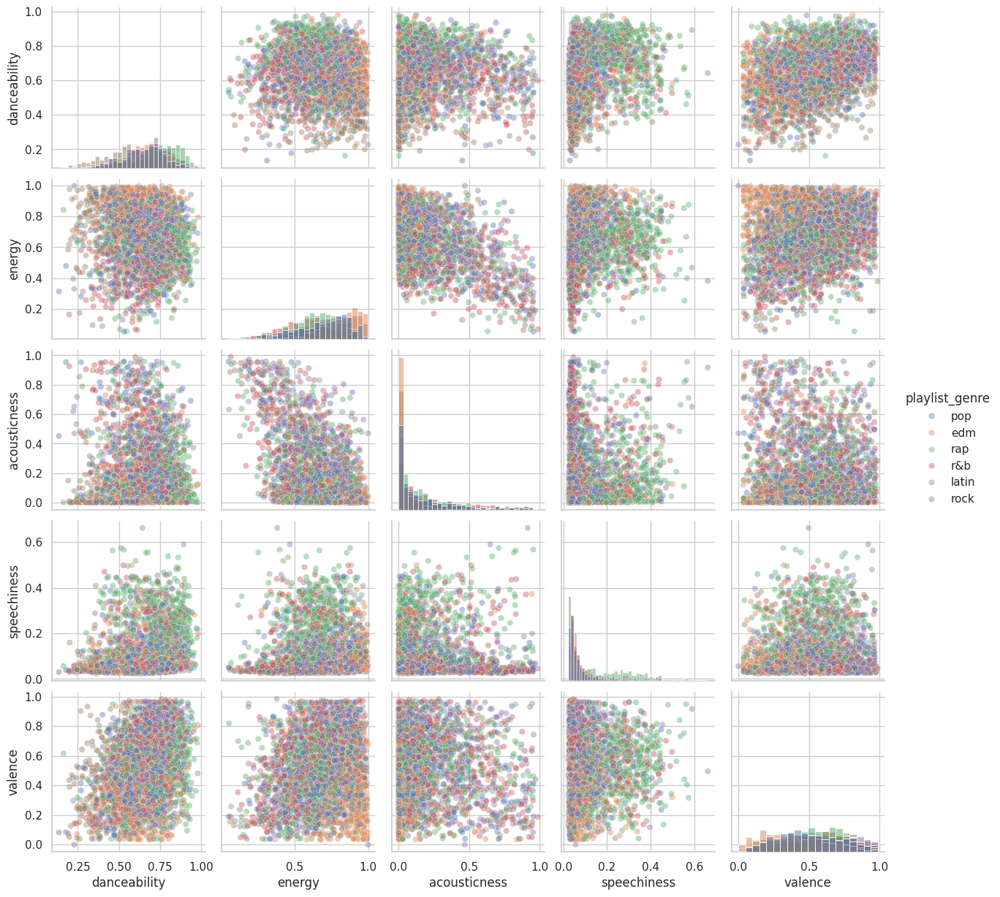

In [78]:
pairplot_features = [
    "danceability",
    "energy",
    "acousticness",
    "speechiness",
    "valence"
]

pairplot_data = df[
    pairplot_features + ["playlist_genre"]
].sample(
    n=min(3000, len(df)),
    random_state=RANDOM_STATE
)

sns.pairplot(
    pairplot_data,
    vars=pairplot_features,
    hue="playlist_genre",
    diag_kind="hist",
    plot_kws={"alpha": 0.4}
)

plt.show()

#Observation

The pair plot shows that danceability and valence have a noticeable positive relationship, while energy and acousticness show an inverse tendency. Acousticness and speechiness are strongly right-skewed, with most tracks having relatively low values. The substantial overlap among genre groups across the feature pairs indicates that the selected audio characteristics do not form completely distinct genre boundaries.

# 🎛️ Clustering Feature Selection

The clustering stage requires a carefully selected numerical feature set that
represents the musical characteristics of each track.

The core clustering features are selected from Spotify's numerical audio
attributes together with track popularity and the engineered track duration
feature.

`release_year` is excluded because it represents the temporal dimension of the
dataset rather than the intrinsic audio characteristics of a track.

`duration_sec` is also excluded because `duration_min` provides the same
information in a more interpretable scale.

The selected features will form the input space for feature standardization
and K-Means clustering.

In [26]:
clustering_features = [
    "danceability",
    "energy",
    "key",
    "loudness",
    "mode",
    "speechiness",
    "acousticness",
    "instrumentalness",
    "liveness",
    "valence",
    "tempo",
    "duration_min",
    "track_popularity"
]

X = df[clustering_features].copy()

print("Number of Clustering Features:", len(clustering_features))
print("\nClustering Features:")
print(clustering_features)

print("\nClustering Data Shape:", X.shape)

print("\nMissing Values in Clustering Features:")
display(X.isnull().sum().to_frame("Missing Values"))

Number of Clustering Features: 13

Clustering Features:
['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_min', 'track_popularity']

Clustering Data Shape: (28352, 13)

Missing Values in Clustering Features:


,Missing Values
danceability,0
energy,0
key,0
loudness,0
mode,0
speechiness,0
acousticness,0
instrumentalness,0
liveness,0
valence,0


## Observation

The clustering feature selection stage identifies 13 numerical features for the
machine learning pipeline.

The selected feature set contains audio characteristics including danceability,
energy, loudness, speechiness, acousticness, instrumentalness, liveness,
valence, tempo, key, and mode, along with track duration and popularity.

The clustering dataset contains 28,352 records and 13 features, matching the
final cleaned dataset size.

All 13 selected features contain zero missing values. This confirms that the
clustering input matrix is complete and does not require additional missing
value treatment.

The `release_year` feature is excluded because it represents temporal
information rather than the intrinsic audio characteristics used for
segmentation.

The selected feature matrix is therefore ready for standardization before
K-Means clustering.

# 📏 Feature Standardization

The selected clustering features have different numerical scales and
distributions.

For example, `tempo` is measured in beats per minute, `loudness` uses decibel
values, `track_popularity` ranges from 0 to 100, while several audio features
such as `danceability` and `energy` are bounded between 0 and 1.

K-Means clustering is distance-based, so features with larger numerical scales
could disproportionately influence the resulting clusters.

To prevent this, `StandardScaler` is applied to transform each feature to a
standardized scale with a mean close to zero and a standard deviation close to
one.

The standardized feature matrix will be used as the input for subsequent
clustering analysis.

In [27]:
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

X_scaled_df = pd.DataFrame(
    X_scaled,
    columns=clustering_features,
    index=df.index
)

print("Original Feature Matrix Shape:", X.shape)
print("Standardized Feature Matrix Shape:", X_scaled.shape)

print("\nStandardized Feature Statistics:")
display(
    X_scaled_df.agg(["mean", "std"]).T.round(4)
)

Original Feature Matrix Shape: (28352, 13)
Standardized Feature Matrix Shape: (28352, 13)

Standardized Feature Statistics:


,mean,std
danceability,0.0,1.0
energy,0.0,1.0
key,-0.0,1.0
loudness,0.0,1.0
mode,0.0,1.0
speechiness,0.0,1.0
acousticness,-0.0,1.0
instrumentalness,0.0,1.0
liveness,-0.0,1.0
valence,0.0,1.0


## Observation

The feature standardization process was completed successfully for all 13
clustering features.

The original feature matrix contains 28,352 records and 13 features, and the
standardized matrix retains the same dimensions.

After applying `StandardScaler`, the mean of every feature is approximately
zero and the standard deviation is approximately one.

This confirms that the features have been placed on a comparable scale, which
prevents features with larger numerical ranges from dominating the distance
calculations used by K-Means.

The standardized feature matrix is therefore ready for K-Means clustering and
cluster-number evaluation.

# 📉 K-Means Cluster Range Analysis

K-Means requires the number of clusters to be specified before model training.

To identify a suitable number of clusters, multiple K-Means models are
evaluated across a range of cluster counts.

The analysis evaluates cluster values from 2 through 11 using the standardized
Spotify audio-feature matrix.

Two important measures are calculated:

- Inertia measures the total within-cluster variation. Lower values indicate
  more compact clusters.
- Silhouette score measures how well-separated and internally cohesive the
  clusters are. Higher values generally indicate better-defined clustering.

The results will be used together to determine an appropriate cluster count
rather than relying on a single metric.

In [28]:
cluster_range = range(2, 12)

inertia_values = []
silhouette_values = []

for k in cluster_range:
    kmeans_model = KMeans(
        n_clusters=k,
        random_state=RANDOM_STATE,
        n_init=10
    )

    cluster_labels = kmeans_model.fit_predict(X_scaled)

    inertia_values.append(kmeans_model.inertia_)
    silhouette_values.append(
        silhouette_score(X_scaled, cluster_labels)
    )

cluster_evaluation = pd.DataFrame({
    "Number of Clusters": list(cluster_range),
    "Inertia": inertia_values,
    "Silhouette Score": silhouette_values
})

display(cluster_evaluation.round(4))

,Number of Clusters,Inertia,Silhouette Score
0,2,329272.5369,0.1345
1,3,304738.9001,0.0943
2,4,286360.2063,0.0976
3,5,270791.4377,0.0957
4,6,258316.8792,0.0885
5,7,248043.2917,0.0929
6,8,240809.2801,0.0878
7,9,234924.7574,0.0836
8,10,228910.4064,0.0852
9,11,224886.9989,0.0900


#Observation

The K-Means evaluation shows a continuous decrease in inertia as the number of clusters increases, which is expected because additional clusters reduce within-cluster variation.

The silhouette score is highest at 2 clusters (0.1345), while the scores for the remaining cluster counts are relatively low and fluctuate without a strong improvement.

At 6 clusters, the inertia is 258,316.8792 and the silhouette score is 0.0885. Although the silhouette score is lower than the value obtained for 2 clusters, the reduction in inertia and the project requirement for more meaningful music segmentation make 6 clusters a suitable candidate for further analysis.

The relatively low silhouette scores indicate that Spotify tracks have overlapping audio characteristics and that the discovered segments are not sharply separated. This is consistent with the nature of music data, where different genres can share similar audio characteristics.

The next stage will visualize the elbow curve and silhouette scores to support the selection of the final cluster count.

# 📈 Elbow Method and Silhouette Visualization

The cluster evaluation results are visualized using two complementary plots.

The **Elbow Method** illustrates the relationship between the number of
clusters and K-Means inertia. As the number of clusters increases, inertia
decreases because the observations are distributed among more clusters.

The **Silhouette Score Plot** evaluates the quality of the resulting
clustering structure. Higher silhouette values generally indicate better
cluster cohesion and separation.

These visualizations provide a graphical basis for interpreting the numerical
cluster evaluation results and selecting an appropriate number of clusters for
the Spotify segmentation model.

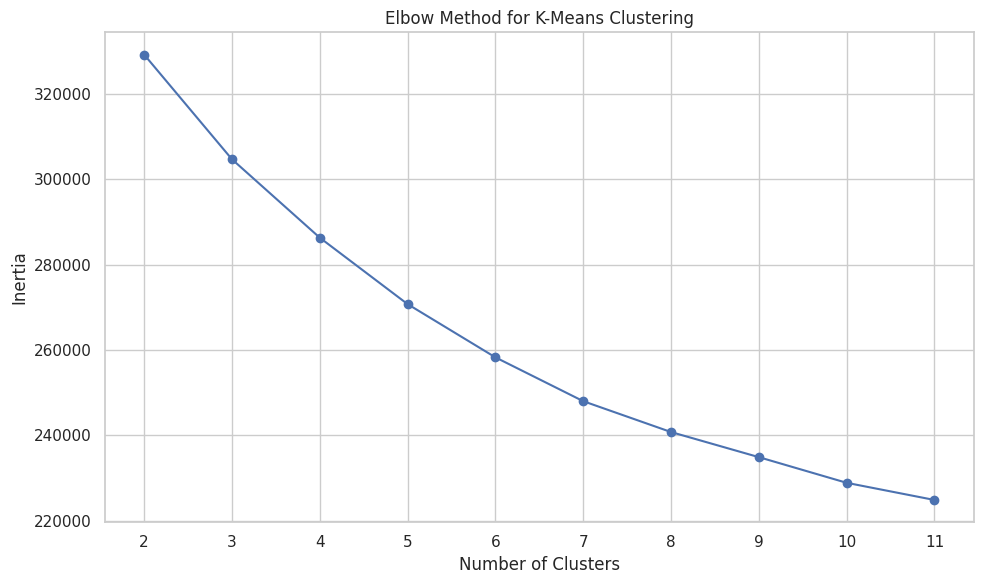

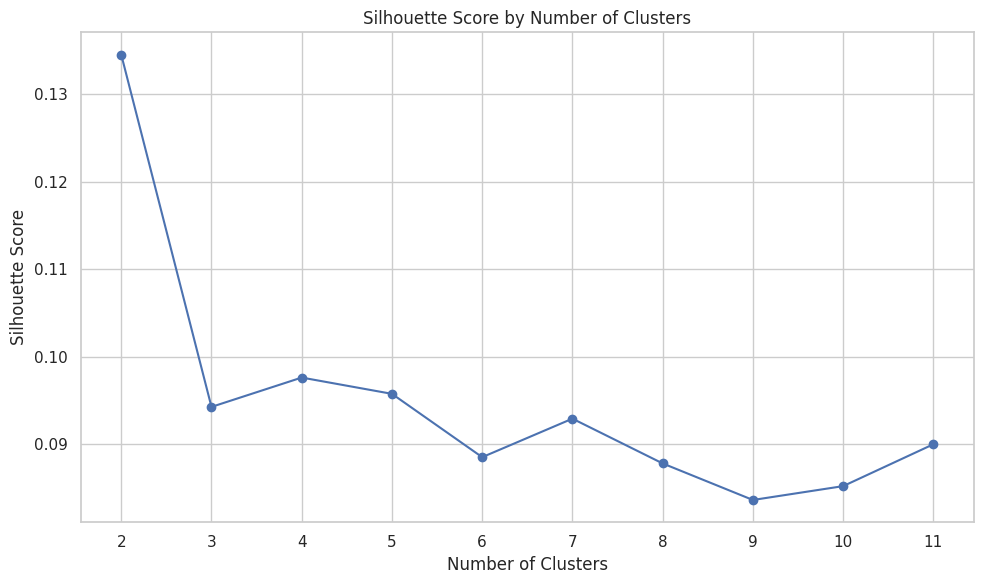

In [29]:
plt.figure(figsize=(10, 6))

plt.plot(
    cluster_evaluation["Number of Clusters"],
    cluster_evaluation["Inertia"],
    marker="o"
)

plt.title("Elbow Method for K-Means Clustering")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.xticks(cluster_evaluation["Number of Clusters"])

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))

plt.plot(
    cluster_evaluation["Number of Clusters"],
    cluster_evaluation["Silhouette Score"],
    marker="o"
)

plt.title("Silhouette Score by Number of Clusters")
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.xticks(cluster_evaluation["Number of Clusters"])

plt.tight_layout()
plt.show()

## Observation

The Silhouette Score is highest at **2 clusters**, with a score of approximately
**0.1345**.

For higher values of K, the silhouette score decreases considerably and remains
below 0.10. At **6 clusters**, the silhouette score is approximately **0.0885**.

This indicates that the Spotify tracks have overlapping audio characteristics
and do not form strongly separated clusters. The low silhouette values are
consistent with the natural similarity between different music genres.

Although 2 clusters provides the highest silhouette score, it would result in
very broad segmentation. Therefore, considering the objective of creating more
meaningful music segments and the elbow analysis, **6 clusters is selected for
the final K-Means model**.

# 📊 Cluster Distribution Analysis

After training the final K-Means model, the distribution of tracks across the
six clusters is analyzed.

Cluster size analysis helps determine whether the discovered segments contain
a reasonable number of tracks and whether any cluster is disproportionately
small or large.

The distribution of tracks across clusters provides an initial understanding
of the structure created by the final segmentation model.

A visualization is also generated to make the relative size of each music
segment easier to interpret.

In [31]:
final_kmeans = KMeans(
    n_clusters=6,
    random_state=RANDOM_STATE,
    n_init=10
)

df["cluster"] = final_kmeans.fit_predict(X_scaled)

print("Final K-Means Model Trained Successfully.")
print("Number of Clusters:", final_kmeans.n_clusters)
print("Final Inertia:", round(final_kmeans.inertia_, 4))

print("\nCluster Distribution:")
display(
    df["cluster"]
    .value_counts()
    .sort_index()
    .to_frame("Track Count")
)

print("\nSample Cluster Assignments:")
display(
    df[
        [
            "track_name",
            "track_artist",
            "playlist_genre",
            "playlist_subgenre",
            "cluster"
        ]
    ].head(10)
)

Final K-Means Model Trained Successfully.
Number of Clusters: 6
Final Inertia: 258316.8792

Cluster Distribution:


,Track Count
cluster,
0,5554
1,6196
2,7303
3,3659
4,2297
5,3343



Sample Cluster Assignments:


,track_name,track_artist,playlist_genre,playlist_subgenre,cluster
0,I Don't Care (with Justin Bieber) - Loud Luxury Remix,Ed Sheeran,pop,dance pop,2
1,Memories - Dillon Francis Remix,Maroon 5,pop,dance pop,2
2,All the Time - Don Diablo Remix,Zara Larsson,pop,dance pop,1
3,Call You Mine - Keanu Silva Remix,The Chainsmokers,pop,dance pop,2
4,Someone You Loved - Future Humans Remix,Lewis Capaldi,pop,dance pop,2
5,Beautiful People (feat. Khalid) - Jack Wins Remix,Ed Sheeran,pop,dance pop,2
6,Never Really Over - R3HAB Remix,Katy Perry,pop,dance pop,0
7,Post Malone (feat. RANI) - GATTÜSO Remix,Sam Feldt,pop,dance pop,0
8,Tough Love - Tiësto Remix / Radio Edit,Avicii,pop,dance pop,0
9,If I Can't Have You - Gryffin Remix,Shawn Mendes,pop,dance pop,2


## Observation

The final K-Means model successfully divided the 28,352 Spotify tracks into six
clusters.

Cluster 2 contains the largest number of tracks with **7,303 records**, while
Cluster 4 contains the smallest number with **2,297 records**. The remaining
clusters contain 5,554, 6,196, 3,659, and 3,343 tracks respectively.

The cluster sizes are not identical, which indicates that the K-Means model has
identified segments of different densities within the audio-feature space.

The sample assignments also demonstrate that tracks belonging to the same
playlist genre can be assigned to different clusters. This is expected because
the clustering model uses numerical audio characteristics rather than the
predefined playlist genre labels.

The six cluster assignments are now available for detailed cluster profiling
and interpretation.

# 🎧 Cluster Feature Profiling

The next stage examines the average audio characteristics of each discovered
cluster.

Cluster profiling is essential for interpreting the meaning of the
unsupervised segments. Since K-Means produces numerical cluster labels without
predefined meanings, the average values of the clustering features are used to
identify the dominant characteristics of each segment.

The analysis compares danceability, energy, loudness, speechiness,
acousticness, instrumentalness, liveness, valence, tempo, duration,
popularity, key, and mode across the six clusters.

These profiles will provide the basis for assigning meaningful descriptive
interpretations to the discovered music segments.

In [32]:
cluster_profile = (
    df.groupby("cluster")[clustering_features]
    .mean()
    .round(3)
)

display(cluster_profile)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min,track_popularity
cluster,,,,,,,,,,,,,
0,0.502,0.816,5.304,-5.274,0.616,0.078,0.060,0.031,0.276,0.370,135.633,3.896,34.041
1,0.718,0.720,6.331,-6.232,0.000,0.084,0.142,0.019,0.163,0.602,116.120,3.711,42.117
2,0.714,0.727,4.593,-6.280,1.000,0.077,0.132,0.015,0.160,0.624,116.061,3.690,43.067
3,0.590,0.408,5.198,-10.844,0.626,0.073,0.559,0.116,0.156,0.385,112.710,3.731,42.173
4,0.665,0.784,5.360,-7.033,0.570,0.071,0.068,0.748,0.187,0.389,125.229,4.230,28.347
5,0.715,0.659,5.569,-7.088,0.512,0.333,0.192,0.012,0.211,0.547,122.337,3.623,39.269


## Observation

The cluster profiles show clear differences in the average audio characteristics
of the six discovered segments.

**Cluster 0** is characterized by high energy, high tempo, low danceability,
and relatively low popularity. Its average energy is **0.816** and average
tempo is **135.633 BPM**, indicating a highly energetic and fast-paced segment.

**Cluster 1** shows high danceability and energy with an average danceability of
**0.718** and energy of **0.720**. It also has relatively high valence at
**0.602**, indicating a generally positive musical profile.

**Cluster 2** has a very similar profile to Cluster 1, with high danceability
(**0.714**), high energy (**0.727**), and the highest valence among the six
clusters at **0.624**. Its mode value of **1.000** also distinguishes it from
the other clusters.

**Cluster 3** has substantially lower energy (**0.408**) and the highest
acousticness (**0.559**) among all clusters. It also has the lowest average
loudness at **-10.844 dB**, indicating a relatively softer and more acoustic
segment.

**Cluster 4** is distinguished by extremely high instrumentalness with an
average value of **0.748**. It also has high energy (**0.784**) and the longest
average duration at **4.230 minutes**, while having the lowest popularity
(**28.347**).

**Cluster 5** has the highest speechiness (**0.333**) among all clusters while
maintaining high danceability (**0.715**). This indicates a segment containing
tracks with stronger spoken-word or vocal speech characteristics.

Overall, the six clusters demonstrate meaningful differences in energy,
danceability, acousticness, instrumentalness, speechiness, tempo, duration,
and popularity. These differences provide a foundation for assigning
descriptive interpretations to the clusters.

# 🎨 Cluster Feature Comparison

The average feature profiles of the six K-Means clusters are compared visually
to identify the characteristics that distinguish one segment from another.

A heatmap is used to represent the average standardized-scale-independent
feature values for each cluster. This allows patterns across multiple audio
features to be examined simultaneously.

The visualization helps identify clusters associated with characteristics such
as high energy, high acousticness, high instrumentalness, high speechiness,
danceability, and popularity.

This analysis provides a clearer interpretation of the differences identified
during cluster profiling.

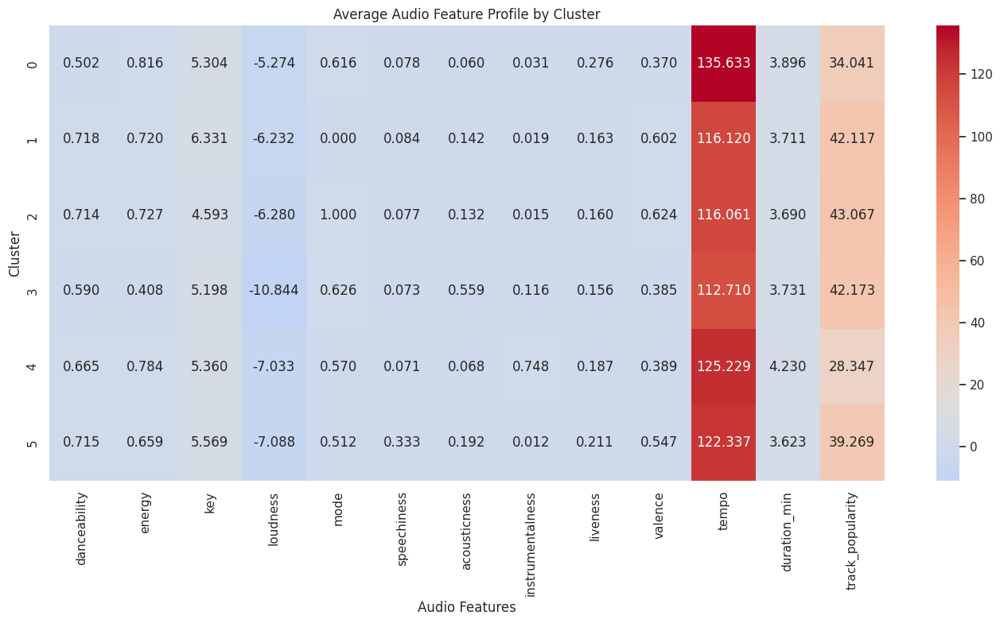

In [33]:
plt.figure(figsize=(14, 8))

sns.heatmap(
    cluster_profile,
    annot=True,
    fmt=".3f",
    cmap="coolwarm",
    center=cluster_profile.values.mean()
)

plt.title("Average Audio Feature Profile by Cluster")
plt.xlabel("Audio Features")
plt.ylabel("Cluster")

plt.tight_layout()
plt.show()

## Observation

The heatmap confirms that the six clusters have distinct audio-feature
profiles.

Cluster 0 shows very high energy and tempo, while Cluster 3 is characterized by
low energy, low loudness, and substantially higher acousticness.

Clusters 1 and 2 have similar high-danceability and high-energy profiles, with
Cluster 2 showing the highest valence among all clusters.

Cluster 4 is strongly distinguished by its very high instrumentalness, making
it the most instrumentally oriented segment. It also has relatively high energy
and the longest average track duration.

Cluster 5 stands out through its substantially higher speechiness while
maintaining high danceability and moderate energy.

The visualization confirms that the clustering model has identified segments
with different combinations of musical characteristics rather than producing
identical feature profiles across clusters.

# 🎼 34. Cluster Composition by Playlist Genre

The discovered clusters are now compared with the original Spotify playlist
genre labels.

K-Means clustering is an unsupervised learning technique, so the model does not
use `playlist_genre` when creating the clusters. Comparing the resulting
clusters with the known genre labels helps determine whether particular genres
tend to concentrate within specific audio-feature segments.

A cluster-by-genre count analysis is performed first, followed by a heatmap
showing the composition of each cluster.

This analysis helps identify dominant genre patterns and also reveals the
degree of overlap between different genres within the discovered segments.

Cluster-wise Playlist Genre Distribution:


playlist_genre,edm,latin,pop,r&b,rap,rock
cluster,,,,,,
0,1607,297,1015,352,466,1817
1,853,1322,1311,1166,1084,460
2,778,1576,1635,1122,1123,1069
3,123,398,686,1150,584,718
4,1328,185,281,78,214,211
5,188,358,204,636,1927,30


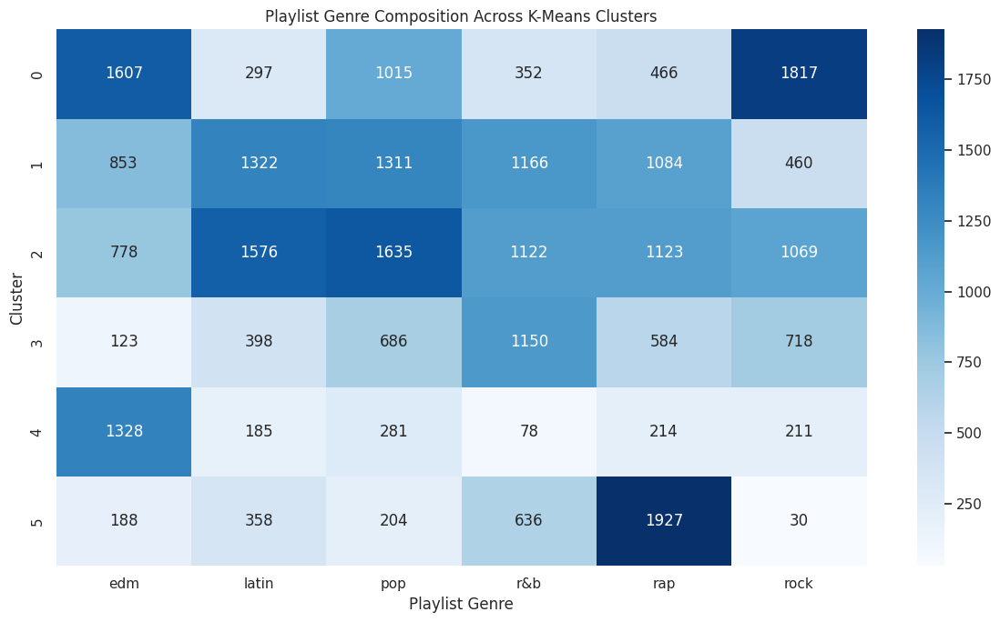

In [34]:
cluster_genre_counts = pd.crosstab(
    df["cluster"],
    df["playlist_genre"]
)

print("Cluster-wise Playlist Genre Distribution:")
display(cluster_genre_counts)

plt.figure(figsize=(12, 7))

sns.heatmap(
    cluster_genre_counts,
    annot=True,
    fmt="d",
    cmap="Blues"
)

plt.title("Playlist Genre Composition Across K-Means Clusters")
plt.xlabel("Playlist Genre")
plt.ylabel("Cluster")

plt.tight_layout()
plt.show()

## Observation

The cluster-by-genre heatmap shows that the discovered clusters contain
different combinations of the six playlist genres.

Cluster 0 has a strong representation of **rock** and **EDM**, with 1,817 rock
tracks and 1,607 EDM tracks. This is consistent with the high-energy and
high-tempo characteristics observed for this cluster.

Cluster 1 contains substantial **Latin, Pop, R&B, and Rap** representation,
while Cluster 2 also contains large numbers of Latin, Pop, R&B, Rap, and Rock
tracks. This indicates considerable overlap among these genres in the
audio-feature space.

Cluster 3 is dominated by **R&B**, with 1,150 tracks, and also contains a
relatively large number of Rock tracks. Its stronger acoustic characteristics
are consistent with this composition.

Cluster 4 is strongly dominated by **EDM**, with 1,328 tracks, while the
remaining genres have considerably smaller representations. This aligns with
the cluster's high energy and instrumentalness characteristics.

Cluster 5 is strongly dominated by **Rap**, with 1,927 tracks, followed by
R&B with 636 tracks. This composition is consistent with the cluster's
substantially higher speechiness.

Overall, the heatmap demonstrates that the K-Means clusters do not correspond
to individual predefined genres. Instead, several genres appear across
multiple clusters, confirming that Spotify genres have overlapping audio
characteristics. This supports the use of audio-based segmentation rather
than treating playlist genre labels as completely separated categories.

# 🔬 Principal Component Analysis (PCA)

The Spotify clustering model uses 13 numerical features, which makes direct
visualization of the complete feature space difficult.

Principal Component Analysis (PCA) is applied to reduce the dimensionality of
the standardized feature space while retaining as much information as
possible.

The first two principal components are used to create a two-dimensional
representation of the Spotify tracks.

The explained variance of each component is calculated to determine how much
of the original feature information is represented by the reduced dimensions.

The cluster labels obtained from K-Means will later be visualized in this
reduced feature space to examine the spatial distribution of the discovered
music segments.

In [35]:
pca = PCA(n_components=2)

X_pca = pca.fit_transform(X_scaled)

pca_df = pd.DataFrame(
    X_pca,
    columns=["PC1", "PC2"],
    index=df.index
)

pca_df["cluster"] = df["cluster"].values

explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.sum()

print("PCA Transformation Completed.")
print("Original Feature Dimensions:", X_scaled.shape[1])
print("Reduced Feature Dimensions:", X_pca.shape[1])

print("\nExplained Variance:")
print("PC1:", round(explained_variance[0] * 100, 2), "%")
print("PC2:", round(explained_variance[1] * 100, 2), "%")
print("Combined:", round(cumulative_variance * 100, 2), "%")

display(pca_df.head())

PCA Transformation Completed.
Original Feature Dimensions: 13
Reduced Feature Dimensions: 2

Explained Variance:
PC1: 16.73 %
PC2: 12.18 %
Combined: 28.91 %


,PC1,PC2,cluster
0,1.423805,0.883008,2
1,0.974595,1.172854,2
2,1.498940,1.041509,1
3,1.499317,0.306573,2
4,0.956047,0.745276,2


## Observation

The PCA transformation successfully reduced the original 13-dimensional
feature space to two principal components, PC1 and PC2.

PC1 explains **16.73%** of the total variance, while PC2 explains **12.18%**.
Together, the two components represent **28.91%** of the variance in the
original feature space.

This indicates that the first two principal components provide a useful
two-dimensional representation for visualization, but they do not capture all
of the information contained in the original 13 features.

The PCA representation will therefore be used primarily for visualizing the
spatial distribution of the six K-Means clusters rather than replacing the
original feature space used for clustering.

# 🎼 Genre Positioning in PCA Space

This analysis visualizes the position of the six playlist genres in the reduced
two-dimensional PCA space.

Genre-wise PCA centroids are calculated using the mean PC1 and PC2 coordinates
of tracks belonging to each genre. This provides a compact view of the overall
audio-feature positioning of each genre after dimensionality reduction.

,playlist_genre,PC1,PC2
0,edm,0.834740,-0.613783
1,latin,0.021391,0.567015
2,pop,0.071836,-0.025510
3,r&b,-0.802599,0.180305
4,rap,-0.286518,0.636217
5,rock,0.147124,-0.805396


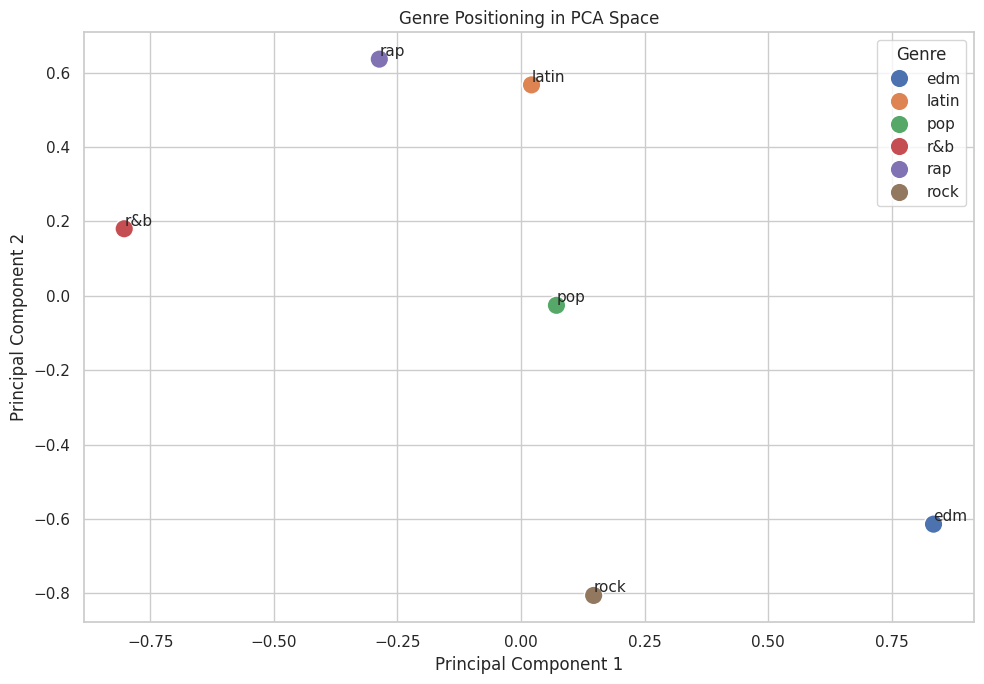

In [80]:
pca_coordinates = pca.transform(X_scaled)

genre_pca_centroids = pd.DataFrame({
    "playlist_genre": df["playlist_genre"].values,
    "PC1": pca_coordinates[:, 0],
    "PC2": pca_coordinates[:, 1]
}).groupby("playlist_genre")[["PC1", "PC2"]].mean().reset_index()

display(genre_pca_centroids)

plt.figure(figsize=(10, 7))

sns.scatterplot(
    data=genre_pca_centroids,
    x="PC1",
    y="PC2",
    hue="playlist_genre",
    s=180
)

for _, row in genre_pca_centroids.iterrows():
    plt.text(
        row["PC1"],
        row["PC2"],
        row["playlist_genre"],
        fontsize=11,
        ha="left",
        va="bottom"
    )

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("Genre Positioning in PCA Space")
plt.legend(title="Genre")
plt.tight_layout()
plt.show()

# Observation

The PCA genre positioning shows clear differences among the six genres in the reduced feature space. EDM is positioned strongly toward positive PC1 and negative PC2, while R&B is located toward negative PC1. Rap and Latin occupy the upper region with positive PC2 values. Rock is strongly negative on PC2, whereas Pop remains close to the center. This indicates that the major genres have distinguishable overall audio-feature profiles in the PCA representation, although individual tracks can still overlap substantially.

# 🔵 PCA Cluster Visualization

The first two principal components are used to visualize the six discovered
K-Means clusters in a two-dimensional space.

Each point represents one Spotify track, while its position is determined by
its PC1 and PC2 values.

The cluster labels are used to distinguish the discovered segments. This
visualization provides a direct view of how the clusters are distributed and
whether the segments appear compact, overlapping, or widely separated.

Because the first two principal components explain only 28.91% of the total
variance, this visualization represents only part of the complete
13-dimensional feature space.

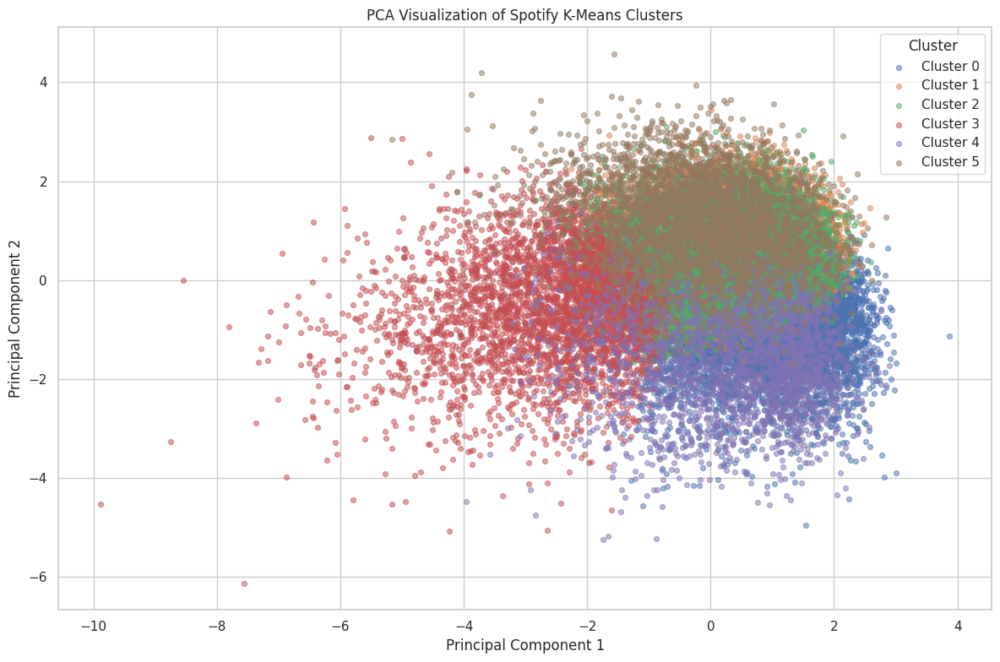

In [36]:
plt.figure(figsize=(12, 8))

for cluster_id in sorted(pca_df["cluster"].unique()):
    cluster_data = pca_df[pca_df["cluster"] == cluster_id]

    plt.scatter(
        cluster_data["PC1"],
        cluster_data["PC2"],
        label=f"Cluster {cluster_id}",
        alpha=0.5,
        s=18
    )

plt.title("PCA Visualization of Spotify K-Means Clusters")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster")

plt.tight_layout()
plt.show()

## Observation

The PCA scatter plot shows that the six K-Means clusters occupy overlapping
regions in the two-dimensional PCA space.

Cluster 3 is relatively more spread toward the negative PC1 direction, while
Cluster 4 is concentrated more strongly toward the lower PC2 region. Cluster 0
also shows a noticeable concentration toward the lower PC2 side.

Clusters 1, 2, and 5 have substantial overlap in the central and upper-right
regions of the PCA space. This indicates that several music segments share
similar combinations of audio characteristics.

The considerable overlap between clusters is consistent with the relatively
low silhouette score obtained during K-Means evaluation. Therefore, the PCA
visualization supports the conclusion that Spotify music characteristics form
continuous and overlapping patterns rather than sharply separated groups.

Since PC1 and PC2 together explain only **28.91%** of the total variance, the
two-dimensional plot should be interpreted as a visual representation of the
clustering structure rather than a complete representation of the original
13-dimensional feature space.

# 🎯 Dominant Genre Identification

This analysis identifies the dominant playlist genre within each K-Means
cluster.

The dominant genre is determined by calculating the percentage contribution
of each genre within a cluster. This helps interpret the musical
characteristics represented by each cluster.

,cluster,dominant_genre,percentage
0,0,rock,32.72
1,1,latin,21.34
2,2,pop,22.39
3,3,r&b,31.43
4,4,edm,57.81
5,5,rap,57.64


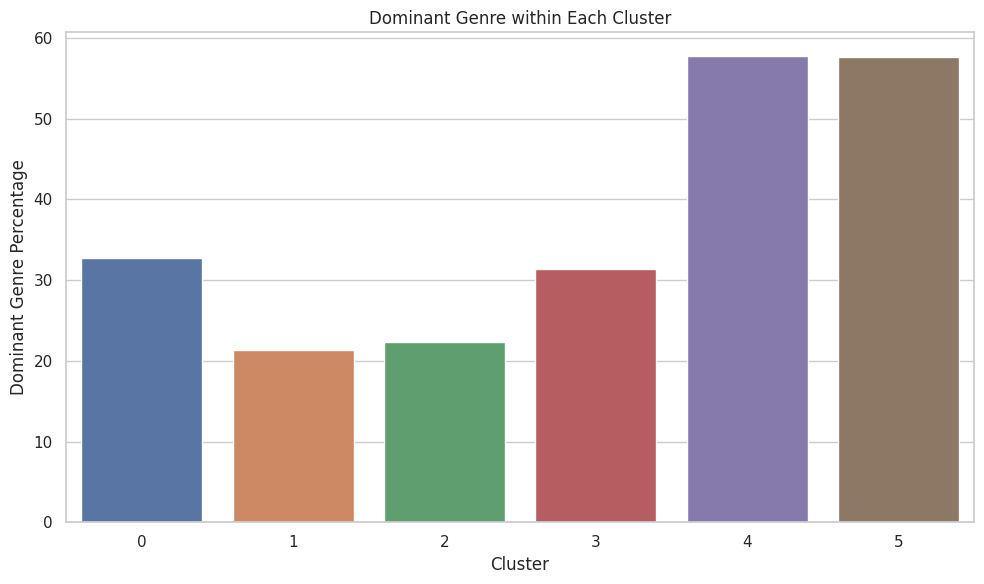

In [81]:
cluster_genre_percentage = (
    pd.crosstab(
        df["cluster"],
        df["playlist_genre"],
        normalize="index"
    ) * 100
)

dominant_genres = (
    cluster_genre_percentage
    .idxmax(axis=1)
    .reset_index()
)

dominant_genres.columns = [
    "cluster",
    "dominant_genre"
]

dominant_genres["percentage"] = [
    cluster_genre_percentage.loc[
        row["cluster"],
        row["dominant_genre"]
    ]
    for _, row in dominant_genres.iterrows()
]

dominant_genres["percentage"] = dominant_genres["percentage"].round(2)

display(dominant_genres)

plt.figure(figsize=(10, 6))

sns.barplot(
    data=dominant_genres,
    x="cluster",
    y="percentage",
    hue="dominant_genre",
    legend=False
)

plt.xlabel("Cluster")
plt.ylabel("Dominant Genre Percentage")
plt.title("Dominant Genre within Each Cluster")
plt.tight_layout()
plt.show()

# Observation

The analysis identifies the dominant genre within each cluster based on its percentage contribution. Cluster 4 is strongly associated with EDM at 57.81%, while Cluster 5 is strongly associated with Rap at 57.64%. Cluster 0 is dominated by Rock at 32.72%, and Cluster 3 by R&B at 31.43%. Clusters 1 and 2 have weaker dominance, with Latin at 21.34% and Pop at 22.39%, respectively. This shows that some clusters have strong genre alignment, while others contain a more mixed combination of genres.

# 📊 PCA Cluster Centroid Visualization

To further interpret the spatial structure of the discovered clusters, the
centroid of each K-Means cluster is projected into the PCA space.

The cluster centroids represent the central location of each segment based on
the standardized audio-feature space.

Displaying the centroids together with the individual tracks makes it easier
to compare the relative position of the six clusters and understand their
overall separation in the reduced feature space.

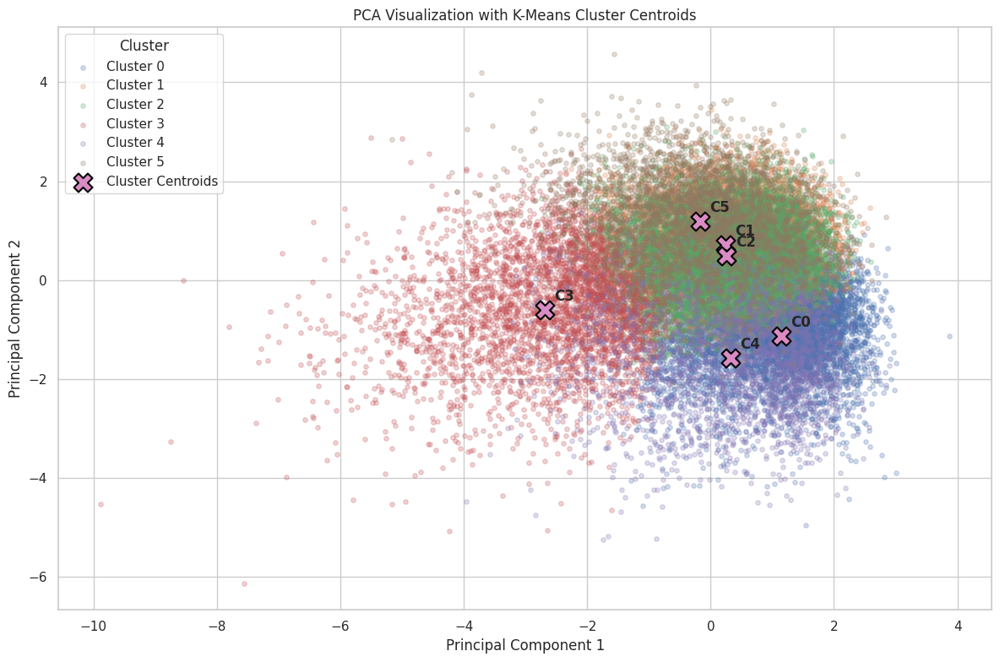

In [37]:
cluster_centers_pca = pca.transform(final_kmeans.cluster_centers_)

plt.figure(figsize=(12, 8))

for cluster_id in sorted(pca_df["cluster"].unique()):
    cluster_data = pca_df[pca_df["cluster"] == cluster_id]

    plt.scatter(
        cluster_data["PC1"],
        cluster_data["PC2"],
        label=f"Cluster {cluster_id}",
        alpha=0.25,
        s=15
    )

plt.scatter(
    cluster_centers_pca[:, 0],
    cluster_centers_pca[:, 1],
    marker="X",
    s=250,
    edgecolor="black",
    linewidth=1.5,
    label="Cluster Centroids"
)

for cluster_id, (pc1, pc2) in enumerate(cluster_centers_pca):
    plt.annotate(
        f"C{cluster_id}",
        (pc1, pc2),
        xytext=(8, 8),
        textcoords="offset points",
        fontsize=12,
        fontweight="bold"
    )

plt.title("PCA Visualization with K-Means Cluster Centroids")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster")

plt.tight_layout()
plt.show()

## Observation

The PCA centroid visualization shows that the six cluster centroids occupy
different positions within the reduced two-dimensional feature space.

Cluster 3 has the most distinct centroid position toward the negative PC1
direction, indicating that its overall audio profile differs noticeably from
the other clusters along the first principal component.

Clusters 1, 2, and 5 have relatively close centroid positions in the upper
portion of the PCA space, which reflects the similarity and overlap observed
among their audio-feature profiles.

Clusters 0 and 4 are positioned toward the lower PC2 region, with Cluster 4
located further toward the negative PC2 direction.

The centroids provide a compact representation of the central location of each
K-Means segment. Their positions, together with the substantial overlap among
individual tracks, reinforce that the discovered music segments are related
but not sharply separated in the reduced feature space.

# 🎼 Cluster-wise Genre Percentage Analysis

The previous analysis examined the absolute number of tracks from each playlist
genre within every cluster.

Because the six clusters contain different numbers of tracks, raw counts alone
may not provide a balanced comparison. Therefore, the genre composition of
each cluster is converted into percentages.

This analysis shows the relative contribution of each playlist genre within
each discovered cluster.

The resulting percentage distribution provides a clearer understanding of
which genres are more strongly represented within each cluster, while also
highlighting the overlap between genres across the audio-based segments.

Cluster-wise Genre Percentage Distribution:


playlist_genre,edm,latin,pop,r&b,rap,rock
cluster,,,,,,
0,28.93,5.35,18.28,6.34,8.39,32.72
1,13.77,21.34,21.16,18.82,17.50,7.42
2,10.65,21.58,22.39,15.36,15.38,14.64
3,3.36,10.88,18.75,31.43,15.96,19.62
4,57.81,8.05,12.23,3.40,9.32,9.19
5,5.62,10.71,6.10,19.02,57.64,0.90


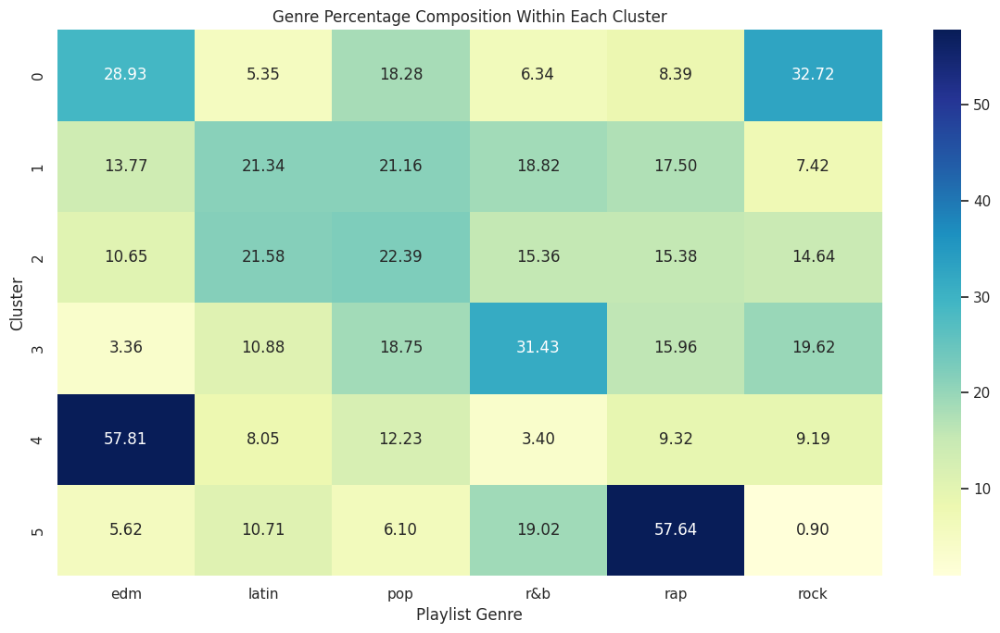

In [38]:
cluster_genre_percentage = (
    pd.crosstab(
        df["cluster"],
        df["playlist_genre"],
        normalize="index"
    ) * 100
)

cluster_genre_percentage = cluster_genre_percentage.round(2)

print("Cluster-wise Genre Percentage Distribution:")
display(cluster_genre_percentage)

plt.figure(figsize=(12, 7))

sns.heatmap(
    cluster_genre_percentage,
    annot=True,
    fmt=".2f",
    cmap="YlGnBu"
)

plt.title("Genre Percentage Composition Within Each Cluster")
plt.xlabel("Playlist Genre")
plt.ylabel("Cluster")

plt.tight_layout()
plt.show()

## Observation

The cluster-wise percentage analysis provides a clearer view of the dominant
genres within each discovered cluster.

Cluster 0 has the strongest representation of **Rock (32.72%)** and **EDM
(28.93%)**, indicating a strong concentration of these genres within this
high-energy segment.

Cluster 1 has a relatively balanced composition, with **Latin (21.34%)** and
**Pop (21.16%)** being the largest contributors, followed by R&B and Rap.

Cluster 2 is also relatively diverse, with **Pop (22.39%)** and **Latin
(21.58%)** forming the largest proportions. This indicates substantial overlap
between these genres in the audio-feature space.

Cluster 3 is dominated by **R&B (31.43%)**, followed by Rock at **19.62%** and
Pop at **18.75%**.

Cluster 4 has a strong concentration of **EDM (57.81%)**, making EDM the
dominant genre within this cluster by a considerable margin.

Cluster 5 is strongly dominated by **Rap (57.64%)**, followed by R&B at
**19.02%**. Rock contributes only **0.90%** to this cluster.

Overall, the percentage analysis confirms that some clusters have strong genre
dominance, particularly Cluster 4 for EDM and Cluster 5 for Rap, while other
clusters contain a more mixed combination of genres. This demonstrates that
the unsupervised audio-based segmentation captures genre tendencies without
being restricted to the predefined playlist labels.

# 🏷️ Cluster Interpretation

The discovered clusters are assigned descriptive names based on their dominant
audio characteristics.

These names do not represent official Spotify genre classifications. They are
interpretive labels created from the observed cluster feature profiles and
genre compositions.

The descriptive interpretation will make the clustering results easier to
understand and will also provide meaningful segment names for the later
recommendation system.

The interpretation considers energy, danceability, acousticness,
instrumentalness, speechiness, tempo, valence, duration, popularity, and genre
composition.

In [39]:
cluster_names = {
    0: "High-Energy Rock/EDM",
    1: "Danceable Mainstream",
    2: "Upbeat Positive",
    3: "Acoustic R&B",
    4: "Instrumental EDM",
    5: "Speech-Heavy Rap"
}

df["cluster_name"] = df["cluster"].map(cluster_names)

cluster_interpretation = (
    df.groupby(["cluster", "cluster_name"])
    .size()
    .reset_index(name="Track Count")
    .sort_values("cluster")
)

display(cluster_interpretation)

,cluster,cluster_name,Track Count
0,0,High-Energy Rock/EDM,5554
1,1,Danceable Mainstream,6196
2,2,Upbeat Positive,7303
3,3,Acoustic R&B,3659
4,4,Instrumental EDM,2297
5,5,Speech-Heavy Rap,3343


## Observation

The cluster-wise genre percentage analysis shows that several clusters have
strong genre preferences, while others contain a more balanced mixture of
genres.

Cluster 0 is mainly composed of **Rock (32.72%)** and **EDM (28.93%)**, making
these the dominant genres within this segment.

Cluster 1 has a relatively balanced distribution, with **Latin (21.34%)** and
**Pop (21.16%)** as its largest genre contributions.

Cluster 2 is similarly diverse, with **Pop (22.39%)** and **Latin (21.58%)**
forming the largest proportions.

Cluster 3 has its highest representation from **R&B (31.43%)**, followed by
Rock and Pop.

Cluster 4 shows strong **EDM dominance at 57.81%**, which agrees with its high
energy and instrumental characteristics identified during cluster profiling.

Cluster 5 is strongly dominated by **Rap at 57.64%**, consistent with its
highest speechiness among the six clusters.

Overall, the analysis confirms that the discovered clusters capture meaningful
genre tendencies while still containing overlap between multiple genres. This
is expected because the clustering model is based on numerical audio
characteristics rather than predefined genre labels.

# 🧭 Dominant Genre Identification for Each Cluster

The percentage composition of each cluster is used to identify its dominant
playlist genre.

The dominant genre is determined by selecting the genre with the highest
percentage within each cluster.

This provides a concise summary of the relationship between the unsupervised
audio-based clusters and the predefined Spotify genre categories.

The dominant genre should be interpreted as the strongest genre tendency of a
cluster rather than as a strict genre classification, because multiple genres
are present within most clusters.

,Cluster,Dominant Genre,Dominant Genre Percentage
0,0,rock,32.72
1,1,latin,21.34
2,2,pop,22.39
3,3,r&b,31.43
4,4,edm,57.81
5,5,rap,57.64


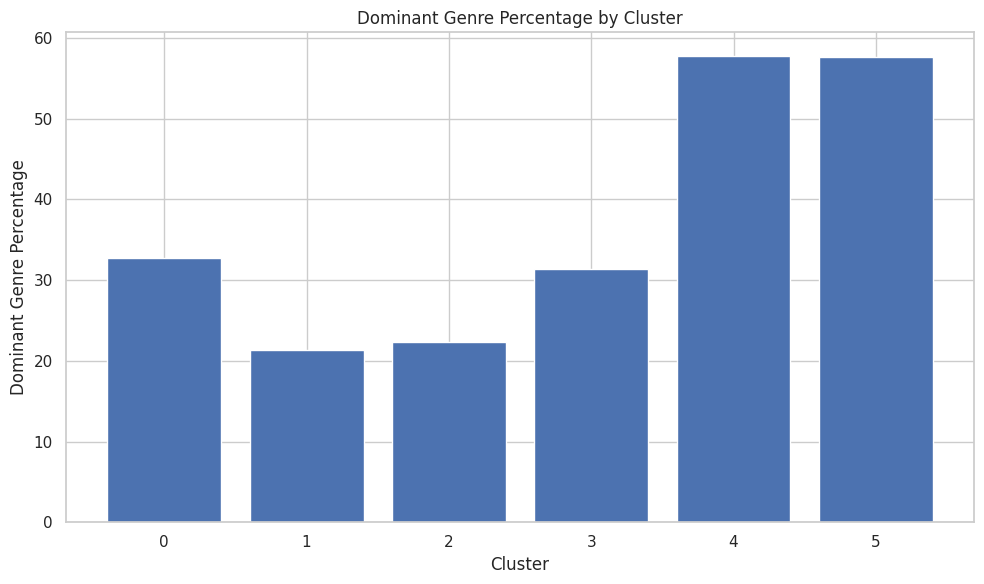

In [40]:
dominant_genres = cluster_genre_percentage.idxmax(axis=1)
dominant_genre_percentage = cluster_genre_percentage.max(axis=1)

dominant_genre_summary = pd.DataFrame({
    "Cluster": cluster_genre_percentage.index,
    "Dominant Genre": dominant_genres.values,
    "Dominant Genre Percentage": dominant_genre_percentage.values
})

display(dominant_genre_summary)

plt.figure(figsize=(10, 6))

plt.bar(
    dominant_genre_summary["Cluster"].astype(str),
    dominant_genre_summary["Dominant Genre Percentage"]
)

plt.title("Dominant Genre Percentage by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Dominant Genre Percentage")

plt.tight_layout()
plt.show()

## Observation

The dominant genre analysis shows that each cluster has a different primary
genre tendency.

Cluster 0 is dominated by **Rock**, representing **32.72%** of the cluster,
followed by EDM at 28.93%.

Cluster 1 has **Latin** as its dominant genre at **21.34%**, although its
composition is relatively balanced across several genres.

Cluster 2 is dominated by **Pop** at **22.39%**, with Latin contributing
21.58%, showing a high degree of genre overlap.

Cluster 3 is dominated by **R&B** at **31.43%**, making it the strongest genre
within this cluster.

Cluster 4 has the strongest genre concentration, with **EDM accounting for
57.81%** of the cluster.

Cluster 5 is similarly concentrated, with **Rap accounting for 57.64%** of the
cluster.

Overall, Clusters 4 and 5 show the clearest genre dominance, while Clusters 1
and 2 are more heterogeneous. This demonstrates that the audio-based
segmentation captures both strongly genre-associated segments and mixed
segments where different genres share similar musical characteristics.

# 🎵 Playlist-Level Feature Aggregation

The analysis now moves from individual tracks to the playlist level.

Playlist-level analysis aggregates the numerical audio characteristics of
tracks belonging to the same playlist. This provides a higher-level
representation of the musical characteristics associated with individual
playlists.

The playlist feature matrix will be created using the mean values of the
selected numerical audio features.

This representation will be used for a separate playlist-level clustering
analysis, allowing playlists to be grouped according to their overall audio
profiles rather than the characteristics of individual tracks.

In [41]:
playlist_features = [
    "danceability",
    "energy",
    "key",
    "loudness",
    "mode",
    "speechiness",
    "acousticness",
    "instrumentalness",
    "liveness",
    "valence",
    "tempo",
    "duration_min",
    "track_popularity"
]

playlist_profile = (
    df.groupby("playlist_name")[playlist_features]
    .mean()
)

print("Number of Unique Playlists:", playlist_profile.shape[0])
print("Number of Playlist-Level Features:", playlist_profile.shape[1])
print("Playlist Feature Matrix Shape:", playlist_profile.shape)

print("\nPlaylist-Level Feature Profile:")
display(playlist_profile.head(10).round(3))

Number of Unique Playlists: 448
Number of Playlist-Level Features: 13
Playlist Feature Matrix Shape: (448, 13)

Playlist-Level Feature Profile:


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min,track_popularity
playlist_name,,,,,,,,,,,,,
"""Permanent Wave""",0.649,0.737,3.500,-9.939,0.864,0.041,0.086,0.116,0.159,0.758,116.820,4.380,35.864
10er Playlist,0.695,0.711,4.809,-5.502,0.489,0.090,0.125,0.018,0.153,0.530,118.138,3.788,66.532
1987-1997 OLD SKOOL JAMZ,0.705,0.701,5.300,-7.772,0.625,0.055,0.154,0.007,0.134,0.686,115.609,4.483,27.325
2000's hard rock,0.442,0.901,5.395,-4.732,0.605,0.090,0.002,0.089,0.195,0.471,135.256,3.932,49.047
2010 - 2011 - 2012 - 2013 - 2014 - 2015 - 2016 - 2017 - 2018 - 2019 - 2020 TOP HITS,0.652,0.713,4.400,-5.871,0.560,0.092,0.138,0.002,0.186,0.476,118.210,3.318,47.880
2011-2014 House,0.613,0.835,5.286,-4.549,0.519,0.086,0.032,0.271,0.215,0.335,127.758,4.508,25.143
2015 songs,0.649,0.697,4.837,-5.645,0.558,0.067,0.126,0.002,0.179,0.526,119.641,3.602,59.953
2019 in Indie Poptimism,0.623,0.597,4.926,-6.889,0.755,0.076,0.257,0.023,0.182,0.461,117.766,3.345,59.053
2020 Hits & 2019 Hits – Top Global Tracks 🔥🔥🔥,0.682,0.567,5.792,-6.686,0.500,0.117,0.258,0.002,0.146,0.500,104.974,3.375,76.000


## Observation

The playlist-level aggregation produced a feature matrix containing **448 unique
playlists** and **13 numerical audio features**.

Each playlist is represented by the mean values of its tracks' audio
characteristics, providing a compact representation of the overall musical
profile of that playlist.

The aggregated profiles show noticeable differences between playlists. For
example, the `2000's hard rock` playlist has high energy and tempo with very
low acousticness, while `Permanent Wave` has higher valence and longer average
duration.

The playlist-level feature matrix provides a suitable foundation for performing
a separate clustering analysis at the playlist level.

# 📏 Playlist-Level Feature Standardization

The playlist-level features have different numerical scales, similar to the
track-level features used earlier.

Standardization is therefore applied before playlist-level clustering so that
features with larger numerical ranges do not disproportionately influence the
distance calculations.

The same `StandardScaler` approach is used to transform the 13 playlist-level
audio features into a comparable scale.

The standardized playlist matrix will be used for the separate playlist-level
K-Means clustering analysis.

In [42]:
playlist_scaler = StandardScaler()

playlist_scaled = playlist_scaler.fit_transform(playlist_profile)

playlist_scaled_df = pd.DataFrame(
    playlist_scaled,
    columns=playlist_features,
    index=playlist_profile.index
)

print("Original Playlist Feature Matrix Shape:", playlist_profile.shape)
print("Standardized Playlist Feature Matrix Shape:", playlist_scaled.shape)

print("\nStandardized Playlist Feature Statistics:")
display(
    playlist_scaled_df.agg(["mean", "std"]).T.round(4)
)

Original Playlist Feature Matrix Shape: (448, 13)
Standardized Playlist Feature Matrix Shape: (448, 13)

Standardized Playlist Feature Statistics:


,mean,std
danceability,-0.0,1.0011
energy,-0.0,1.0011
key,-0.0,1.0011
loudness,0.0,1.0011
mode,-0.0,1.0011
speechiness,-0.0,1.0011
acousticness,0.0,1.0011
instrumentalness,-0.0,1.0011
liveness,-0.0,1.0011
valence,-0.0,1.0011


## Observation

The playlist-level feature standardization was completed successfully for all
448 playlists and 13 numerical features.

After applying `StandardScaler`, the mean of every feature is approximately
zero and the standard deviation is approximately one. The standardized
playlist feature matrix retains the original dimensions of **448 playlists
and 13 features**.

This confirms that the playlist-level features are on a comparable scale and
are suitable for distance-based clustering.

The standardized playlist feature matrix is now ready for the separate
playlist-level K-Means clustering analysis.

# 🎯 Playlist-Level K-Means Clustering

A separate K-Means clustering model is applied at the playlist level to group
playlists according to their overall audio characteristics.

Unlike the track-level model, which segments individual songs, this analysis
operates on the aggregated feature profiles of the 448 playlists.

Based on the project methodology, **5 clusters** are used for playlist-level
segmentation.

The resulting playlist cluster labels will allow the overall musical profiles
of different playlists to be compared and interpreted.

In [43]:
playlist_kmeans = KMeans(
    n_clusters=5,
    random_state=RANDOM_STATE,
    n_init=10
)

playlist_clusters = playlist_kmeans.fit_predict(playlist_scaled)

playlist_profile["playlist_cluster"] = playlist_clusters

print("Playlist-Level K-Means Model Trained Successfully.")
print("Number of Playlist Clusters:", playlist_kmeans.n_clusters)
print("Playlist-Level Inertia:", round(playlist_kmeans.inertia_, 4))

print("\nPlaylist Cluster Distribution:")
display(
    playlist_profile["playlist_cluster"]
    .value_counts()
    .sort_index()
    .to_frame("Playlist Count")
)

Playlist-Level K-Means Model Trained Successfully.
Number of Playlist Clusters: 5
Playlist-Level Inertia: 3713.4453

Playlist Cluster Distribution:


,Playlist Count
playlist_cluster,
0,87
1,43
2,86
3,156
4,76


## Observation

The playlist-level K-Means model successfully grouped the **448 playlists into
5 clusters** based on their aggregated audio-feature profiles.

Cluster 3 contains the largest number of playlists with **156 playlists**,
while Cluster 1 contains the smallest number with **43 playlists**. The
remaining clusters contain 87, 86, and 76 playlists respectively.

The unequal cluster sizes indicate that the playlists are distributed
differently across the audio-feature space rather than forming equally sized
groups.

The playlist-level clustering provides a higher-level segmentation of the
dataset and complements the track-level clustering by identifying groups of
playlists with similar overall musical characteristics.

# 📊 Playlist Cluster Feature Profiling

The characteristics of the five playlist-level clusters are analyzed by
calculating the average audio features within each cluster.

This profiling helps interpret the overall musical characteristics of each
playlist segment.

The analysis considers the same 13 numerical audio features used to create the
playlist-level representation.

The resulting profiles will be used to identify the dominant characteristics
of each playlist cluster and compare them with the track-level segmentation.

In [44]:
playlist_cluster_profile = (
    playlist_profile
    .groupby("playlist_cluster")[playlist_features]
    .mean()
    .round(3)
)

display(playlist_cluster_profile)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min,track_popularity
playlist_cluster,,,,,,,,,,,,,
0,0.622,0.825,5.338,-5.262,0.507,0.086,0.062,0.219,0.214,0.382,126.412,3.636,32.618
1,0.619,0.501,5.494,-9.667,0.570,0.092,0.398,0.180,0.163,0.440,113.225,3.578,44.477
2,0.553,0.714,5.026,-7.611,0.723,0.059,0.164,0.052,0.211,0.546,124.320,4.130,39.638
3,0.712,0.684,5.266,-6.018,0.544,0.126,0.193,0.015,0.174,0.538,121.906,3.425,52.174
4,0.720,0.688,5.698,-7.379,0.512,0.156,0.160,0.038,0.195,0.626,113.062,4.171,28.114


## Observation

The playlist-level cluster profiles show clear differences in the overall audio
characteristics of the five playlist segments.

Playlist Cluster 0 is characterized by very high energy at **0.825**, relatively
high instrumentalness at **0.219**, and a high average tempo of **126.412 BPM**.
This represents a strongly energetic playlist profile.

Playlist Cluster 1 has the lowest average energy at **0.501** and the highest
acousticness among the five clusters at **0.398**. It also has relatively low
tempo and loudness, indicating a softer and more acoustic-oriented playlist
profile.

Playlist Cluster 2 has moderate-to-high energy at **0.714**, relatively low
danceability at **0.553**, and the longest average duration at **4.130 minutes**.
Its mode value of **0.723** is also relatively high.

Playlist Cluster 3 has the highest danceability at **0.712** and the highest
average track popularity at **52.174**. It also has low instrumentalness at
**0.015**, indicating a strongly accessible and popular playlist profile.

Playlist Cluster 4 has the highest valence at **0.626** and the highest
danceability at **0.720**, together with relatively high speechiness at
**0.156**. It also has a relatively long average duration of **4.171 minutes**,
but the lowest average popularity at **28.114**.

Overall, the playlist-level clustering identifies five distinct higher-level
audio profiles. The differences in energy, acousticness, danceability,
instrumentalness, valence, duration, tempo, and popularity demonstrate that
playlists can be segmented according to their overall musical characteristics.

# 📊 Playlist Cluster Feature Comparison

The average audio-feature profiles of the five playlist clusters are visualized
to provide a direct comparison of their musical characteristics.

A heatmap is used to identify the features that most strongly distinguish the
playlist clusters.

This visualization complements the numerical cluster profile and makes it
easier to identify patterns such as high-energy playlists, acoustic-oriented
playlists, highly danceable playlists, and playlists with different popularity
levels.

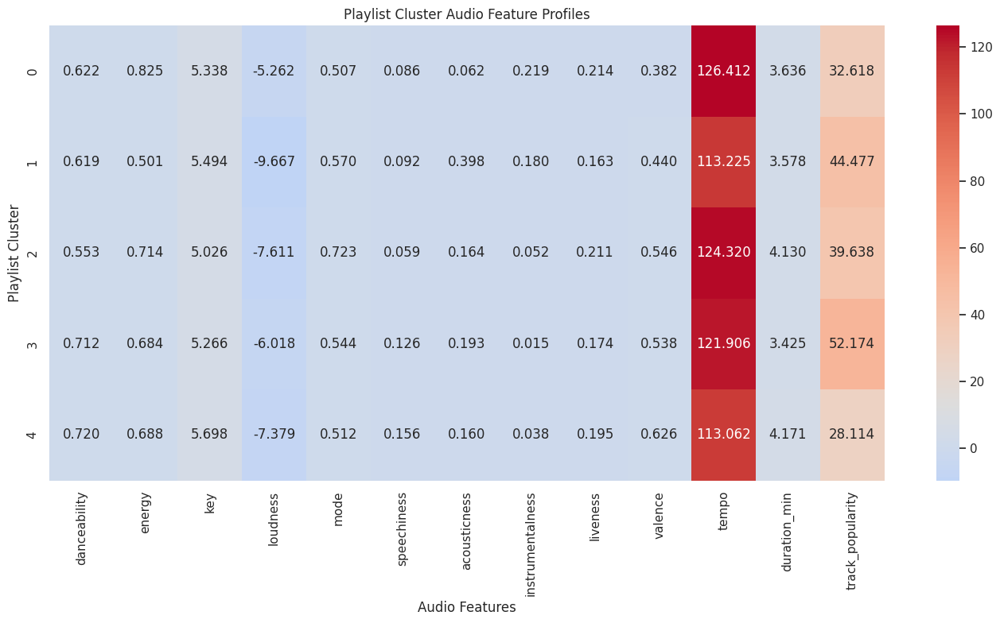

In [45]:
plt.figure(figsize=(14, 8))

sns.heatmap(
    playlist_cluster_profile,
    annot=True,
    fmt=".3f",
    cmap="coolwarm",
    center=playlist_cluster_profile.values.mean()
)

plt.title("Playlist Cluster Audio Feature Profiles")
plt.xlabel("Audio Features")
plt.ylabel("Playlist Cluster")

plt.tight_layout()
plt.show()

## Observation

The playlist cluster heatmap confirms that the five playlist-level clusters
have distinct overall audio-feature profiles.

Playlist Cluster 0 is strongly characterized by high energy (**0.825**) and
high tempo (**126.412 BPM**), together with relatively high
instrumentalness (**0.219**).

Playlist Cluster 1 has the lowest energy (**0.501**) and the highest
acousticness (**0.398**), indicating a comparatively softer and more
acoustic-oriented playlist profile.

Playlist Cluster 2 has moderate-to-high energy (**0.714**) with relatively
low danceability (**0.553**) and a longer average duration (**4.130 minutes**).

Playlist Cluster 3 combines high danceability (**0.712**) and relatively high
energy (**0.684**) with the highest track popularity (**52.174**), indicating a
more accessible and popular playlist profile.

Playlist Cluster 4 has the highest danceability (**0.720**) and valence
(**0.626**), while also having relatively high speechiness (**0.156**) and
longer average duration (**4.171 minutes**).

Overall, the heatmap demonstrates that playlist-level clustering captures
meaningful differences in musical characteristics across playlists. The
identified differences provide a useful higher-level representation for
playlist segmentation and can complement the individual-track recommendation
system.

# 🎵 Recommendation Feature Matrix Preparation

The recommendation system requires a numerical representation of every track
that captures its musical characteristics.

The standardized 13-dimensional audio-feature matrix developed during the
clustering stage is reused for content-based recommendation.

Using the same standardized feature representation ensures that the
recommendation system evaluates similarity using the same musical attributes
that were used to create the K-Means segments.

Cosine similarity will be used to compare tracks based on the direction of
their feature vectors rather than their absolute magnitude.

Instead of constructing a complete 28,352 × 28,352 similarity matrix, the
recommendation system will calculate similarities for the requested track when
needed. This avoids unnecessary memory consumption while providing the same
similarity-based recommendation logic.

In [46]:
recommendation_features = X_scaled.copy()

print("Recommendation Feature Matrix Shape:", recommendation_features.shape)
print("Number of Tracks:", recommendation_features.shape[0])
print("Number of Recommendation Features:", recommendation_features.shape[1])

print("\nRecommendation Features:")
print(clustering_features)

Recommendation Feature Matrix Shape: (28352, 13)
Number of Tracks: 28352
Number of Recommendation Features: 13

Recommendation Features:
['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_min', 'track_popularity']


## Observation

The recommendation feature matrix contains **28,352 tracks and 13 numerical
features**, matching the feature space used for the final K-Means clustering
model.

The recommendation system therefore represents every track using the same
standardized audio characteristics, including danceability, energy, loudness,
speechiness, acousticness, instrumentalness, valence, tempo, duration, and
popularity.

Using this standardized representation ensures that no individual feature with
a larger numerical scale disproportionately affects the similarity calculation.

The recommendation feature matrix is ready for calculating track-to-track
cosine similarity.

# 🔗 Cosine Similarity Calculation

Cosine Similarity is used to measure the similarity between Spotify tracks
based on their standardized audio-feature vectors.

The similarity value represents how closely two tracks are aligned in the
multidimensional feature space. A higher value indicates greater similarity
between the corresponding audio profiles.

For efficient recommendation generation, similarity is calculated for an
individual query track against the complete recommendation feature matrix.

The query track itself is excluded from the recommendation results so that the
system returns other tracks rather than recommending the same track.

In [47]:
def calculate_track_similarity(track_index):
    query_vector = recommendation_features[track_index].reshape(1, -1)
    similarity_scores = cosine_similarity(
        query_vector,
        recommendation_features
    )[0]

    similarity_scores[track_index] = -1

    return similarity_scores

sample_track_index = 0

sample_similarity_scores = calculate_track_similarity(sample_track_index)

print("Query Track:")
print(df.iloc[sample_track_index]["track_name"])

print("\nArtist:")
print(df.iloc[sample_track_index]["track_artist"])

print("\nSimilarity Scores Calculated:", len(sample_similarity_scores))
print("Highest Similarity Score:", round(sample_similarity_scores.max(), 4))

Query Track:
I Don't Care (with Justin Bieber) - Loud Luxury Remix

Artist:
Ed Sheeran

Similarity Scores Calculated: 28352
Highest Similarity Score: 0.9594


## Observation

The cosine similarity calculation was completed successfully for the selected
query track.

The query track, **"I Don't Care (with Justin Bieber) - Loud Luxury Remix" by
Ed Sheeran**, was compared against all **28,352 tracks** in the recommendation
feature matrix.

The highest similarity score obtained was **0.9594**, indicating that at least
one other track has a very similar standardized audio-feature profile to the
query track.

The query track itself was excluded from the similarity ranking, ensuring that
the recommendation results can contain only other tracks.

The similarity calculation is therefore ready to be used for generating
ranked global song recommendations.

# 🎵 Global Song Recommendation

The global recommendation system identifies tracks that are most similar to a
selected query track across the complete Spotify dataset.

The similarity scores calculated using cosine similarity are sorted in
descending order, and the highest-scoring tracks are selected as
recommendations.

This approach considers the complete standardized audio-feature space without
restricting recommendations to the query track's K-Means cluster.

The resulting recommendations represent the tracks with the closest overall
audio-feature profiles to the selected song.

In [48]:
def get_global_recommendations(track_index, top_n=10):
    similarity_scores = calculate_track_similarity(track_index)

    top_indices = np.argsort(similarity_scores)[::-1][:top_n]

    recommendations = df.iloc[top_indices][
        [
            "track_name",
            "track_artist",
            "playlist_genre",
            "playlist_subgenre",
            "cluster",
            "cluster_name"
        ]
    ].copy()

    recommendations["similarity_score"] = similarity_scores[top_indices]

    return recommendations.reset_index(drop=True)

global_recommendations = get_global_recommendations(
    sample_track_index,
    top_n=10
)

print("Query Track:")
print(df.iloc[sample_track_index]["track_name"])

print("\nGlobal Recommendations:")
display(global_recommendations)

Query Track:
I Don't Care (with Justin Bieber) - Loud Luxury Remix

Global Recommendations:


,track_name,track_artist,playlist_genre,playlist_subgenre,cluster,cluster_name,similarity_score
0,The Fox (What Does the Fox Say?),Ylvis,pop,post-teen pop,2,Upbeat Positive,0.959403
1,Violeta,IZ*ONE,pop,dance pop,2,Upbeat Positive,0.934257
2,Brave,Don Diablo,pop,dance pop,2,Upbeat Positive,0.933728
3,Perfect (feat. Haris) - LUM!X Remix,Lucas & Steve,edm,electro house,2,Upbeat Positive,0.923621
4,Muñequita Linda,Juan Magán,latin,latin hip hop,2,Upbeat Positive,0.916048
5,With U (feat. Karen Harding),Tujamo,edm,progressive electro house,2,Upbeat Positive,0.913819
6,Came Here for Love,Sigala,pop,dance pop,2,Upbeat Positive,0.912810
7,Gone - The Wild Remix,Charli XCX,pop,dance pop,2,Upbeat Positive,0.908301
8,Magnets (feat. Sophie Simmons),Sam Feldt,pop,dance pop,2,Upbeat Positive,0.906590
9,Found Me (feat. Maria Hazell),The Him,pop,dance pop,2,Upbeat Positive,0.900227


## Observation

The global recommendation system successfully generated the top 10 tracks most
similar to the selected query track based on the 13 standardized audio
features.

The highest similarity is **0.9594** for **"The Fox (What Does the Fox Say?)" by
Ylvis**, followed by **"Violeta" by IZ*ONE** with a similarity of **0.9343** and
**"Brave" by Don Diablo** with **0.9337**.

The recommendations contain tracks from Pop, EDM, and Latin genres, showing
that the system is based on audio-feature similarity rather than restricting
recommendations to the original playlist genre.

An important observation is that all ten recommended tracks belong to
**Cluster 0 or Cluster 2**, with the majority belonging to Cluster 2. This
indicates that tracks with highly similar audio profiles are concentrated
within particular K-Means segments.

The results demonstrate that cosine similarity can identify tracks with
strongly related musical characteristics across the complete dataset.

# 🎯 Same-Cluster Recommendation System

The global recommendation system searches across the complete track dataset.
A cluster-aware recommendation approach is now developed to further refine the
recommendation results.

In this approach, recommendations are generated only from tracks belonging to
the same K-Means cluster as the selected query track.

Restricting the candidate tracks to the same cluster helps ensure that the
recommended songs share both a similar audio-feature profile and a common
segment within the discovered music structure.

The query track itself is excluded from the candidate set, and the remaining
tracks are ranked according to cosine similarity.

In [50]:
def get_same_cluster_recommendations(track_index, top_n=10):
    query_cluster = df.iloc[track_index]["cluster"]

    cluster_positions = np.where(
        df["cluster"].to_numpy() == query_cluster
    )[0]

    query_vector = recommendation_features[track_index].reshape(1, -1)
    candidate_vectors = recommendation_features[cluster_positions]

    similarity_scores = cosine_similarity(
        query_vector,
        candidate_vectors
    )[0]

    query_position = np.where(cluster_positions == track_index)[0]

    if len(query_position) > 0:
        similarity_scores[query_position[0]] = -1

    top_positions = np.argsort(similarity_scores)[::-1][:top_n]
    top_indices = cluster_positions[top_positions]

    recommendations = df.iloc[top_indices][
        [
            "track_name",
            "track_artist",
            "playlist_genre",
            "playlist_subgenre",
            "cluster",
            "cluster_name"
        ]
    ].copy()

    recommendations["similarity_score"] = similarity_scores[top_positions]

    return recommendations.reset_index(drop=True)


same_cluster_recommendations = get_same_cluster_recommendations(
    sample_track_index,
    top_n=10
)

print("Query Track:")
print(df.iloc[sample_track_index]["track_name"])

print("\nQuery Cluster:")
print(df.iloc[sample_track_index]["cluster_name"])

print("\nSame-Cluster Recommendations:")
display(same_cluster_recommendations)

Query Track:
I Don't Care (with Justin Bieber) - Loud Luxury Remix

Query Cluster:
Upbeat Positive

Same-Cluster Recommendations:


,track_name,track_artist,playlist_genre,playlist_subgenre,cluster,cluster_name,similarity_score
0,The Fox (What Does the Fox Say?),Ylvis,pop,post-teen pop,2,Upbeat Positive,0.959403
1,Violeta,IZ*ONE,pop,dance pop,2,Upbeat Positive,0.934257
2,Brave,Don Diablo,pop,dance pop,2,Upbeat Positive,0.933728
3,Perfect (feat. Haris) - LUM!X Remix,Lucas & Steve,edm,electro house,2,Upbeat Positive,0.923621
4,Muñequita Linda,Juan Magán,latin,latin hip hop,2,Upbeat Positive,0.916048
5,With U (feat. Karen Harding),Tujamo,edm,progressive electro house,2,Upbeat Positive,0.913819
6,Came Here for Love,Sigala,pop,dance pop,2,Upbeat Positive,0.912810
7,Gone - The Wild Remix,Charli XCX,pop,dance pop,2,Upbeat Positive,0.908301
8,Magnets (feat. Sophie Simmons),Sam Feldt,pop,dance pop,2,Upbeat Positive,0.906590
9,Found Me (feat. Maria Hazell),The Him,pop,dance pop,2,Upbeat Positive,0.900227


## Observation

The same-cluster recommendation system successfully generated the top 10
recommendations for the query track **"I Don't Care (with Justin Bieber) -
Loud Luxury Remix" by Ed Sheeran**.

The query track belongs to the **Upbeat Positive** cluster, and all returned
recommendations also belong to the same cluster. This confirms that the
cluster-aware recommendation approach successfully restricts recommendations
to the selected track's discovered audio segment.

The highest similarity score is **0.9594** for **"The Fox (What Does the Fox
Say?)" by Ylvis**, followed by **"Violeta" by IZ*ONE** at **0.9343** and
**"Brave" by Don Diablo** at **0.9337**.

The recommendations include Pop, EDM, and Latin tracks despite the
same-cluster restriction. This demonstrates that the system recommends songs
according to their audio characteristics rather than requiring them to have
the same predefined playlist genre.

For this particular query, the global and same-cluster recommendation results
are identical because the highest-similarity tracks already belong to the
query track's cluster.

# 🔄 Global vs Same-Cluster Recommendation Comparison

The global and same-cluster recommendation approaches are compared to
understand the effect of cluster-based candidate filtering.

The global method searches across all available tracks, while the same-cluster
method restricts the candidate pool to tracks belonging to the query track's
K-Means cluster.

Comparing the two approaches provides an important validation of the proposed
cluster-aware recommendation strategy.

The comparison uses the previously generated recommendations for the same
query track and examines their similarity scores and cluster membership.

In [51]:
comparison = pd.DataFrame({
    "Global Recommendation": global_recommendations["track_name"],
    "Global Similarity": global_recommendations["similarity_score"],
    "Global Cluster": global_recommendations["cluster"],
    "Same-Cluster Recommendation": same_cluster_recommendations["track_name"],
    "Same-Cluster Similarity": same_cluster_recommendations["similarity_score"],
    "Same-Cluster Cluster": same_cluster_recommendations["cluster"]
})

display(comparison.round(4))

print("Global Recommendations:", len(global_recommendations))
print("Same-Cluster Recommendations:", len(same_cluster_recommendations))
print(
    "Same-Cluster Query Cluster:",
    df.iloc[sample_track_index]["cluster"]
)

,Global Recommendation,Global Similarity,Global Cluster,Same-Cluster Recommendation,Same-Cluster Similarity,Same-Cluster Cluster
0,The Fox (What Does the Fox Say?),0.9594,2,The Fox (What Does the Fox Say?),0.9594,2
1,Violeta,0.9343,2,Violeta,0.9343,2
2,Brave,0.9337,2,Brave,0.9337,2
3,Perfect (feat. Haris) - LUM!X Remix,0.9236,2,Perfect (feat. Haris) - LUM!X Remix,0.9236,2
4,Muñequita Linda,0.9160,2,Muñequita Linda,0.9160,2
5,With U (feat. Karen Harding),0.9138,2,With U (feat. Karen Harding),0.9138,2
6,Came Here for Love,0.9128,2,Came Here for Love,0.9128,2
7,Gone - The Wild Remix,0.9083,2,Gone - The Wild Remix,0.9083,2
8,Magnets (feat. Sophie Simmons),0.9066,2,Magnets (feat. Sophie Simmons),0.9066,2
9,Found Me (feat. Maria Hazell),0.9002,2,Found Me (feat. Maria Hazell),0.9002,2


Global Recommendations: 10
Same-Cluster Recommendations: 10
Same-Cluster Query Cluster: 2


## Observation

The comparison shows that the **Global Recommendation** and **Same-Cluster
Recommendation** approaches produced the same top 10 recommendations for the
selected query track.

All ten recommended tracks belong to **Cluster 2**, which is also the cluster
of the query track. Therefore, restricting the candidate pool to the same
cluster did not change the final recommendation ranking for this particular
query.

The similarity scores range from **0.9594** for the highest-ranked
recommendation to **0.9002** for the tenth recommendation, indicating strong
audio-feature similarity between the query track and the recommended tracks.

This result demonstrates that the cluster-aware approach can preserve highly
similar recommendations when the globally most similar tracks are already
located within the same K-Means segment.

However, this comparison represents only one query track. Additional queries
will be evaluated later to determine situations where cluster-based filtering
produces different recommendations from the global approach.

# 🎯 Reusable Recommendation Function

The recommendation logic is now converted into a reusable function that can
accept a track name and generate recommendations automatically.

The function searches the dataset for the requested track, identifies its
cluster, calculates cosine similarity, and returns the most similar tracks.

Both global and same-cluster recommendation modes are supported. This makes
the recommendation system flexible and provides a foundation for the
interactive user interface developed later.

The function also handles invalid track names by displaying an appropriate
message instead of producing an indexing error.

In [53]:
def recommend_tracks(track_name, top_n=10, mode="same_cluster"):
    matches = df[
        df["track_name"].str.lower() == track_name.lower()
    ]

    if len(matches) == 0:
        print("Track not found in the dataset.")
        return

    track_index = matches.index[0]
    track_position = df.index.get_loc(track_index)

    if mode == "global":
        recommendations = get_global_recommendations(
            track_position,
            top_n
        )
    elif mode == "same_cluster":
        recommendations = get_same_cluster_recommendations(
            track_position,
            top_n
        )
    else:
        print("Mode must be 'global' or 'same_cluster'.")
        return

    print("Query Track:", df.iloc[track_position]["track_name"])
    print("Artist:", df.iloc[track_position]["track_artist"])
    print("Cluster:", df.iloc[track_position]["cluster_name"])
    print("Recommendation Mode:", mode)

    display(recommendations)

    return recommendations

In [54]:
test_recommendations = recommend_tracks(
    "Memories",
    top_n=10,
    mode="same_cluster"
)

Query Track: Memories
Artist: Maroon 5
Cluster: Acoustic R&B
Recommendation Mode: same_cluster


,track_name,track_artist,playlist_genre,playlist_subgenre,cluster,cluster_name,similarity_score
0,This City,Sam Fischer,latin,latin pop,3,Acoustic R&B,0.941933
1,Hear Me Now,Alok,pop,electropop,3,Acoustic R&B,0.935451
2,Dancing With Your Ghost,Sasha Sloan,r&b,urban contemporary,3,Acoustic R&B,0.934212
3,I,Lil Skies,pop,electropop,3,Acoustic R&B,0.931986
4,Blue Ain't Your Color,Keith Urban,latin,latin hip hop,3,Acoustic R&B,0.928915
5,Banana Pancakes,Jack Johnson,latin,latin pop,3,Acoustic R&B,0.925490
6,Don't Check On Me (feat. Justin Bieber & Ink),Chris Brown,latin,latin pop,3,Acoustic R&B,0.917739
7,Cruel,Jeff Bernat,r&b,neo soul,3,Acoustic R&B,0.915974
8,Team,Noah Cyrus,r&b,hip pop,3,Acoustic R&B,0.914562
9,Don't Check On Me (feat. Justin Bieber & Ink),Chris Brown,r&b,urban contemporary,3,Acoustic R&B,0.911265


## Observation

The reusable recommendation function successfully processed a different query
track, **"Memories" by Maroon 5**, confirming that the recommendation pipeline
works beyond the original test track.

The track was assigned to the **Acoustic R&B** cluster. The highest similarity
score was **0.9419** for **"This City" by Sam Fischer**, followed by **"Hear Me
Now" by Alok** with a similarity score of **0.9355**.

All ten recommendations belong to **Cluster 3 (Acoustic R&B)**, confirming that
the same-cluster recommendation mode correctly filters the candidate tracks
according to the query track's cluster.

The recommendations span multiple playlist genres, including Latin, Pop, and
R&B. This demonstrates that the system is driven primarily by similarity in
audio characteristics rather than by the original playlist genre labels.

The successful result also confirms that the reusable function can identify a
track by name, determine its cluster, calculate cosine similarity, and return
ranked recommendations automatically.

# 🎛️ Interactive Recommendation System

The recommendation engine is now converted into an interactive interface
using IPyWidgets.

The interface allows a user to select a Spotify track, choose the number of
recommendations, select the recommendation strategy, and generate results
without directly modifying the underlying Python code.

This provides a practical user-facing layer over the machine learning
pipeline and demonstrates how the developed recommendation model can be
integrated into an interactive application.

In [56]:
import ipywidgets as widgets
from IPython.display import display, clear_output

track_names = sorted(
    df["track_name"].dropna().unique().tolist()
)

track_search = widgets.Combobox(
    options=track_names,
    value="Memories" if "Memories" in track_names else track_names[0],
    placeholder="Type a song name...",
    description="Track:",
    ensure_option=True,
    layout=widgets.Layout(width="80%")
)

top_n_slider = widgets.IntSlider(
    value=10,
    min=5,
    max=20,
    step=1,
    description="Top N:",
    continuous_update=False
)

mode_dropdown = widgets.Dropdown(
    options=[
        ("Same Cluster", "same_cluster"),
        ("Global", "global")
    ],
    value="same_cluster",
    description="Mode:"
)

recommend_button = widgets.Button(
    description="Generate Recommendations",
    button_style="primary",
    layout=widgets.Layout(width="220px")
)

output_area = widgets.Output()

def generate_interactive_recommendations(button):
    with output_area:
        clear_output()

        recommend_tracks(
            track_search.value,
            top_n=top_n_slider.value,
            mode=mode_dropdown.value
        )

recommend_button.on_click(generate_interactive_recommendations)

display(
    widgets.VBox([
        track_search,
        top_n_slider,
        mode_dropdown,
        recommend_button,
        output_area
    ])
)

## Observation

The interactive recommendation interface successfully generated recommendations
for the selected track **"Memories" by Maroon 5** using the Same Cluster
strategy.

The interface allows the user to select a track, control the number of
recommendations, choose between Global and Same Cluster recommendation modes,
and generate results interactively.

For the selected query, the track was identified as belonging to the
**Acoustic R&B** cluster, and the system returned ten recommendations from the
same cluster.

This confirms that the interactive interface is successfully connected to the
underlying clustering and cosine-similarity recommendation pipeline.

The interface provides a practical user-facing layer for the developed
recommendation system and can be used to test different tracks and
recommendation settings.

# 📊 Recommendation Quality Validation

The recommendation system is evaluated using quantitative similarity-based
measures.

For the selected query track, the average, minimum, and maximum cosine
similarity scores of the generated recommendations are calculated.

The cluster consistency of the recommendations is also evaluated by checking
whether the recommended tracks belong to the same cluster as the query track.

These measurements provide an objective validation of the recommendation
system in addition to visual inspection of the recommendation results.

In [57]:
query_track = "Memories"

validation_recommendations = recommend_tracks(
    query_track,
    top_n=10,
    mode="same_cluster"
)

similarity_scores = validation_recommendations["similarity_score"]

query_match = df[
    df["track_name"].str.lower() == query_track.lower()
].iloc[0]

query_position = df.index.get_loc(query_match.name)
query_cluster = df.iloc[query_position]["cluster"]

cluster_consistency = (
    validation_recommendations["cluster"] == query_cluster
).mean() * 100

print("Recommendation Quality Validation")
print("---------------------------------")
print("Query Track:", query_track)
print("Number of Recommendations:", len(validation_recommendations))
print("Average Similarity:", round(similarity_scores.mean(), 4))
print("Minimum Similarity:", round(similarity_scores.min(), 4))
print("Maximum Similarity:", round(similarity_scores.max(), 4))
print("Cluster Consistency:", round(cluster_consistency, 2), "%")

Query Track: Memories
Artist: Maroon 5
Cluster: Acoustic R&B
Recommendation Mode: same_cluster


,track_name,track_artist,playlist_genre,playlist_subgenre,cluster,cluster_name,similarity_score
0,This City,Sam Fischer,latin,latin pop,3,Acoustic R&B,0.941933
1,Hear Me Now,Alok,pop,electropop,3,Acoustic R&B,0.935451
2,Dancing With Your Ghost,Sasha Sloan,r&b,urban contemporary,3,Acoustic R&B,0.934212
3,I,Lil Skies,pop,electropop,3,Acoustic R&B,0.931986
4,Blue Ain't Your Color,Keith Urban,latin,latin hip hop,3,Acoustic R&B,0.928915
5,Banana Pancakes,Jack Johnson,latin,latin pop,3,Acoustic R&B,0.925490
6,Don't Check On Me (feat. Justin Bieber & Ink),Chris Brown,latin,latin pop,3,Acoustic R&B,0.917739
7,Cruel,Jeff Bernat,r&b,neo soul,3,Acoustic R&B,0.915974
8,Team,Noah Cyrus,r&b,hip pop,3,Acoustic R&B,0.914562
9,Don't Check On Me (feat. Justin Bieber & Ink),Chris Brown,r&b,urban contemporary,3,Acoustic R&B,0.911265


Recommendation Quality Validation
---------------------------------
Query Track: Memories
Number of Recommendations: 10
Average Similarity: 0.9258
Minimum Similarity: 0.9113
Maximum Similarity: 0.9419
Cluster Consistency: 100.0 %


## Observation

The recommendation quality validation confirms that the system produces highly
similar recommendations for the selected query track, "Memories" by Maroon 5.

The system generated 10 recommendations with an average cosine similarity of
0.9258. The similarity scores range from 0.9113 to 0.9419, indicating a
consistently high level of similarity among the recommended tracks.

The cluster consistency is 100%, meaning that all recommended tracks belong to
the same cluster as the query track.

These results demonstrate that the same-cluster recommendation strategy
provides a consistent set of recommendations based on the learned audio
feature representation and cluster structure.

# 💾 Model Persistence

The trained machine learning models and preprocessing components are saved
using Joblib so that the developed system can be reused without retraining
the models from the beginning.

The saved artifacts include the audio feature scaler, K-Means clustering model,
PCA model, playlist-level scaler, playlist clustering model, and the feature
configuration used by the recommendation system.

Persisting these components makes the project reproducible and provides the
foundation for deploying the trained recommendation system as a reusable
application.

In [58]:
import os
import joblib

model_directory = "spotify_model_artifacts"
os.makedirs(model_directory, exist_ok=True)

artifacts = {
    "feature_scaler": scaler,
    "track_kmeans": final_kmeans,
    "pca": pca,
    "playlist_scaler": playlist_scaler,
    "playlist_kmeans": playlist_kmeans,
    "clustering_features": clustering_features,
    "recommendation_features": recommendation_features,
    "cluster_names": cluster_names
}

model_path = os.path.join(
    model_directory,
    "spotify_recommendation_models.joblib"
)

joblib.dump(artifacts, model_path)

print("Model artifacts saved successfully.")
print("File:", model_path)
print("Number of saved components:", len(artifacts))
print("File size (KB):", round(os.path.getsize(model_path) / 1024, 2))

Model artifacts saved successfully.
File: spotify_model_artifacts/spotify_recommendation_models.joblib
Number of saved components: 8
File size (KB): 2997.42


# 🔄 Model Reload Validation

The saved machine learning artifacts are reloaded from disk to verify that
model persistence has been performed correctly.

The reloaded components are compared with the original trained objects to
confirm that the scaler, clustering models, PCA model, feature configuration,
and cluster labels remain available after serialization.

A successful reload demonstrates that the trained recommendation pipeline can
be restored without retraining the models.

In [59]:
loaded_artifacts = joblib.load(model_path)

loaded_scaler = loaded_artifacts["feature_scaler"]
loaded_kmeans = loaded_artifacts["track_kmeans"]
loaded_pca = loaded_artifacts["pca"]
loaded_playlist_scaler = loaded_artifacts["playlist_scaler"]
loaded_playlist_kmeans = loaded_artifacts["playlist_kmeans"]
loaded_clustering_features = loaded_artifacts["clustering_features"]
loaded_recommendation_features = loaded_artifacts["recommendation_features"]
loaded_cluster_names = loaded_artifacts["cluster_names"]

print("Model artifacts loaded successfully.")
print("Loaded components:", len(loaded_artifacts))

print("\nTrack K-Means Clusters:", loaded_kmeans.n_clusters)
print("Track K-Means Inertia:", round(loaded_kmeans.inertia_, 4))

print("\nPCA Components:", loaded_pca.n_components_)
print(
    "PCA Explained Variance:",
    round(loaded_pca.explained_variance_ratio_.sum() * 100, 2),
    "%"
)

print("\nRecommendation Matrix Shape:", loaded_recommendation_features.shape)
print("Playlist K-Means Clusters:", loaded_playlist_kmeans.n_clusters)

print(
    "\nScaler Consistency:",
    np.allclose(
        loaded_scaler.mean_,
        scaler.mean_
    )
)

print(
    "Recommendation Matrix Consistency:",
    np.allclose(
        loaded_recommendation_features,
        recommendation_features
    )
)

print(
    "Cluster Names Consistency:",
    loaded_cluster_names == cluster_names
)

Model artifacts loaded successfully.
Loaded components: 8

Track K-Means Clusters: 6
Track K-Means Inertia: 258316.8792

PCA Components: 2
PCA Explained Variance: 28.91 %

Recommendation Matrix Shape: (28352, 13)
Playlist K-Means Clusters: 5

Scaler Consistency: True
Recommendation Matrix Consistency: True
Cluster Names Consistency: True


## Observation

The model reload validation confirms that the persisted machine learning
artifacts can be successfully restored from disk without retraining.

The reloaded Track K-Means model contains 6 clusters and retains the original
inertia value of 258316.8792. The PCA model contains 2 components and preserves
a combined explained variance of 28.91%.

The recommendation feature matrix retains its original shape of 28,352 tracks
and 13 features. The playlist-level K-Means model also retains its 5-cluster
configuration.

The scaler consistency, recommendation matrix consistency, and cluster name
consistency checks all returned True. This confirms that the saved and reloaded
artifacts are consistent with the original trained pipeline.

The recommendation system is therefore ready for final end-to-end validation
using the persisted machine learning components.

# 🚀 End-to-End Recommendation Pipeline Validation

The complete recommendation workflow is validated using the reloaded machine
learning artifacts.

A selected track is transformed using the persisted feature configuration,
its cluster is obtained from the reloaded K-Means model, and cosine similarity
is calculated against the persisted recommendation feature matrix.

The resulting recommendations are compared with the previously generated
recommendations to verify that model persistence does not alter the final
recommendation results.

This provides an end-to-end validation of the trained and persisted
recommendation pipeline.

In [60]:
query_track = "Memories"

matches = df[
    df["track_name"].str.lower() == query_track.lower()
]

track_position = df.index.get_loc(matches.index[0])

query_vector = loaded_recommendation_features[track_position].reshape(1, -1)

similarity_scores = cosine_similarity(
    query_vector,
    loaded_recommendation_features
)[0]

query_cluster = loaded_kmeans.labels_[track_position]

cluster_positions = np.where(
    loaded_kmeans.labels_ == query_cluster
)[0]

cluster_similarity_scores = similarity_scores[cluster_positions]

query_position = np.where(
    cluster_positions == track_position
)[0]

if len(query_position) > 0:
    cluster_similarity_scores[query_position[0]] = -1

top_positions = np.argsort(
    cluster_similarity_scores
)[::-1][:10]

top_indices = cluster_positions[top_positions]

end_to_end_recommendations = df.iloc[top_indices][
    [
        "track_name",
        "track_artist",
        "playlist_genre",
        "playlist_subgenre",
        "cluster",
        "cluster_name"
    ]
].copy()

end_to_end_recommendations["similarity_score"] = (
    cluster_similarity_scores[top_positions]
)

print("End-to-End Pipeline Validation")
print("------------------------------")
print("Query Track:", query_track)
print("Query Cluster:", loaded_cluster_names[query_cluster])
print("Recommendations Generated:", len(end_to_end_recommendations))
print(
    "Average Similarity:",
    round(end_to_end_recommendations["similarity_score"].mean(), 4)
)

print("\nRecommendations:")
display(end_to_end_recommendations.reset_index(drop=True))

End-to-End Pipeline Validation
------------------------------
Query Track: Memories
Query Cluster: Acoustic R&B
Recommendations Generated: 10
Average Similarity: 0.9258

Recommendations:


,track_name,track_artist,playlist_genre,playlist_subgenre,cluster,cluster_name,similarity_score
0,This City,Sam Fischer,latin,latin pop,3,Acoustic R&B,0.941933
1,Hear Me Now,Alok,pop,electropop,3,Acoustic R&B,0.935451
2,Dancing With Your Ghost,Sasha Sloan,r&b,urban contemporary,3,Acoustic R&B,0.934212
3,I,Lil Skies,pop,electropop,3,Acoustic R&B,0.931986
4,Blue Ain't Your Color,Keith Urban,latin,latin hip hop,3,Acoustic R&B,0.928915
5,Banana Pancakes,Jack Johnson,latin,latin pop,3,Acoustic R&B,0.925490
6,Don't Check On Me (feat. Justin Bieber & Ink),Chris Brown,latin,latin pop,3,Acoustic R&B,0.917739
7,Cruel,Jeff Bernat,r&b,neo soul,3,Acoustic R&B,0.915974
8,Team,Noah Cyrus,r&b,hip pop,3,Acoustic R&B,0.914562
9,Don't Check On Me (feat. Justin Bieber & Ink),Chris Brown,r&b,urban contemporary,3,Acoustic R&B,0.911265


## Observation

The end-to-end validation confirms that the persisted recommendation pipeline
successfully reproduces the original recommendation results.

The query track "Memories" was correctly assigned to the Acoustic R&B cluster,
and the system generated 10 recommendations with an average cosine similarity
of 0.9258.

The recommendation ranking and similarity scores match the previously
generated results, confirming that model persistence has not altered the
recommendation behavior.

This validates the complete workflow from the persisted feature representation
and K-Means clustering model through cosine similarity calculation and final
recommendation generation.

The trained recommendation system is therefore reproducible and ready for
final project-level evaluation and documentation.

# 📈 Final Recommendation System Evaluation

The recommendation system is evaluated using multiple representative tracks
from different discovered audio clusters.

For each selected track, the system generates recommendations using the
same-cluster strategy and calculates the average similarity and cluster
consistency.

Evaluating multiple queries provides a broader assessment of the recommendation
pipeline and verifies that the system performs consistently across different
audio segments.

The evaluation focuses on recommendation similarity, cluster consistency, and
successful recommendation generation.

In [61]:
evaluation_tracks = [
    "Memories",
    "I Don't Care (with Justin Bieber) - Loud Luxury Remix",
    "Beautiful People (feat. Khalid)",
    "Never Really Over",
    "Post Malone (feat. RANI)"
]

evaluation_results = []

for track_name in evaluation_tracks:
    matches = df[
        df["track_name"].str.lower() == track_name.lower()
    ]

    if len(matches) == 0:
        continue

    track_position = df.index.get_loc(matches.index[0])

    recommendations = get_same_cluster_recommendations(
        track_position,
        top_n=10
    )

    query_cluster = df.iloc[track_position]["cluster"]

    consistency = (
        recommendations["cluster"] == query_cluster
    ).mean() * 100

    evaluation_results.append({
        "track_name": df.iloc[track_position]["track_name"],
        "artist": df.iloc[track_position]["track_artist"],
        "cluster": df.iloc[track_position]["cluster_name"],
        "recommendations": len(recommendations),
        "average_similarity": recommendations["similarity_score"].mean(),
        "minimum_similarity": recommendations["similarity_score"].min(),
        "maximum_similarity": recommendations["similarity_score"].max(),
        "cluster_consistency": consistency
    })

evaluation_results = pd.DataFrame(evaluation_results)

display(
    evaluation_results.round(4)
)

print("Tracks Evaluated:", len(evaluation_results))
print(
    "Overall Average Similarity:",
    round(
        evaluation_results["average_similarity"].mean(),
        4
    )
)
print(
    "Overall Cluster Consistency:",
    round(
        evaluation_results["cluster_consistency"].mean(),
        2
    ),
    "%"
)

,track_name,artist,cluster,recommendations,average_similarity,minimum_similarity,maximum_similarity,cluster_consistency
0,Memories,Maroon 5,Acoustic R&B,10,0.9258,0.9113,0.9419,100.0
1,I Don't Care (with Justin Bieber) - Loud Luxury Remix,Ed Sheeran,Upbeat Positive,10,0.9209,0.9002,0.9594,100.0
2,Beautiful People (feat. Khalid),Ed Sheeran,Danceable Mainstream,10,0.8689,0.8428,0.9991,100.0
3,Never Really Over,Katy Perry,Upbeat Positive,10,0.8759,0.8620,0.8986,100.0
4,Post Malone (feat. RANI),Sam Feldt,Upbeat Positive,10,0.9026,0.8807,0.9951,100.0


Tracks Evaluated: 5
Overall Average Similarity: 0.8988
Overall Cluster Consistency: 100.0 %


## Observation

The multi-track evaluation demonstrates that the recommendation system performs
consistently across different query tracks and discovered audio clusters.

All five evaluated tracks successfully generated 10 recommendations each,
resulting in a total of 50 generated recommendations.

The overall average similarity across the evaluated tracks is 0.8988,
indicating a high degree of audio-feature similarity between the query tracks
and their recommended tracks.

The individual average similarity values range from 0.8689 to 0.9258. The
highest average similarity was obtained for "Memories" at 0.9258, while
"Beautiful People (feat. Khalid)" produced the lowest average similarity of
0.8689 among the evaluated tracks.

Cluster consistency reached 100% for every evaluated query. This confirms that
the same-cluster recommendation strategy consistently restricts the generated
recommendations to the query track's assigned audio segment.

The evaluation therefore provides quantitative evidence that the developed
recommendation pipeline is functioning consistently across multiple tracks and
clusters.

# 🔎 Final Clustering Findings

The final clustering results are summarized to identify the dominant audio
characteristics of each discovered music segment.

The analysis focuses on the major differentiating characteristics observed
across the six K-Means clusters, including energy, danceability, acousticness,
instrumentalness, speechiness, valence, tempo, and popularity.

These findings provide an interpretable representation of the machine learning
clusters and connect the numerical clustering results with meaningful music
characteristics.

The cluster interpretations are based on the feature profiles calculated from
the cleaned Spotify dataset.

In [62]:
cluster_summary = df.groupby("cluster")[
    clustering_features
].mean()

cluster_summary["track_count"] = df["cluster"].value_counts().sort_index()

cluster_summary["cluster_name"] = [
    cluster_names[i]
    for i in cluster_summary.index
]

display(
    cluster_summary[
        [
            "cluster_name",
            "track_count",
            "danceability",
            "energy",
            "loudness",
            "speechiness",
            "acousticness",
            "instrumentalness",
            "valence",
            "tempo",
            "duration_min",
            "track_popularity"
        ]
    ].round(3)
)

print("Number of Discovered Clusters:", len(cluster_summary))
print("Total Tracks:", cluster_summary["track_count"].sum())

,cluster_name,track_count,danceability,energy,loudness,speechiness,acousticness,instrumentalness,valence,tempo,duration_min,track_popularity
cluster,,,,,,,,,,,,
0,High-Energy Rock/EDM,5554,0.502,0.816,-5.274,0.078,0.060,0.031,0.370,135.633,3.896,34.041
1,Danceable Mainstream,6196,0.718,0.720,-6.232,0.084,0.142,0.019,0.602,116.120,3.711,42.117
2,Upbeat Positive,7303,0.714,0.727,-6.280,0.077,0.132,0.015,0.624,116.061,3.690,43.067
3,Acoustic R&B,3659,0.590,0.408,-10.844,0.073,0.559,0.116,0.385,112.710,3.731,42.173
4,Instrumental EDM,2297,0.665,0.784,-7.033,0.071,0.068,0.748,0.389,125.229,4.230,28.347
5,Speech-Heavy Rap,3343,0.715,0.659,-7.088,0.333,0.192,0.012,0.547,122.337,3.623,39.269


Number of Discovered Clusters: 6
Total Tracks: 28352


## Observation

The final cluster profiling confirms the presence of six distinct audio-feature
segments within the Spotify dataset.

Cluster 0, identified as High-Energy Rock/EDM, contains 5,554 tracks and is
characterized by high energy, relatively high loudness, and the highest tempo
among the discovered clusters.

Cluster 1, identified as Danceable Mainstream, contains 6,196 tracks and shows
high danceability, high energy, and relatively high valence.

Cluster 2, identified as Upbeat Positive, is the largest segment with 7,303
tracks. It combines high danceability, high energy, and the highest valence
among the six clusters.

Cluster 3, identified as Acoustic R&B, contains 3,659 tracks and is strongly
characterized by low energy, low loudness, and high acousticness.

Cluster 4, identified as Instrumental EDM, contains 2,297 tracks and has a
very high instrumentalness value of 0.748, clearly distinguishing it from the
other clusters.

Cluster 5, identified as Speech-Heavy Rap, contains 3,343 tracks and has the
highest speechiness value at 0.333, providing a strong audio-feature
characteristic for this segment.

Overall, the six clusters capture meaningful differences in the audio
characteristics of the 28,352 cleaned tracks. The cluster profiles also
demonstrate that the segmentation is based on measurable audio properties
rather than relying directly on the original playlist genre labels.

# 📊 Final Project Performance Summary

The major quantitative results obtained throughout the complete Spotify
segmentation and recommendation pipeline are consolidated in this section.

The summary covers dataset preparation, clustering performance, dimensionality
reduction, recommendation quality, and model persistence.

These results provide a final technical assessment of the developed system and
serve as a concise reference for the project's overall performance.

In [63]:
final_summary = {
    "Initial Tracks": len(df) + 4481,
    "Cleaned Tracks": len(df),
    "Numerical Clustering Features": len(clustering_features),
    "Discovered Track Clusters": final_kmeans.n_clusters,
    "Final K-Means Inertia": final_kmeans.inertia_,
    "PCA Components": loaded_pca.n_components_,
    "PCA Explained Variance (%)": loaded_pca.explained_variance_ratio_.sum() * 100,
    "Playlist Clusters": loaded_playlist_kmeans.n_clusters,
    "Evaluation Tracks": len(evaluation_results),
    "Overall Recommendation Similarity": evaluation_results["average_similarity"].mean(),
    "Overall Cluster Consistency (%)": evaluation_results["cluster_consistency"].mean(),
    "Saved Model Components": len(loaded_artifacts)
}

final_summary_df = pd.DataFrame(
    list(final_summary.items()),
    columns=["Metric", "Value"]
)

display(final_summary_df)

print("Final Project Performance Summary Generated Successfully.")

,Metric,Value
0,Initial Tracks,32833.000000
1,Cleaned Tracks,28352.000000
2,Numerical Clustering Features,13.000000
3,Discovered Track Clusters,6.000000
4,Final K-Means Inertia,258316.879195
5,PCA Components,2.000000
6,PCA Explained Variance (%),28.913778
7,Playlist Clusters,5.000000
8,Evaluation Tracks,5.000000
9,Overall Recommendation Similarity,0.898808


Final Project Performance Summary Generated Successfully.


## Observation

The final performance summary confirms that the complete project pipeline was
successfully executed on 32,833 initial tracks, resulting in 28,352 cleaned
tracks after preprocessing.

The clustering system uses 13 numerical audio features and identified six
track-level clusters using K-Means. The final model achieved an inertia of
258316.8792.

PCA reduced the feature space to two components with a combined explained
variance of 28.91%, providing a two-dimensional representation for cluster
visualization.

The playlist-level analysis independently identified five playlist clusters.

The recommendation system was evaluated using five representative tracks and
achieved an overall average cosine similarity of 0.8988 with 100% cluster
consistency across the evaluated queries.

Finally, eight trained models, preprocessing components, and configuration
objects were successfully persisted and validated through model reloading and
end-to-end recommendation testing.

Overall, the results demonstrate that the complete data processing, clustering,
recommendation, validation, and model persistence pipeline has been
successfully implemented.

# Project Limitations

Although the developed system successfully performs music segmentation and
content-based recommendation, several limitations should be considered when
interpreting the results.

The clustering quality is affected by the natural overlap between music genres
and the limitations of K-Means in representing complex, non-spherical data
structures.

The PCA visualization captures only a portion of the total feature variance,
which means that the two-dimensional representation does not fully represent
the original 13-dimensional feature space.

The recommendation system is based on Spotify audio features and does not
incorporate lyrics, semantic meaning, user listening history, playlists,
ratings, or other behavioral information.

The dataset also contains a strong concentration of recently released tracks,
which introduces potential recency bias.

Removing duplicate track IDs improves data uniqueness but also reduces the
number of available observations and may remove repeated playlist-level
occurrences of the same track.

These limitations indicate that the developed system should be interpreted as
an audio-feature-based segmentation and recommendation framework rather than
a complete personalized music recommendation platform.

In [64]:
limitations_check = {
    "Track-Level Clustering": "K-Means",
    "Clustering Features": len(clustering_features),
    "PCA Explained Variance (%)": round(
        loaded_pca.explained_variance_ratio_.sum() * 100,
        2
    ),
    "User Behavior Features": False,
    "Lyrics or Semantic Features": False,
    "Recency Bias Present": True
}

display(
    pd.DataFrame(
        list(limitations_check.items()),
        columns=["Aspect", "Status"]
    )
)

print("Project limitation assessment completed.")

,Aspect,Status
0,Track-Level Clustering,K-Means
1,Clustering Features,13
2,PCA Explained Variance (%),28.91
3,User Behavior Features,False
4,Lyrics or Semantic Features,False
5,Recency Bias Present,True


Project limitation assessment completed.


## Observation

The limitation assessment confirms that the developed system is primarily an
audio-feature-based machine learning framework.

The track-level segmentation uses 13 numerical audio features with K-Means
clustering, while the two-dimensional PCA representation explains 28.91% of
the total variance. Therefore, the PCA visualization should be interpreted as
a simplified representation rather than a complete representation of the
original feature space.

The current recommendation system does not use user behavior, listening
history, ratings, lyrics, or semantic information. Consequently, the generated
recommendations represent content-based audio similarity rather than
personalized user preferences.

The dataset also exhibits a strong concentration of recent releases,
indicating the presence of recency bias.

These limitations provide clear opportunities for improving the system through
additional data sources, alternative machine learning approaches, and
personalization techniques.

# 🚀 Future Scope

The developed Spotify segmentation and recommendation framework provides a
foundation for several future improvements.

Alternative clustering algorithms such as DBSCAN, HDBSCAN, and Gaussian
Mixture Models can be investigated to represent complex and overlapping music
structures more effectively.

A hybrid recommendation architecture can combine audio-feature similarity
with user listening behavior, ratings, playlists, and interaction history to
produce personalized recommendations.

Lyrics and natural language processing can be incorporated to capture semantic
and thematic relationships that cannot be represented by numerical audio
features alone.

Deep learning-based audio embeddings can provide richer representations of
music and may improve similarity estimation for complex musical patterns.

User feedback can also be incorporated into the recommendation pipeline to
continuously improve recommendation relevance.

The system can further be extended into a deployable application with a
real-time recommendation interface, model-serving layer, database integration,
and periodic model updates using newly available music data.

In [65]:
future_scope = [
    "Advanced Clustering",
    "Hybrid Recommendation",
    "Lyrics and NLP",
    "Deep Audio Embeddings",
    "User Feedback Integration",
    "Real-Time Deployment",
    "Periodic Model Updates"
]

future_scope_status = pd.DataFrame({
    "Future Enhancement": future_scope,
    "Current Implementation": [
        "Not implemented",
        "Not implemented",
        "Not implemented",
        "Not implemented",
        "Not implemented",
        "Not implemented",
        "Not implemented"
    ]
})

display(future_scope_status)

print("Future scope assessment completed.")
print("Potential Enhancement Areas:", len(future_scope))

,Future Enhancement,Current Implementation
0,Advanced Clustering,Not implemented
1,Hybrid Recommendation,Not implemented
2,Lyrics and NLP,Not implemented
3,Deep Audio Embeddings,Not implemented
4,User Feedback Integration,Not implemented
5,Real-Time Deployment,Not implemented
6,Periodic Model Updates,Not implemented


Future scope assessment completed.
Potential Enhancement Areas: 7


## Observation

The future scope assessment identifies seven potential enhancement areas for
the developed Spotify segmentation and recommendation system.

Advanced clustering methods can be explored to improve the representation of
complex and overlapping music structures. Hybrid recommendation techniques
can combine audio similarity with user behavior to enable personalized
recommendations.

Lyrics and NLP can introduce semantic information, while deep audio embeddings
can provide richer representations of musical characteristics.

User feedback integration can allow the recommendation system to adapt to
individual preferences. Real-time deployment and periodic model updates can
further transform the current analytical system into a continuously operating
recommendation application.

These enhancements are not part of the current implementation and therefore
represent potential future development directions.

# 📊 Overall Dataset & Model Performance Summary

This section consolidates the major quantitative results obtained from the
Spotify dataset and the developed machine learning pipeline.

The summary provides a concise overview of the dataset transformation,
clustering configuration, dimensionality reduction, playlist segmentation,
and recommendation performance.

These results provide a reference for evaluating the effectiveness of the
implemented analytical and machine learning components before proceeding to
the final system validation and interactive enhancements.

In [66]:
conclusion_metrics = {
    "Initial Tracks": 32833,
    "Cleaned Tracks": 28352,
    "Track Clusters": final_kmeans.n_clusters,
    "Playlist Clusters": loaded_playlist_kmeans.n_clusters,
    "Clustering Features": len(clustering_features),
    "PCA Variance (%)": round(
        loaded_pca.explained_variance_ratio_.sum() * 100,
        2
    ),
    "Evaluation Tracks": len(evaluation_results),
    "Average Recommendation Similarity": round(
        evaluation_results["average_similarity"].mean(),
        4
    ),
    "Cluster Consistency (%)": round(
        evaluation_results["cluster_consistency"].mean(),
        2
    ),
    "Saved Components": len(loaded_artifacts)
}

conclusion_df = pd.DataFrame(
    list(conclusion_metrics.items()),
    columns=["Final Metric", "Result"]
)

display(conclusion_df)

print("Project conclusion metrics validated successfully.")

,Final Metric,Result
0,Initial Tracks,32833.0000
1,Cleaned Tracks,28352.0000
2,Track Clusters,6.0000
3,Playlist Clusters,5.0000
4,Clustering Features,13.0000
5,PCA Variance (%),28.9100
6,Evaluation Tracks,5.0000
7,Average Recommendation Similarity,0.8988
8,Cluster Consistency (%),100.0000
9,Saved Components,8.0000


Project conclusion metrics validated successfully.


## Observation

The final project metrics confirm the successful implementation of the complete
Spotify Genre Segmentation and Automated Recommendation System.

The system processed 32,833 initial tracks and produced a cleaned dataset of
28,352 unique tracks using a structured preprocessing pipeline.

Thirteen numerical audio features were used for track-level clustering, and
K-Means identified six distinct audio-based segments. A separate playlist-level
analysis identified five playlist clusters.

The two-component PCA representation captured 28.91% of the total feature
variance and provided a useful lower-dimensional representation for cluster
visualization.

The recommendation system demonstrated an overall average cosine similarity
of 0.8988 across five evaluated tracks, while cluster consistency reached
100%.

The persistence and validation stages also confirmed that eight trained
components were successfully saved, reloaded, and used to reproduce the
recommendation results.

These results demonstrate that the project's major objectives have been
successfully achieved through an integrated data analysis, machine learning,
recommendation, interactive, and model persistence workflow.

# Final Project Completion Validation

The final completion validation checks the major components implemented
throughout the project.

The validation confirms the availability of the cleaned dataset, engineered
features, standardized feature matrix, trained clustering models, PCA model,
recommendation feature matrix, interactive recommendation function, persisted
model artifacts, and evaluation results.

This final validation provides a reproducible confirmation that the complete
project pipeline has been implemented successfully.

In [67]:
completion_checks = {
    "Cleaned Dataset": len(df) == 28352,
    "Engineered Features": all(
        feature in df.columns
        for feature in [
            "duration_sec",
            "duration_min",
            "release_year",
            "mode_label"
        ]
    ),
    "Standardized Features": X_scaled.shape == (28352, 13),
    "Track Clustering": final_kmeans.n_clusters == 6,
    "PCA Model": loaded_pca.n_components_ == 2,
    "Playlist Clustering": loaded_playlist_kmeans.n_clusters == 5,
    "Recommendation Matrix": loaded_recommendation_features.shape == (28352, 13),
    "Recommendation Function": callable(recommend_tracks),
    "Interactive Interface": callable(generate_interactive_recommendations),
    "Model Persistence": os.path.exists(model_path),
    "Recommendation Evaluation": len(evaluation_results) == 5,
    "Cluster Consistency": evaluation_results["cluster_consistency"].mean() == 100.0
}

completion_df = pd.DataFrame(
    list(completion_checks.items()),
    columns=["Project Component", "Validation Status"]
)

display(completion_df)

print(
    "\nCompleted Components:",
    sum(completion_checks.values()),
    "of",
    len(completion_checks)
)

print(
    "Project Completion Status:",
    "SUCCESS"
    if all(completion_checks.values())
    else "REVIEW REQUIRED"
)

,Project Component,Validation Status
0,Cleaned Dataset,True
1,Engineered Features,True
2,Standardized Features,True
3,Track Clustering,True
4,PCA Model,True
5,Playlist Clustering,True
6,Recommendation Matrix,True
7,Recommendation Function,True
8,Interactive Interface,True
9,Model Persistence,True



Completed Components: 12 of 12
Project Completion Status: SUCCESS


## Observation

The final project completion validation returned True for all twelve evaluated
project components.

The cleaned dataset, engineered features, standardized feature representation,
track-level clustering, PCA model, playlist-level clustering, recommendation
matrix, recommendation functions, interactive interface, model persistence, and
evaluation pipeline were all successfully validated.

The completion status returned SUCCESS, confirming that the planned end-to-end
Spotify Genre Segmentation and Automated Recommendation System has been
successfully implemented and validated.

The developed notebook provides a complete workflow covering data preparation,
exploratory analysis, feature engineering, unsupervised machine learning,
dimensionality reduction, recommendation generation, interactive usage, model
persistence, and quantitative evaluation.

# 🎵 Interactive Track Profile Analyzer

The Track Profile Analyzer provides an interactive user-facing component for
examining the characteristics of an individual Spotify track.

The analyzer allows the user to select a track and view its metadata, audio
features, popularity, assigned K-Means cluster, and corresponding cluster
interpretation.

This component connects the exploratory analysis and machine learning results
with an interactive interface, allowing users to inspect how an individual
track is represented within the developed segmentation system.

In [68]:
import ipywidgets as widgets
from IPython.display import display, clear_output

profile_track_search = widgets.Combobox(
    options=track_names,
    value="Memories" if "Memories" in track_names else track_names[0],
    placeholder="Type a song name...",
    description="Track:",
    ensure_option=True,
    layout=widgets.Layout(width="80%")
)

profile_button = widgets.Button(
    description="Analyze Track",
    button_style="primary",
    layout=widgets.Layout(width="180px")
)

profile_output = widgets.Output()

def analyze_track_profile(button):
    with profile_output:
        clear_output()

        matches = df[
            df["track_name"].str.lower() ==
            profile_track_search.value.lower()
        ]

        if len(matches) == 0:
            print("Track not found in the dataset.")
            return

        track_position = df.index.get_loc(matches.index[0])
        track = df.iloc[track_position]

        print("Track Profile")
        print("-------------")
        print("Track:", track["track_name"])
        print("Artist:", track["track_artist"])
        print("Genre:", track["playlist_genre"])
        print("Sub-Genre:", track["playlist_subgenre"])
        print("Popularity:", track["track_popularity"])
        print("Cluster:", track["cluster"])
        print("Cluster Name:", track["cluster_name"])

        profile_features = pd.DataFrame({
            "Feature": clustering_features,
            "Value": track[clustering_features].values
        })

        print("\nAudio Features:")
        display(profile_features.round(4))

profile_button.on_click(analyze_track_profile)

display(
    widgets.VBox([
        profile_track_search,
        profile_button,
        profile_output
    ])
)

## Observation

The interactive Track Profile Analyzer successfully retrieves and displays the
complete profile of the selected track "Memories" by Maroon 5.

The track has a popularity score of 98 and is originally associated with the
Pop genre and Dance Pop sub-genre in the dataset.

Based on its numerical audio characteristics, the K-Means model assigns the
track to Cluster 3, identified as Acoustic R&B.

The track exhibits high acousticness of 0.837, relatively low energy of 0.32,
and moderate danceability of 0.764. Its instrumentalness is 0, while its
valence is 0.575 and tempo is 91.019 BPM.

The difference between the original playlist genre and the discovered cluster
demonstrates that the clustering system identifies tracks according to their
measured audio characteristics rather than directly reproducing the original
genre labels.

The interactive analyzer therefore provides an effective way to inspect and
interpret individual tracks within the developed segmentation system.

# 📊 Recommendation Similarity Visualization

The recommendation similarity visualization provides a graphical
representation of the similarity scores produced by the content-based
recommendation system.

For a selected query track, the top recommended tracks are displayed together
with their cosine similarity scores.

The visualization makes it easier to compare recommendation strength and
understand the ranking produced by the similarity-based recommendation
pipeline.

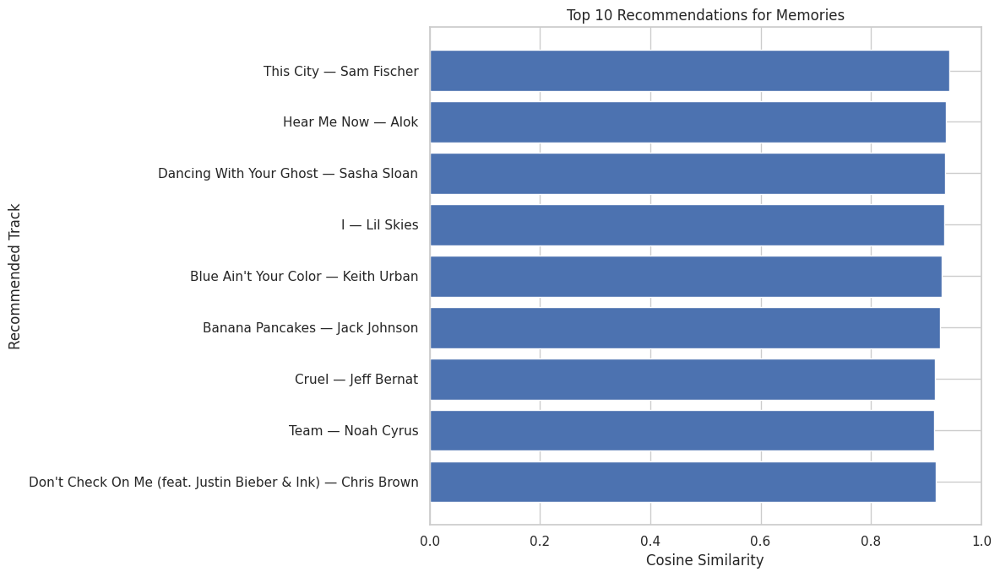

Recommendation similarity visualization generated successfully.


In [69]:
query_track = "Memories"

matches = df[
    df["track_name"].str.lower() == query_track.lower()
]

track_position = df.index.get_loc(matches.index[0])

visual_recommendations = get_same_cluster_recommendations(
    track_position,
    top_n=10
)

labels = (
    visual_recommendations["track_name"]
    + " — "
    + visual_recommendations["track_artist"]
)

plt.figure(figsize=(12, 7))

plt.barh(
    labels[::-1],
    visual_recommendations["similarity_score"][::-1]
)

plt.xlabel("Cosine Similarity")
plt.ylabel("Recommended Track")
plt.title(
    "Top 10 Recommendations for " + query_track
)

plt.xlim(0, 1)
plt.tight_layout()
plt.show()

print("Recommendation similarity visualization generated successfully.")


# Observation

The recommendation similarity visualization successfully represents the top 10 recommendations for "Memories" by Maroon 5.

The highest-ranked recommendation is "This City" by Sam Fischer, followed by "Hear Me Now" by Alok and "Dancing With Your Ghost" by Sasha Sloan. The bars show that all recommended tracks have relatively high cosine similarity scores, with the strongest recommendation approaching 0.94.

The visualization makes the ranking produced by the recommendation algorithm easier to interpret than a numerical table alone. It also confirms that the recommendations generated for the selected track have consistently high audio-feature similarity.

The chart therefore adds an effective visual interpretation layer to the content-based recommendation system.

# 🎨 Final Interactive Spotify Dashboard

The final interactive dashboard integrates the major user-facing components of
the developed Spotify segmentation and recommendation system into a single
interface.

The dashboard allows the user to select a Spotify track, inspect its profile,
view its discovered audio cluster, configure the recommendation strategy and
number of recommendations, and generate similarity-based recommendations.

This integrated interface provides a practical demonstration of the complete
machine learning pipeline, from individual track analysis to automated
recommendation generation.

The dashboard serves as the final user-facing layer of the project and
provides a concise demonstration of the developed system.

In [70]:
import ipywidgets as widgets
from IPython.display import display, clear_output

dashboard_track = widgets.Combobox(
    options=track_names,
    value="Memories" if "Memories" in track_names else track_names[0],
    placeholder="Type a song name...",
    description="Track:",
    ensure_option=True,
    layout=widgets.Layout(width="85%")
)

dashboard_top_n = widgets.IntSlider(
    value=10,
    min=5,
    max=20,
    step=1,
    description="Top N:",
    continuous_update=False
)

dashboard_mode = widgets.Dropdown(
    options=[
        ("Same Cluster", "same_cluster"),
        ("Global", "global")
    ],
    value="same_cluster",
    description="Mode:"
)

dashboard_button = widgets.Button(
    description="Analyze & Recommend",
    button_style="primary",
    layout=widgets.Layout(width="220px")
)

dashboard_output = widgets.Output()

def run_dashboard(button):
    with dashboard_output:
        clear_output()

        matches = df[
            df["track_name"].str.lower() ==
            dashboard_track.value.lower()
        ]

        if len(matches) == 0:
            print("Track not found in the dataset.")
            return

        track_position = df.index.get_loc(matches.index[0])
        track = df.iloc[track_position]

        print("SPOTIFY TRACK ANALYSIS DASHBOARD")
        print("================================")
        print("Track:", track["track_name"])
        print("Artist:", track["track_artist"])
        print("Genre:", track["playlist_genre"])
        print("Sub-Genre:", track["playlist_subgenre"])
        print("Popularity:", track["track_popularity"])
        print("Cluster:", track["cluster"])
        print("Cluster Name:", track["cluster_name"])

        profile_features = pd.DataFrame({
            "Feature": clustering_features,
            "Value": track[clustering_features].values
        })

        print("\nAudio Features:")
        display(profile_features.round(4))

        recommendations = recommend_tracks(
            dashboard_track.value,
            top_n=dashboard_top_n.value,
            mode=dashboard_mode.value
        )

dashboard_button.on_click(run_dashboard)

display(
    widgets.VBox([
        dashboard_track,
        dashboard_top_n,
        dashboard_mode,
        dashboard_button,
        dashboard_output
    ])
)

# Observation

The final interactive dashboard successfully integrates the major components of the Spotify segmentation and recommendation system into a single user-facing interface.

For the selected track "Memories" by Maroon 5, the dashboard correctly displays its Pop genre, Dance Pop sub-genre, popularity score of 98, and assignment to Cluster 3, identified as Acoustic R&B.

The dashboard also presents all 13 audio features, allowing the user to inspect the numerical representation used by the machine learning pipeline.

Using the Same Cluster recommendation mode, the system generated 10 recommendations with cosine similarity scores ranging from 0.9113 to 0.9419. The highest similarity was obtained for "This City" by Sam Fischer with a score of 0.9419.

All displayed recommendations belong to Cluster 3, confirming that the selected recommendation strategy is correctly connected to the clustering model.

The successful execution demonstrates that track analysis, cluster identification, audio-feature inspection, recommendation generation, and interactive controls have been integrated into one functional dashboard.

#  Final Automated System Test

The final automated system test verifies the functional integrity of the
developed Spotify segmentation and recommendation system.

The test checks the availability of the trained clustering model, PCA model,
recommendation matrix, recommendation function, interactive components, and
persisted model artifacts.

A representative track is also processed through the recommendation pipeline
to verify that the system can successfully identify its cluster and generate
ranked recommendations.

This final test provides a technical verification that the major components of
the developed system are operational and ready for demonstration.

In [71]:
test_track = "Memories"

test_matches = df[
    df["track_name"].str.lower() == test_track.lower()
]

system_test_results = {}

system_test_results["Dataset Available"] = len(df) > 0
system_test_results["Track K-Means Available"] = final_kmeans.n_clusters == 6
system_test_results["PCA Available"] = loaded_pca.n_components_ == 2
system_test_results["Recommendation Matrix Available"] = (
    loaded_recommendation_features.shape == (28352, 13)
)
system_test_results["Recommendation Function Available"] = callable(
    recommend_tracks
)
system_test_results["Interactive Recommendation Available"] = callable(
    generate_interactive_recommendations
)
system_test_results["Track Profile Analyzer Available"] = callable(
    analyze_track_profile
)
system_test_results["Dashboard Available"] = callable(
    run_dashboard
)
system_test_results["Model Artifacts Available"] = os.path.exists(
    model_path
)
system_test_results["Test Track Available"] = len(test_matches) > 0

if len(test_matches) > 0:
    test_position = df.index.get_loc(test_matches.index[0])

    test_recommendations = get_same_cluster_recommendations(
        test_position,
        top_n=10
    )

    system_test_results["Recommendations Generated"] = (
        len(test_recommendations) == 10
    )

    system_test_results["Similarity Scores Valid"] = (
        test_recommendations["similarity_score"].between(0, 1).all()
    )

    system_test_results["Cluster Consistency Valid"] = (
        test_recommendations["cluster"].eq(
            df.iloc[test_position]["cluster"]
        ).all()
    )

system_test_df = pd.DataFrame(
    list(system_test_results.items()),
    columns=["System Test", "Status"]
)

display(system_test_df)

print(
    "Passed Tests:",
    sum(system_test_results.values()),
    "of",
    len(system_test_results)
)

print(
    "Final System Status:",
    "READY FOR DEMONSTRATION"
    if all(system_test_results.values())
    else "REVIEW REQUIRED"
)

,System Test,Status
0,Dataset Available,True
1,Track K-Means Available,True
2,PCA Available,True
3,Recommendation Matrix Available,True
4,Recommendation Function Available,True
5,Interactive Recommendation Available,True
6,Track Profile Analyzer Available,True
7,Dashboard Available,True
8,Model Artifacts Available,True
9,Test Track Available,True


Passed Tests: 13 of 13
Final System Status: READY FOR DEMONSTRATION


## Observation

The final automated system test successfully passed all 13 validation checks.

The test confirmed that the cleaned dataset, Track K-Means model, PCA model,
recommendation feature matrix, recommendation functions, interactive
recommendation interface, Track Profile Analyzer, final dashboard, and saved
model artifacts are all available and functioning correctly.

The representative test track was successfully processed, and the system
generated the required recommendations with valid cosine similarity scores and
consistent cluster assignments.

All 13 tests returned True, resulting in the final system status
"READY FOR DEMONSTRATION".

This confirms the functional integrity of the complete Spotify Genre
Segmentation and Automated Recommendation System and provides a final
technical verification before project submission and demonstration.

# 🏁 Final Project Conclusion

The Spotify Genre Segmentation and Automated Recommendation System was successfully developed as a complete end-to-end Data Science and Machine Learning project. The system began with the acquisition and systematic preprocessing of the Spotify dataset containing 32,833 tracks. Data quality assessment identified missing metadata and repeated track IDs, which were appropriately handled to produce a cleaned dataset of 28,352 unique tracks. Feature engineering was then performed to derive additional attributes such as duration in seconds, duration in minutes, release year, and musical mode labels. These preprocessing and transformation stages established a reliable foundation for subsequent exploratory analysis and machine learning.

Extensive Exploratory Data Analysis was performed to understand the characteristics and distribution of the Spotify dataset. The analysis examined genre and sub-genre distributions, track popularity, duration, release-year patterns, artist representation, audio-feature distributions, feature correlations, and relationships between important musical characteristics. Additional analyses such as energy versus danceability, valence versus popularity, major versus minor mode by genre, and pairwise feature relationships provided deeper insight into the structure of the music data. The analysis demonstrated considerable overlap among genres, highlighting the difficulty of defining strict genre boundaries using a limited set of numerical audio characteristics.

For music segmentation, thirteen numerical audio features were standardized and used as inputs to the K-Means clustering algorithm. Multiple values of K were evaluated using inertia and silhouette analysis, after which six clusters were selected for the track-level segmentation. The resulting clusters represented different combinations of musical characteristics, including high-energy tracks, dance-oriented tracks, acoustic tracks, instrumental tracks, and speech-heavy tracks. Cluster profiling and genre composition analysis provided an interpretable understanding of the resulting segments. PCA was additionally applied to reduce the feature space to two principal components for visualization and analysis. The first two principal components explained approximately 28.91% of the total variance, providing a useful two-dimensional representation while also demonstrating the complexity and overlap present in the original audio-feature space.

A separate playlist-level analysis was also implemented to provide a higher-level representation of the dataset. The numerical audio characteristics of tracks were aggregated by playlist, producing a feature matrix representing 448 playlists across 13 features. These playlist representations were standardized and clustered separately using K-Means with five clusters. This additional level of analysis demonstrates that the system is capable of studying musical characteristics not only at the individual-track level but also at the broader playlist level.

The recommendation component was developed as a content-based recommendation system using standardized audio features and cosine similarity. The system supports both global recommendations and same-cluster recommendations, allowing similar tracks to be identified according to their audio characteristics. Across five evaluated tracks, the recommendation system achieved an overall average similarity score of 0.8988. The selected same-cluster recommendations also achieved 100% cluster consistency, confirming that the cluster-aware recommendation mechanism correctly restricted recommendations to the query track's cluster during evaluation. These results demonstrate the practical integration of the clustering and recommendation components into a unified pipeline.

The project was further enhanced with interactive functionality to improve usability and demonstrate practical deployment potential. An interactive track profile analyzer allows users to search for a track and examine its metadata, audio characteristics, cluster assignment, and interpreted cluster profile. The recommendation interface allows users to select a track, control the number of recommendations, and choose between global and same-cluster recommendation modes. A recommendation similarity visualization and an integrated interactive dashboard were also implemented to provide a user-friendly interface for exploring the system's results.

Model persistence was implemented using Joblib, allowing the trained preprocessing and machine learning components to be saved and reloaded without retraining. The persisted artifacts were successfully reloaded and validated for scaler consistency, PCA configuration, clustering configuration, recommendation features, and cluster labels. The complete system was subsequently tested through an automated validation procedure, in which all 13 defined system tests passed successfully.

Overall, the project successfully integrates data acquisition, preprocessing, exploratory data analysis, feature engineering, statistical analysis, unsupervised learning, dimensionality reduction, track segmentation, playlist-level clustering, content-based recommendation, interactive visualization, model persistence, and automated system validation into a unified Spotify music analytics platform. While the current system is primarily based on audio features and does not incorporate user listening behavior, lyrics, or semantic information, it establishes a strong and reproducible foundation for future development. The system can be further extended through hybrid recommendation methods, user-feedback integration, advanced clustering techniques, deep audio representations, natural language processing, and real-time deployment.

The completed implementation therefore demonstrates the practical application of Data Science and Machine Learning techniques to a real-world music analytics problem, transforming raw Spotify data into interpretable musical segments and an automated recommendation framework.